### Dependencies

In [1]:
import nbformat as nbf
from glob import glob

import uuid
def get_cell_id(id_length=8):
    return uuid.uuid4().hex[:id_length]

# your notebook name/keyword
nb_name = 'my_notebook'
notebooks = list(filter(lambda x: nb_name in x, glob("./*.ipynb", recursive=True)))

# iterate over notebooks
for ipath in sorted(notebooks):
    # load notebook
    ntbk = nbf.read(ipath, nbf.NO_CONVERT)
    
    cell_ids = []
    for cell in ntbk.cells:
        cell_ids.append(cell['id'])

    # reset cell ids if there are duplicates
    if not len(cell_ids) == len(set(cell_ids)): 
        for cell in ntbk.cells:
            cell['id'] = get_cell_id()

        nbf.write(ntbk, ipath)

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#sns.set_style('ticks')
sns.set_style('white')
import os
import math
import shutil
from mldeconv.cells_calculation import predict
from scipy.stats import mannwhitneyu, gmean, gaussian_kde, zscore
from tqdm import tqdm_notebook
from sklearn.metrics import roc_auc_score
from mldeconv.cells_plotting import print_cell
import warnings
from pathlib import Path
from IPython.display import display
from tqdm import tqdm_notebook

warnings.filterwarnings('ignore')

%config InlineBackend.figure_format = 'retina'
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', -1)

import bioreactor
from bioreactor.plotting import *
from bioreactor.use_colors import *
from bioreactor.annotation import *
from bioreactor.utils import *
from bioreactor.gsea import *
from bioreactor.graphs import *
from bioreactor.gsea import *
from bioreactor.pathway_scoring import *
from bioreactor.mutations import *
from bioreactor.ssgsea import *
from bioreactor.lollipop import *
from bioreactor.clustering import *
from bioreactor.expression import  *
from bioreactor.survival import  *
from bioreactor.pub_classify import *
from bioreactor.oncoplot2 import *
from bioreactor.cna import *
from bioreactor.qc import *
from bioreactor.cohort_data import *
bioreactor.__version__


'0.1.49'

In [3]:
from bioreactor.plotting import axis_matras, line_palette_annotation_plot, lin_colors, patch_plot

In [4]:
import mldeconv
from mldeconv.cells_calculation import predict_cells_by_xgb
from mldeconv.data_loading import read_expressions

In [5]:
from mldeconv.models.tumor_model import TumorModel
import yaml

model = TumorModel.load('/uftp/Deconvolution/product/new_models/blood_cd4mem_v1')

In [6]:
def get_gspread(table, sheet, index_col='Sample', path_to_json=None): 
    """
    Access Google Sheets via python
    
    :param path_to_json: absolute path to JSON containing creditials for Google API
    :param table: Annotation calculated, for instance
    :param sheet: Blood, for instance
    :param index_col: column number
    :return: pandas DataFrame
    """
    from oauth2client.service_account import ServiceAccountCredentials
    import gspread
    
    if path_to_json == None:
        path_to_json = '/uftp/Blood/google_secret.json'

    credentials = ServiceAccountCredentials.from_json_keyfile_name(
        path_to_json)  # Your json file here
    gc = gspread.authorize(credentials)

    # open table
    wks = gc.open(table)
    # select sheet
    sheet = wks.worksheet(sheet)
    data = pd.DataFrame(sheet.get_all_records())
    data = data.set_index(index_col)
    return data

In [7]:
import rpy2.robjects as ro 
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

def edgeR_DE(df, ranges):
    """
    Run edgeR for DE
    :param df: pd.concat([group1, group2], axis=1), expression should be in counts
    :param ranges: string, like '21x24'
    """
    
    pandas2ri.activate()
    try:
        run_edgeR_DE = ro.r(
        """
        function(df, ranges) {
            
            library(edgeR)

            # Extract the experimental design
            design = unlist(strsplit(ranges, 'x'))

            # Find the desing counts.
            cond1_num = as.integer(design[1])
            cond2_num = as.integer(design[2])

            # Set up the conditions based on the experimental setup.
            cond_1 = rep("cond1", cond1_num)
            cond_2 = rep("cond2", cond2_num)

            # Read the input table.
            counts = df

            # Create the groups.
            group=c(cond_1, cond_2)

            dge <- DGEList(counts=counts, group=group)
            dis <- estimateCommonDisp(dge)
            tag <- estimateTagwiseDisp(dis)

            # This performs a pairwise comparison.
            etx <- exactTest(tag)
            etp <- topTags(etx, n=100000, sort.by="p.value")

            result = etp$table

            return(result)
        }""")

        edgeR_DE_result = run_edgeR_DE(df, ranges)

        with localconverter(ro.default_converter + pandas2ri.converter):
            pd_from_r_df = ro.conversion.rpy2py(edgeR_DE_result)

        return edgeR_DE_result
    finally:
        pandas2ri.deactivate()

In [8]:
def read_renorm_expressions(expr):
    
    genes_in_expressions = read_dataset('/uftp/Deconvolution/product/training/genes/genes_v2.tsv')
    genes = list(set(expr.index) & set(genes_in_expressions.index))
    renormed_expr = expr.loc[genes].div(expr.loc[genes].sum(axis=0),
                                        axis='columns') * 1e6
    return renormed_expr

In [9]:
# проверка на то, что у каждого сампла есть экспрессия
def compare_df_annotation_with_df_expression(df_annotation, df_expression):
    idx = df_expression.columns.intersection(df_annotation.index)
    df_expression = df_expression[idx]
    df_annotation = df_annotation.loc[idx]
    return (df_annotation, df_expression)

In [10]:
# обычный юз edgeR, ток функцией
def calculate_diff_expr_between_two_group(df_expression, group_control, group_interest, interesting_genes):
    len_group = 'x'.join([str(len(list(group_control))), str(len(list(group_interest)))])
    df_res = edgeR_DE(df_expression.loc[:, list(group_control) + list(group_interest)], len_group)
    return df_res

In [11]:
# из полного листа edgeR рисуется строчка из генов и их значений logFC и статистической значимости для каждой из сравнительных пар
# то, что я в эксель обычно пихаю вручную
def draw_logFC_stat(df_DE, list_gene, size_needed, p_value=True, FDR=False):
    df_DE['stat'] = str()
    if p_value:
        for gene in list_gene:
            if df_DE.loc[gene,'PValue'] < 0.05:
                df_DE.loc[gene,'stat'] = 'statistical significance'
            else:
                df_DE.loc[gene,'stat'] = 'non statistical significance'
    if FDR:
        for gene in list_gene:
            if df_DE.loc[gene,'FDR'] > 0.1:
                df_DE.loc[gene,'stat'] = 'non statistical significance'
    
    patch_plot(lin_colors(df_DE.loc[list_gene,'stat']), legend_right=True, 
           vertical=True, h=6, show_ticks=True)
    plt.figure(figsize=size_needed)
    
    af = axis_matras([.3, 2], x_len=size_needed[0])
    line_palette_annotation_plot(df_DE.loc[list_gene,'stat'], ax=next(af), 
                                     palette=lin_colors(df_DE.loc[list_gene,'stat']))
    
    sns.heatmap(df_DE.loc[list_gene,['logFC']].T, annot = True, vmin=-4, vmax=4, center =0,
                    cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=True,
                cbar=False, ax=next(af))

In [12]:
# способ проверки сортировки клеток. показывает долю каких-то популяций в образцах (а образцы поделены на группы)
# отдельно подается лист с экспрессиями на каждую группу
# мне этим нет смысла пользоваться никакого, так как в модели деконволюции лишь 4 вида B клеток
def plot_most_big_cell_type(model_1, list_df_expr, list_name, n, list_cell_interest=None):
    colors=sns.color_palette('hls', len(list_df_expr))
    plt.figure(figsize=(10,5))
    bw = 0.1
    #find common cells with big populations
    list_df_cell_fraction_sorted = []
    list_common_cells = []
    for df_expr in list_df_expr:
        cell_fraction_1 = model_1.predict(df_expr)
        list_cells = list(set(list(cell_fraction_1.index)))
        m = np.zeros((len(list_cells), df_expr.shape[1]))
        cell_fraction = pd.DataFrame(m)
        cell_fraction.index = list_cells
        cell_fraction.columns = df_expr.columns
        for cell in cell_fraction.index:
            for sample in cell_fraction.columns:
                l = []
                if cell in cell_fraction_1.index:
                    l.append(cell_fraction_1.loc[cell, sample])
                cell_fraction.loc[cell, sample] = np.mean(l)
        cell_fraction_sorted = cell_fraction.mean(axis=1).sort_values(ascending=False)
        list_common_cells += list(cell_fraction_sorted.index[:n])
        list_df_cell_fraction_sorted.append(cell_fraction_sorted)
    list_common_cells = list(set(list_common_cells + list_cell_interest))
    index = np.arange(len(list_common_cells))
    dict_c =  {}
    for (name, cell_fraction_sorted, color, i) in zip(list_name, list_df_cell_fraction_sorted, 
                                                      colors, range(len(list_name))):
        
        dict_c[name] = cell_fraction_sorted
        plt.bar(index + i *bw, cell_fraction_sorted.loc[list_common_cells], bw , color=color, label=name)
    plt.xticks(index+(len(list_name)//2)*bw, list_common_cells, rotation=-90, fontsize='large')
    plt.ylabel('TPM', fontsize='large')
    plt.legend(fontsize='large', 
               bbox_to_anchor=(1.05, 0), loc=3, borderaxespad=0)
    plt.plot()
    return dict_c

In [16]:
#строит ток если топ 5 - б клетки

def genes_expression_chart(
    gene,
    num_cells_to_show=10,
    cell_subset=None,
    figsize=(12, 7),
    show_blood=True,
    include_stimulations=False,
    path_to_cells='/uftp/Blood/Users/aeremin/mean_cells.tsv',
    path_to_wb='/uftp/Blood/Users/aeremin/whole_blood_datasets_stats_90perc.tsv',
    path_to_pbmc='/uftp/Blood/Users/aeremin/pbmc_datasets_stats_90perc.tsv'):

    from bioreactor.plotting import lin_colors
    from bioreactor.utils import read_dataset
    
    sns.set(style='white')
    blood_cell_types = [
        #'Activated_CD8_T_cells', 
        'B_cells', 
        'Basophils',
        'CD19_B_progenitors',
        #'CD3_CD56_T_cells', 
        'CD4_T_cells', 
        'CD4_T_helpers', 
        'CD4_Tregs',
        'CD8_Central_Memory', 
        'CD8_Naive_T_cells', 
        'CD8_TEMRA', 
        'CD8_T_cells',
        'CD8_T_cells_PD1_high', 
        'CD8_T_cells_PD1_low',
        'CD8_Transitional_Memory', 
        'Central_memory_CD4_T_cells',
        'Class-switched_memory ', 
        'Classical_monocytes', 
        #'Cytotoxic_NK_cells',
        'Eff_and_transit_memory_CD4_T_cells',
        'Eff_and_transit_memory_CD8_T_cells', 
        'Effector_memory_CD4_T_cells',
        #'Eosinophils', 
        'Granulocytes', 
        #'IgM_memory_B_cells', 
        'Inter_monocytes',
        #'Lymphocytes', 
        'MAIT_cells', 
        'Mature-naive_B_cells', 
        'Memory_B_cells',
        'Memory_CD4_T_cells', 
        'Memory_CD8_T_cells', 
        'Memory_exhausted_B_cells',
        'Monocytes', 
        'NK_cells', 
        #'NK_cells_line', 
        'Naive_B_cells',
        'Naive_CD4_T_cells', 
        'Neutrophils', 
        'Non-classical_monocytes',
        'Non-switch_memory_IgM_B_cells', 
        'Non_plasma_B_cells',
        'Plasma_B_cells', 
        #'Plasma_cells', 
        'Plasmacytoid_dendritic_cells',
        #'Platelets', 
        #'Regulatory_NK_cells', 
        'T_cells', 
        'Th17_cells',
        'Th1_cells', 
        'Th2_cells', 
        'gdT_cells', 
        #'iNKT'
    ]
    stimulation_ds = ['GSE115203', 'GSE110325', 'GSE122438', 'GSE136310', 'GSE122058',
       'GSE128627', 'GSE102677', 'GSE120502', 'GSE96783', 'GSE110041',
       'GSE72502', 'GSE121315', 'GSE135964', 'GSE79027', 'GSE60481',
       'GSE98884', 'GSE95573', 'GSE123523', 'E-MTAB-9066', 'GSE152179',
       'GSE135192', 'GSE154911', 'GSE155918', 'GSE74235', 'E-MTAB-8290',
       'GSE157148', 'GSE35394', 'GSE120178', 'GSE42960', 'GSE119835',
       'GSE126049', 'GSE126050', 'GSE113465', 'GSE161031', 'GSE161752',
       'GSE120784', 'GSE160322', 'GSE151159', 'GSE126091', 'GSE110989',
       'GSE110745', 'GSE108796', 'GSE110744', 'GSE121084', 'GSE94800',
       'GSE156124', 'GSE153122', 'PRJNA493983', 'PRJNA473147',
       'PRJNA377124', 'GSE162746', 'GSE168698', 'GSE169030', 'GSE143780',
       'GSE122682', 'GSE159094', 'GSE131590']
    
    # plot only blood cell types
    if show_blood:
        cells = read_dataset(path_to_cells)[blood_cell_types]
        tissues_wb = read_dataset(path_to_wb)
        tissues_pbmc = read_dataset(path_to_pbmc)
    else:
        cells = read_dataset(path_to_cells)
        tissues_wb = read_dataset(path_to_wb)
        tissues_pbmc = read_dataset(path_to_pbmc)

    # don't account for stimulated onces
    if not include_stimulations:
        tissues_wb = tissues_wb[~tissues_wb.index.isin(stimulation_ds)].mean().rename('Whole_blood')
        tissues_pbmc = tissues_pbmc[~tissues_pbmc.index.isin(stimulation_ds)].mean().rename('PBMC')
        tissues = pd.concat([tissues_wb, tissues_pbmc], axis=1)
    else:
        tissues_wb = tissues_wb.mean(axis=1).rename('Whole_blood')
        tissues_pbmc = tissues_pbmc.mean(axis=1).rename('PBMC')
        tissues = pd.concat([tissues_wb, tissues_pbmc], axis=1)
    

    if cell_subset:
        exp_1 = cells.loc[gene].sort_values(ascending=False)[cell_subset]
    else:
        exp_1 = cells.loc[gene].sort_values(
            ascending=False)[:num_cells_to_show]
    
    exp_2 = tissues.loc[gene].sort_values(ascending=False)
    

    need = ['B_cells',
            'CD19_B_progenitors',
        'Mature-naive_B_cells', 
        'Memory_B_cells',
        'Memory_exhausted_B_cells',
        'Naive_B_cells',
        'Non-switch_memory_IgM_B_cells', 
        'Non_plasma_B_cells',
        'Plasma_B_cells',
        'Class-switched_memory ',
        'IgM_memory_B_cells',
        'Plasma_cells'
        ]
    five_biggest = list(exp_1.index)[:5]
    list_need_cells = list(set(five_biggest) & set(need))
    
    if len(list_need_cells) < 5: 
        print(gene)
 
    else:
        fig, axes = plt.subplots(1, 2, figsize=figsize, constrained_layout=True)
        plt.suptitle(gene, fontweight='bold', fontsize=16)
        
        palette_1 = lin_colors(exp_1.index)
        palette_2 = lin_colors(exp_2.index)
    
        axes[0].set_title('Blood cell type', size=15)
        axes[0].set_xticklabels(exp_1.index, rotation="vertical", fontsize=12)
        axes[0].set_ylabel('mean expression, TPM')

        axes[1].set_title('Blood sample type', size=15)
        axes[1].set_xticklabels(exp_2.index, rotation="vertical", fontsize=12)

        exp_1.plot(kind="bar",
                   ax=axes[0],
                   color=list(exp_1.index.map(palette_1)),
                   grid=False)
        exp_2.plot(kind="bar",
                   ax=axes[1],
                   color=list(exp_2.index.map(palette_2)),
                   grid=False)
        plt.tight_layout()
        
        plt.savefig(f'{gene}'+'.png')

In [17]:
#строит для всех типов клеток

def genes_expression_chart_all(
    gene,
    num_cells_to_show=10,
    cell_subset=None,
    figsize=(12, 7),
    show_blood=True,
    include_stimulations=False,
    path_to_cells='/uftp/Blood/Users/aeremin/mean_cells.tsv',
    path_to_wb='/uftp/Blood/Users/aeremin/whole_blood_datasets_stats_90perc.tsv',
    path_to_pbmc='/uftp/Blood/Users/aeremin/pbmc_datasets_stats_90perc.tsv'):

    from bioreactor.plotting import lin_colors
    from bioreactor.utils import read_dataset
    
    sns.set(style='white')
    blood_cell_types = [
        'Activated_CD8_T_cells', 
        'B_cells', 
        'Basophils',
        'CD19_B_progenitors',
        'CD4_T_cells', 
        'CD4_T_helpers', 
        'CD4_Tregs',
        'CD8_Central_Memory', 
        'CD8_Naive_T_cells', 
        'CD8_TEMRA', 
        'CD8_T_cells',
        'CD8_T_cells_PD1_high', 
        'CD8_T_cells_PD1_low',
        'CD8_Transitional_Memory', 
        'Central_memory_CD4_T_cells',
        'Class-switched_memory ', 
        'Classical_monocytes', 
        'Cytotoxic_NK_cells',
        'Eff_and_transit_memory_CD4_T_cells',
        'Eff_and_transit_memory_CD8_T_cells', 
        'Effector_memory_CD4_T_cells',
        'Eosinophils', 
        'Granulocytes', 
        'Inter_monocytes',
        'Lymphocytes', 
        'MAIT_cells', 
        'Mature-naive_B_cells', 
        'Memory_B_cells',
        'Memory_CD4_T_cells', 
        'Memory_CD8_T_cells', 
        'Memory_exhausted_B_cells',
        'Monocytes', 
        'NK_cells', 
        'NK_cells_line', 
        'Naive_B_cells',
        'Naive_CD4_T_cells', 
        'Neutrophils', 
        'Non-classical_monocytes',
        'Non-switch_memory_IgM_B_cells', 
        'Non_plasma_B_cells',
        'Plasma_B_cells', 
        'Plasma_cells', 
        'Plasmacytoid_dendritic_cells',
        'Platelets', 
        'Regulatory_NK_cells', 
        'T_cells', 
        'Th17_cells',
        'Th1_cells', 
        'Th2_cells', 
        'gdT_cells', 
        'iNKT'
    ]
    stimulation_ds = ['GSE115203', 'GSE110325', 'GSE122438', 'GSE136310', 'GSE122058',
       'GSE128627', 'GSE102677', 'GSE120502', 'GSE96783', 'GSE110041',
       'GSE72502', 'GSE121315', 'GSE135964', 'GSE79027', 'GSE60481',
       'GSE98884', 'GSE95573', 'GSE123523', 'E-MTAB-9066', 'GSE152179',
       'GSE135192', 'GSE154911', 'GSE155918', 'GSE74235', 'E-MTAB-8290',
       'GSE157148', 'GSE35394', 'GSE120178', 'GSE42960', 'GSE119835',
       'GSE126049', 'GSE126050', 'GSE113465', 'GSE161031', 'GSE161752',
       'GSE120784', 'GSE160322', 'GSE151159', 'GSE126091', 'GSE110989',
       'GSE110745', 'GSE108796', 'GSE110744', 'GSE121084', 'GSE94800',
       'GSE156124', 'GSE153122', 'PRJNA493983', 'PRJNA473147',
       'PRJNA377124', 'GSE162746', 'GSE168698', 'GSE169030', 'GSE143780',
       'GSE122682', 'GSE159094', 'GSE131590']
    
    # plot only blood cell types
    if show_blood:
        cells = read_dataset(path_to_cells)[blood_cell_types]
        tissues_wb = read_dataset(path_to_wb)
        tissues_pbmc = read_dataset(path_to_pbmc)
    else:
        cells = read_dataset(path_to_cells)
        tissues_wb = read_dataset(path_to_wb)
        tissues_pbmc = read_dataset(path_to_pbmc)

    # don't account for stimulated onces
    if not include_stimulations:
        tissues_wb = tissues_wb[~tissues_wb.index.isin(stimulation_ds)].mean().rename('Whole_blood')
        tissues_pbmc = tissues_pbmc[~tissues_pbmc.index.isin(stimulation_ds)].mean().rename('PBMC')
        tissues = pd.concat([tissues_wb, tissues_pbmc], axis=1)
    else:
        tissues_wb = tissues_wb.mean(axis=1).rename('Whole_blood')
        tissues_pbmc = tissues_pbmc.mean(axis=1).rename('PBMC')
        tissues = pd.concat([tissues_wb, tissues_pbmc], axis=1)
    

    if cell_subset:
        exp_1 = cells.loc[gene].sort_values(ascending=False)[cell_subset]
    else:
        exp_1 = cells.loc[gene].sort_values(
            ascending=False)[:num_cells_to_show]
    
    exp_2 = tissues.loc[gene].sort_values(ascending=False)
    

    fig, axes = plt.subplots(1, 2, figsize=figsize, constrained_layout=True)
    plt.suptitle(gene, fontweight='bold', fontsize=16)
        
    palette_1 = lin_colors(exp_1.index)
    palette_2 = lin_colors(exp_2.index)
    
    axes[0].set_title('Blood cell type', size=15)
    axes[0].set_xticklabels(exp_1.index, rotation="vertical", fontsize=12)
    axes[0].set_ylabel('mean expression, TPM')

    axes[1].set_title('Blood sample type', size=15)
    axes[1].set_xticklabels(exp_2.index, rotation="vertical", fontsize=12)

    exp_1.plot(kind="bar",
                ax=axes[0],
                color=list(exp_1.index.map(palette_1)),
                grid=False)
    exp_2.plot(kind="bar",
                ax=axes[1],
                color=list(exp_2.index.map(palette_2)),
                grid=False)
    plt.tight_layout()

In [19]:
#считает процентное содержание гена в B клетках для любых генов (без правильных коэффициентов)

def genes_expression_chart_all_procent(
    gene,
    cell_subset=None,
    figsize=(12, 7),
    show_blood=True,
    path_to_cells='/uftp/Blood/Users/aeremin/mean_cells.tsv'):

    from bioreactor.plotting import lin_colors
    from bioreactor.utils import read_dataset
    
    sns.set(style='white')
    blood_cell_types = [
        'Activated_CD8_T_cells', 
        'B_cells', 
        'Basophils',
        'CD19_B_progenitors',
        'CD4_T_cells', 
        'CD4_T_helpers', 
        'CD4_Tregs',
        'CD8_Central_Memory', 
        'CD8_Naive_T_cells', 
        'CD8_TEMRA', 
        'CD8_T_cells',
        'CD8_T_cells_PD1_high', 
        'CD8_T_cells_PD1_low',
        'CD8_Transitional_Memory', 
        'Central_memory_CD4_T_cells',
        'Class-switched_memory ', 
        'Classical_monocytes', 
        'Cytotoxic_NK_cells',
        'Eff_and_transit_memory_CD4_T_cells',
        'Eff_and_transit_memory_CD8_T_cells', 
        'Effector_memory_CD4_T_cells',
        'Eosinophils', 
        'Granulocytes', 
        'IgM_memory_B_cells', 
        'Inter_monocytes',
        'Lymphocytes', 
        'MAIT_cells', 
        'Mature-naive_B_cells', 
        'Memory_B_cells',
        'Memory_CD4_T_cells', 
        'Memory_CD8_T_cells', 
        'Memory_exhausted_B_cells',
        'Monocytes', 
        'NK_cells', 
        'NK_cells_line', 
        'Naive_B_cells',
        'Naive_CD4_T_cells', 
        'Neutrophils', 
        'Non-classical_monocytes',
        'Non-switch_memory_IgM_B_cells', 
        'Non_plasma_B_cells',
        'Plasma_B_cells', 
        'Plasma_cells', 
        'Plasmacytoid_dendritic_cells',
        'Platelets', 
        'Regulatory_NK_cells', 
        'T_cells', 
        'Th17_cells',
        'Th1_cells', 
        'Th2_cells', 
        'gdT_cells', 
        'iNKT'
    ]   
    # plot only blood cell types
    if show_blood:
        cells = read_dataset(path_to_cells)[blood_cell_types]
 
    else:
        cells = read_dataset(path_to_cells)

    

    if cell_subset:
        exp_1 = cells.loc[gene].sort_values(ascending=False)[cell_subset]
    else:
        exp_1 = cells.loc[gene].sort_values(
            ascending=False)
    
    df1 = pd.DataFrame(exp_1)
    
    B_cells = ['CD19_B_progenitors', 
           'Plasma_B_cells', 
           'Plasma_cells', 
           'B_cells',      
           'Memory_exhausted_B_cells', 
           'Naive_B_cells', 
           'Non_plasma_B_cells', 
           'Memory_B_cells', 
           'Class-switched_memory ',
           'Mature-naive_B_cells', 
           'Non-switch_memory_IgM_B_cells', 
           'IgM_memory_B_cells']
    
    df1_B_cells = df1.loc[df1.index.isin(B_cells)]
    
    count_with_B = 0
    for ind in df1_B_cells.index:
        count_with_B += df1_B_cells[gene][ind]
    
    count_all = 0
    for ind in df1.index:
        count_all += df1[gene][ind]
    
    final_procent = count_with_B/count_all * 100
    print(gene, final_procent)


# Литературные сигнатуры: GSE156195

## GSE156195 download

In [13]:
cells = get_gspread('Annotation calculated', 'Cells_to_check')

In [14]:
cells_GSE156195 = cells[cells.Dataset == 'GSE156195']
cells_GSE156195

,Run,Dataset,Cell type,Cell_type_details,Extended_details,Stimulation,Therapy,Modification,Diagnosis,GSM,Sorting_markers,Comment,Cell_origin,Rna_extraction_kit,Library_preparation_kit,Cells_isolation_kit,Donor_id,Gender,Age,Age_range,PMID,Material_type,Layout,Readcounts,To_check,QC_bad,QC_good,QC_score,Who_checks,Decision,Expression_comment,Run_id,Sample_id,Run_tiledb_id,Sample_tiledb_id,Spike_in,Response,Material_sampling_time,Only for target (CR type),Prior_surgery,Diagnosis_comment,Stage,Combo_class,Measurement_method,Race/Ethnicity,UMI (Only for target),Deconvolution_cell_type,Filter_tag,Severity,
Sample,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
SRX8943716,SRR12449220,GSE156195,B_cells,,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4726507,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorA,No_data,Adult,,33027651,polyA RNA,SINGLE,17322012,,,,7,,,,116554,93101,108957,85148,,,,,,,,,,,,B_cells,,,
SRX8943717,SRR12449221,GSE156195,B_cells,,,Hour_72_of_IFN-lambda,Without_therapy,Without_modification,Healthy,GSM4726508,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorA,No_data,Adult,,33027651,polyA RNA,SINGLE,13238652,,,,7,,,,116566,93113,108968,85161,,,,,,,,,,,,B_cells,,,
SRX8943718,SRR12449222,GSE156195,B_cells,,,Hour_72_of_anti-IgM,Without_therapy,Without_modification,Healthy,GSM4726509,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorA,No_data,Adult,,33027651,polyA RNA,SINGLE,12152161,,,,7,,,,116584,93131,108987,85179,,,,,,,,,,,,B_cells,,,
SRX8943719,SRR12449223,GSE156195,B_cells,,,Hour_72_of_anti-IgM_and_IFN-lambda,Without_therapy,Without_modification,Healthy,GSM4726510,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorA,No_data,Adult,,33027651,polyA RNA,SINGLE,18086665,,,,7,,,,116571,93118,108974,85167,,,,,,,,,,,,B_cells,,,
SRX8943720,SRR12449224,GSE156195,B_cells,,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4726511,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorB,No_data,Adult,,33027651,polyA RNA,SINGLE,18891873,,,,7,,,,116568,93115,108970,85163,,,,,,,,,,,,B_cells,,,
SRX8943721,SRR12449225,GSE156195,B_cells,,,Hour_72_of_IFN-lambda,Without_therapy,Without_modification,Healthy,GSM4726512,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorB,No_data,Adult,,33027651,polyA RNA,SINGLE,19460582,,,,7,,,,116570,93117,108973,85165,,,,,,,,,,,,B_cells,,,
SRX8943722,SRR12449226,GSE156195,B_cells,,,Hour_72_of_anti-IgM,Without_therapy,Without_modification,Healthy,GSM4726513,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorB,No_data,Adult,,33027651,polyA RNA,SINGLE,15948875,,,,7,,,,116560,93107,108963,85155,,,,,,,,,,,,B_cells,,,
SRX8943723,SRR12449227,GSE156195,B_cells,,,Hour_72_of_anti-IgM_and_IFN-lambda,Without_therapy,Without_modification,Healthy,GSM4726514,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorB,No_data,Adult,,33027651,polyA RNA,SINGLE,17920749,,,,7,,,,116564,93110,108967,85159,,,,,,,,,,,,B_cells,,,
SRX8943724,SRR12449228,GSE156195,B_cells,,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4726515,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorC,No_data,Adult,,33027651,polyA RNA,SINGLE,27509550,,,,7,,,,116590,93137,108992,85185,,,,,,,,,,,,B_cells,,,


In [15]:
cells_GSE156195 = cells_GSE156195[(cells_GSE156195.Readcounts > 5000000)
                                & (cells_GSE156195.QC_score > 4)]

In [16]:
# в словарь записывает, какие сэмплы к каким стимуляциям относятся

dict_stimulations = {}
for stimul in cells_GSE156195.Stimulation.unique():
    dict_stimulations[stimul] = cells_GSE156195[cells_GSE156195.Stimulation == stimul].index

dict_stimulations

{'Without_stimulation': Index(['SRX8943716', 'SRX8943720', 'SRX8943724', 'SRX8943728', 'SRX8943732'], dtype='object', name='Sample'),
 'Hour_72_of_IFN-lambda': Index(['SRX8943717', 'SRX8943721', 'SRX8943725', 'SRX8943729'], dtype='object', name='Sample'),
 'Hour_72_of_anti-IgM': Index(['SRX8943718', 'SRX8943722', 'SRX8943726', 'SRX8943730', 'SRX8943733',
        'SRX8943735'],
       dtype='object', name='Sample'),
 'Hour_72_of_anti-IgM_and_IFN-lambda': Index(['SRX8943719', 'SRX8943723', 'SRX8943727', 'SRX8943731', 'SRX8943734',
        'SRX8943736'],
       dtype='object', name='Sample')}

In [17]:
expr_counts = read_expressions(cells_GSE156195, suf='-kallisto-Xena-gene-est_counts_without_noncoding.tsv')

In [18]:
expr_TPM = read_expressions(cells_GSE156195, suf='-kallisto-Xena-gene-TPM_without_noncoding.tsv')
expr_TPM = read_renorm_expressions(expr_TPM)

In [77]:
#cells_GSE156195, expr_counts = compare_df_annotation_with_df_expression(cells_GSE156195, expr_counts)
#cells_GSE156195, expr_TPM = compare_df_annotation_with_df_expression(cells_GSE156195, expr_TPM)

#cells_GSE156195 = cells_GSE156195.sort_values(by=['Donor_id'])

In [31]:
list_Stimulation_no_control = ['Hour_72_of_anti-IgM_and_IFN-lambda', 
                    'Hour_72_of_anti-IgM', 
                    'Hour_72_of_IFN-lambda']

In [30]:
# интересующих список маркеров
list_gene_marker = ['TNFSF4', 
                    'ICOSLG', 
                    'CD38', 
                    'FAS', 
                    'IL2RA', 
                    'CD44', 
                    'CD274', 
                    'CD81', 
                    'CD22', 
                    'TFRC', 
                    'SLC3A2',  
                    'ITGA4', 
                    'ITGB1', 
                    'FCER2', 
                #    'B3GAT1', 
                    'CD40', 
                    'CD69', 
                    'CD70', 
                    'CD80', 
                    'CD83', 
                    'CD86']

## EDA analysis

<AxesSubplot:xlabel='Stimulation'>

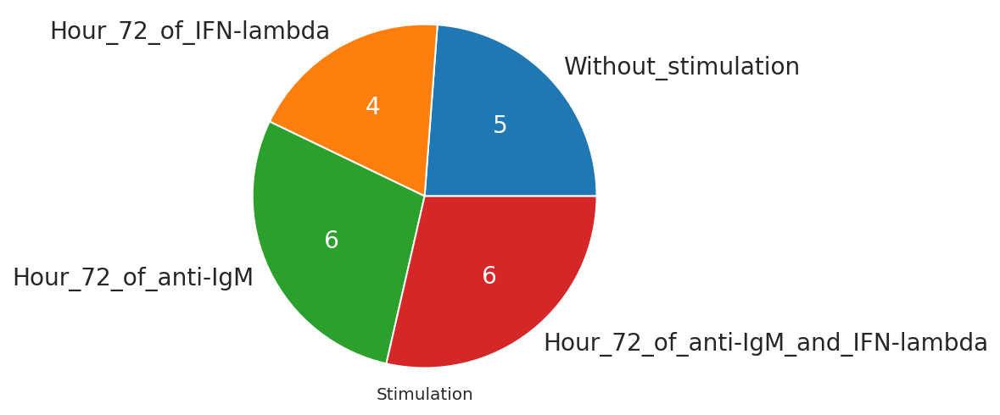

In [108]:
vector_pie_plot(cells_GSE156195.Stimulation, display_counts=True)

In [23]:
a = 'donorA'
b = 'donorB'
c = 'donorC'
d = 'donorD'
e = 'donorE'
f = 'donorF'
for i in cells_GSE156195.index:
    if a in cells_GSE156195.loc[i, 'Donor_id']:
        cells_GSE156195.loc[i, 'Donor_id'] = a
    elif b in cells_GSE156195.loc[i, 'Donor_id']:
        cells_GSE156195.loc[i, 'Donor_id'] = b
    elif c in cells_GSE156195.loc[i, 'Donor_id']:
        cells_GSE156195.loc[i, 'Donor_id'] = c
    elif d in cells_GSE156195.loc[i, 'Donor_id']:
        cells_GSE156195.loc[i, 'Donor_id'] = d
    elif e in cells_GSE156195.loc[i, 'Donor_id']:
        cells_GSE156195.loc[i, 'Donor_id'] = e
    elif f in cells_GSE156195.loc[i, 'Donor_id']:
        cells_GSE156195.loc[i, 'Donor_id'] = f

<AxesSubplot:xlabel='Donor_id'>

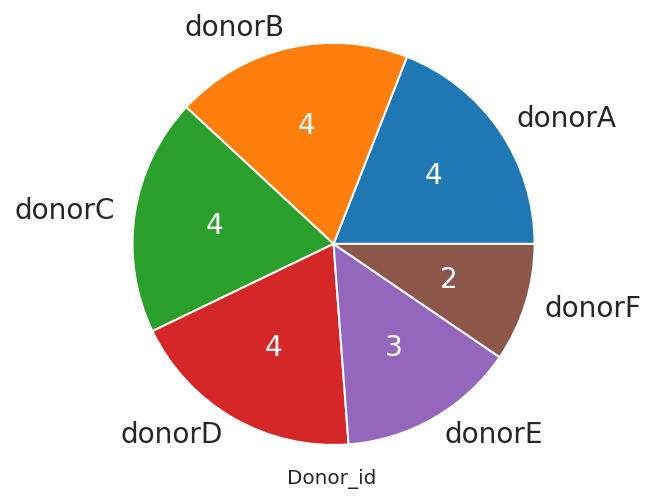

In [110]:
vector_pie_plot(cells_GSE156195.Donor_id, display_counts=True)

<AxesSubplot:xlabel='Diagnosis'>

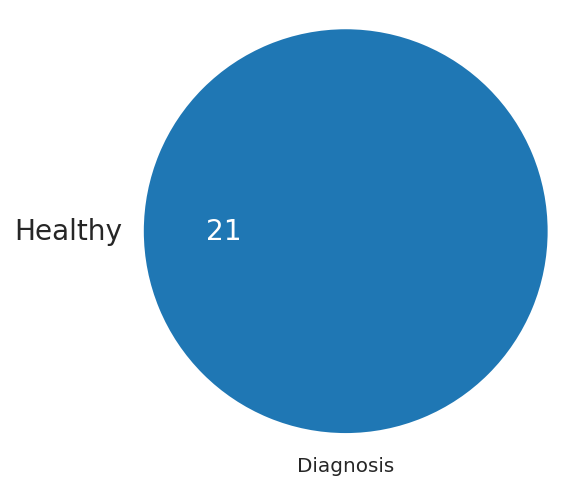

In [111]:
vector_pie_plot(cells_GSE156195.Diagnosis, display_counts=True)

<AxesSubplot:title={'center':'Donor F'}, xlabel='Stimulation'>

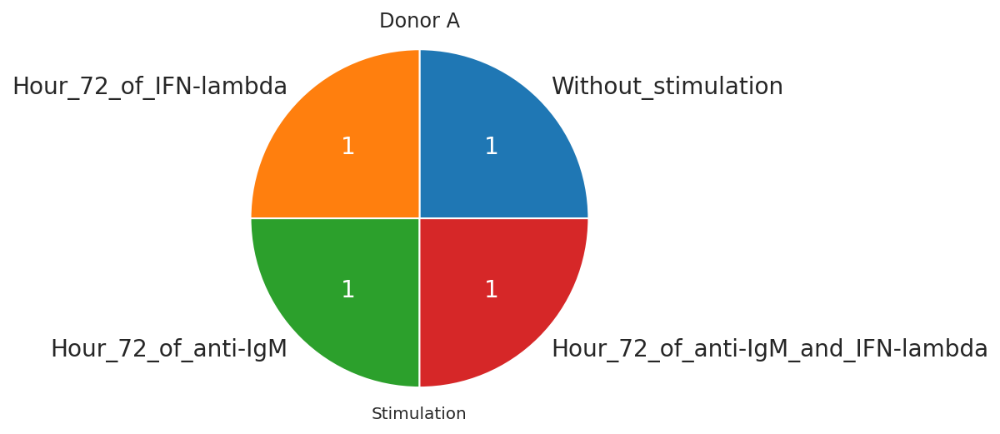

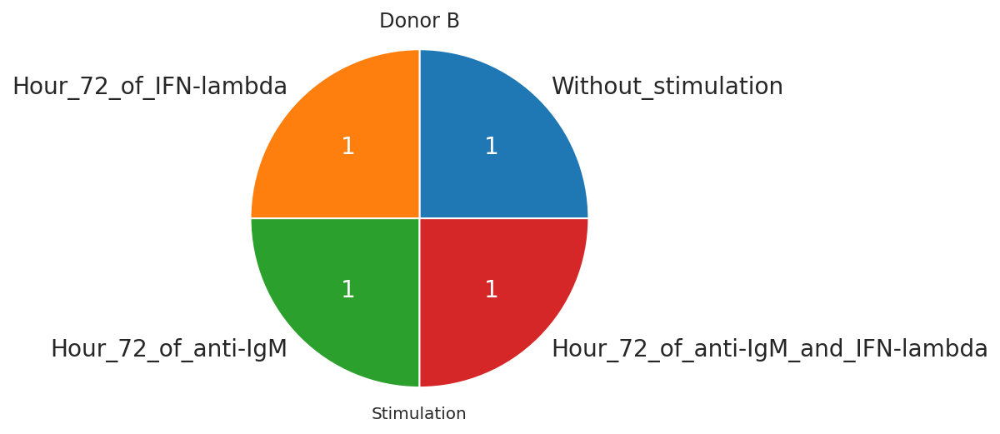

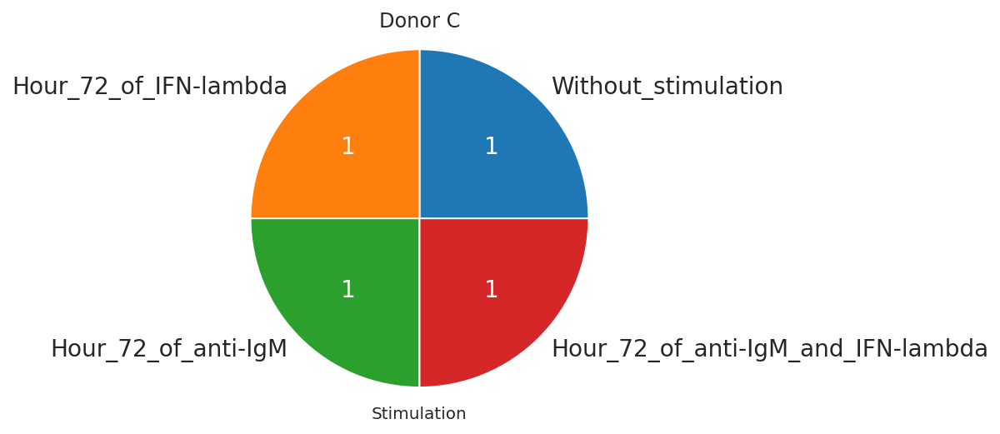

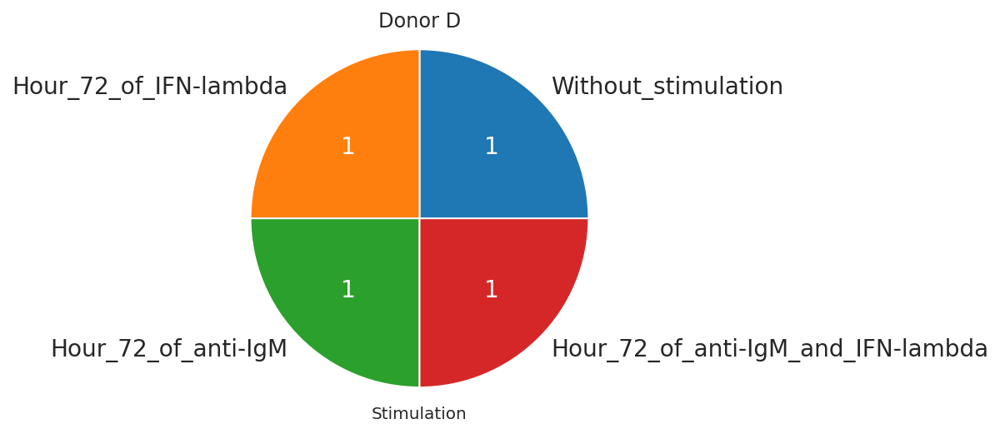

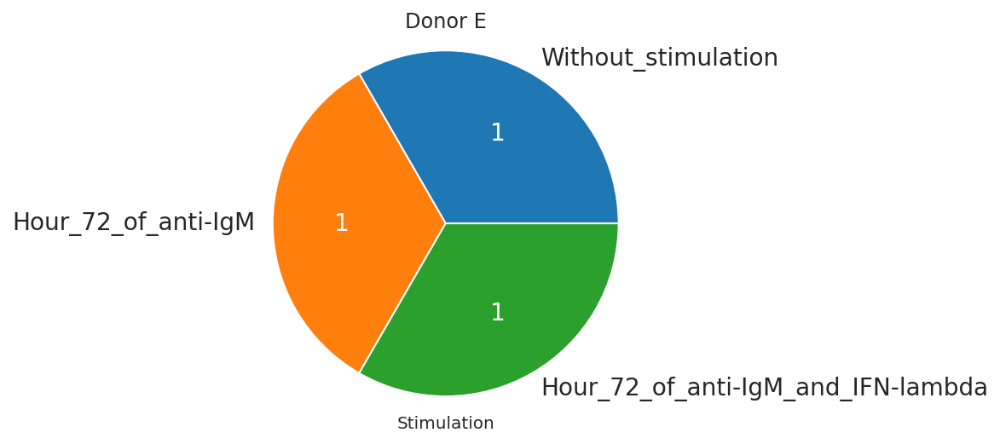

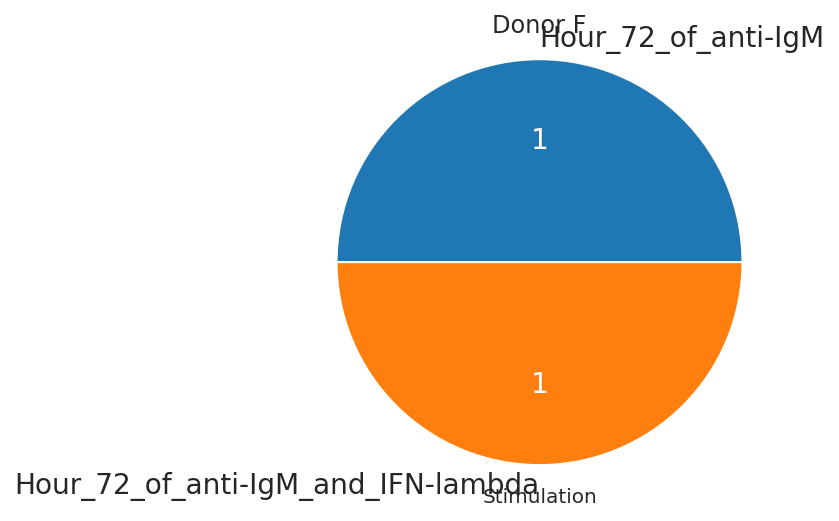

In [112]:
vector_pie_plot(cells_GSE156195[cells_GSE156195.Donor_id == 'donorA'].Stimulation, title = 'Donor A', display_counts=True)
vector_pie_plot(cells_GSE156195[cells_GSE156195.Donor_id == 'donorB'].Stimulation, title = 'Donor B', display_counts=True)
vector_pie_plot(cells_GSE156195[cells_GSE156195.Donor_id == 'donorC'].Stimulation, title = 'Donor C', display_counts=True)
vector_pie_plot(cells_GSE156195[cells_GSE156195.Donor_id == 'donorD'].Stimulation, title = 'Donor D', display_counts=True)
vector_pie_plot(cells_GSE156195[cells_GSE156195.Donor_id == 'donorE'].Stimulation, title = 'Donor E', display_counts=True)
vector_pie_plot(cells_GSE156195[cells_GSE156195.Donor_id == 'donorF'].Stimulation, title = 'Donor F', display_counts=True)

In [24]:
# DonorF фиговый, удалим его из таблицы
cells_GSE156195 = cells_GSE156195.loc[cells_GSE156195['Donor_id'] != 'donorF']

## Проверка сортировочных маркеров

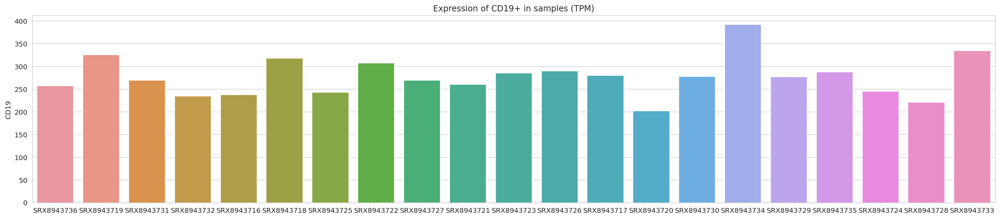

In [22]:
fig, ax = plt.subplots(figsize=(25, 5))
plt.title('Expression of CD19+ in samples (TPM)')
graph = sns.barplot(x=expr_TPM.columns, y=expr_TPM.loc['CD19'], ax=ax)
#graph.axhline(10, color = 'r', linestyle = '--')

In [24]:
all_deconv = model.predict(expr_TPM[cells_GSE156195.index])

Expressions OK


In [28]:
#вывод примера для одного сампла

sample = 'SRX8943716'

fig, ax = plt.subplots(figsize=(90, 30))
plt.ylabel('ylabel', fontsize=80)
sns.barplot(x=all_deconv[sample].index, y=all_deconv[sample], ax=ax)

for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(50)
    
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(40)
    
plt.xticks(rotation=-90)
plt.title('Deconvolution check', fontsize=100)

Text(0.5, 1.0, 'Deconvolution check')

In [ ]:
#вывод для всех самплов (хорошая проверка)

for sample in all_deconv.columns:
    fig, ax = plt.subplots(figsize=(90, 30))
    plt.ylabel('ylabel', fontsize=80)
    sns.barplot(x=all_deconv[sample].index, y=all_deconv[sample], ax=ax)
    
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    plt.xticks(rotation=-90)

## Сравнение среднего (edgeR) в каунтах

"-" означает, что было больше изначально

In [41]:
#для всех генов

list_edgeR = []
control = 'Without_stimulation'
for interest in list_Stimulation_no_control:
    DE = calculate_diff_expr_between_two_group(
                                expr_counts, 
                                dict_stimulations[control], 
                                dict_stimulations[interest], '')
    list_edgeR.append(DE)

list_edgeR

[                logFC    logCPM         PValue            FDR
 LMNA    -6.198633e+00  8.369600  2.425059e-147  4.865152e-143
 OAS1     4.276683e+00  8.853778  7.535131e-142  7.558489e-138
 IFI27    1.011233e+01  5.650830  2.671486e-135  1.786512e-131
 MKI67    7.745023e+00  6.224089  3.120146e-125  1.564909e-121
 S1PR2   -5.415975e+00  6.682103  3.763676e-123  1.510137e-119
 ...               ...       ...            ...            ...
 ZNF705B -5.125482e-15 -3.152153  1.000000e+00   1.000000e+00 
 ZNF804B -5.125482e-15 -3.152153  1.000000e+00   1.000000e+00 
 ZNRF4   -5.125482e-15 -3.152153  1.000000e+00   1.000000e+00 
 ZP4     -5.125482e-15 -3.152153  1.000000e+00   1.000000e+00 
 ZSWIM2  -5.125482e-15 -3.152153  1.000000e+00   1.000000e+00 
 
 [20062 rows x 4 columns],
             logFC    logCPM         PValue            FDR
 S1PR2   -5.806419  6.672237  5.546270e-116  1.112693e-111
 SMAD7   -4.274336  5.623403  2.581051e-87   2.589053e-83 
 ADGRE5  -3.154794  8.826643  1.424244

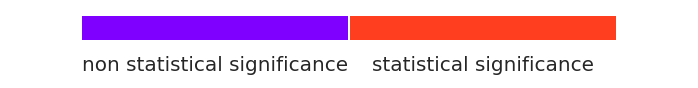

<Figure size 1800x144 with 0 Axes>

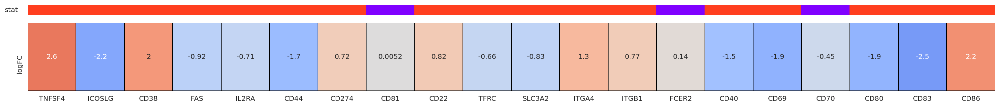

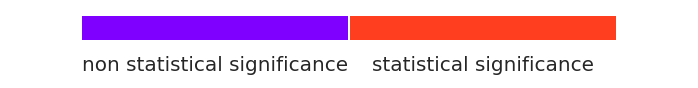

<Figure size 1800x144 with 0 Axes>

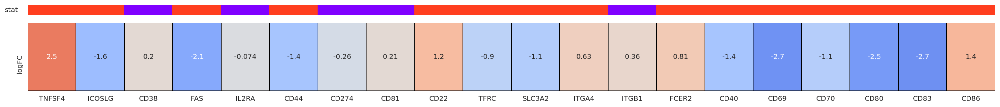

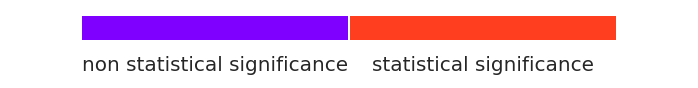

<Figure size 1800x144 with 0 Axes>

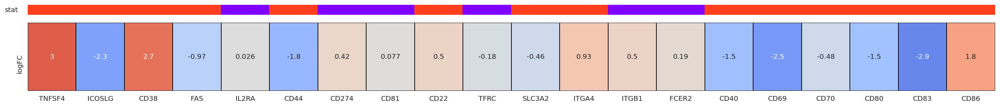

In [42]:
for i in list_edgeR:
    draw_logFC_stat(i, list_gene_marker, (25,2))

In [43]:
stimulation_expr_edgeR = pd.concat([x[['logFC']] for x in list_edgeR], axis=1)
stimulation_expr_edgeR.columns = list_Stimulation_no_control
stimulation_expr_edgeR.head()

,Hour_72_of_anti-IgM_and_IFN-lambda,Hour_72_of_anti-IgM,Hour_72_of_IFN-lambda
LMNA,-6.198633,-5.259746,-4.895493
OAS1,4.276683,1.138894,4.182221
IFI27,10.112325,1.086019,10.974417
MKI67,7.745023,6.546962,8.250581
S1PR2,-5.415975,-5.806419,-4.722466


<AxesSubplot:>

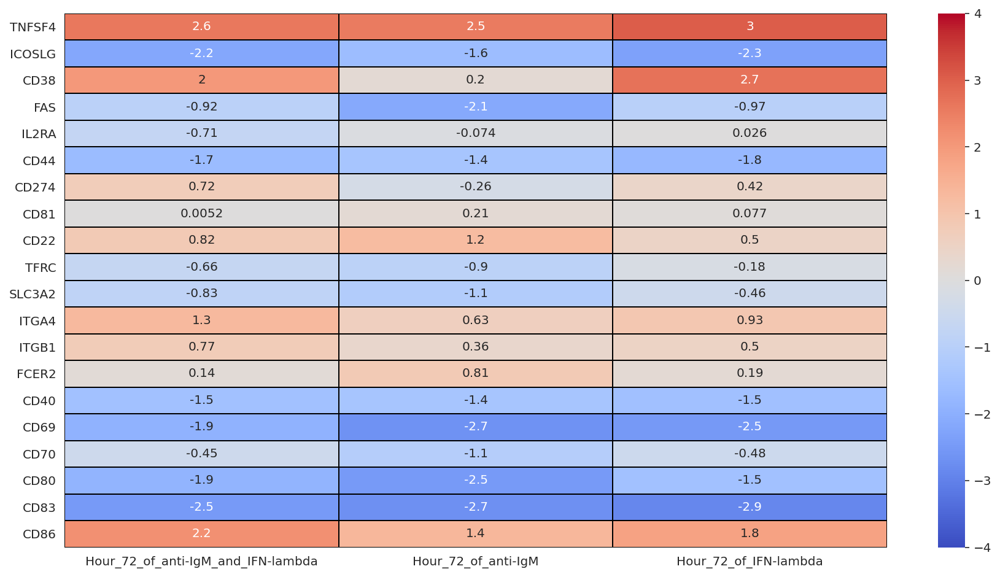

In [44]:
#просто верхние три графика собрали в один

plt.figure(figsize=(15,8))
sns.heatmap(stimulation_expr_edgeR.loc[list_gene_marker, :], annot = True, vmin=-4, vmax=4, center =0,
                cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=True, cbar=True)

### поиграем в edgeR

Уберем из without_stimulation (было 5, стало 4):

In [45]:
cells_GSE156195_1 = cells_GSE156195.loc[cells_GSE156195.index != 'SRX8943716']

dict_stimulations_1 = {}
for stimul in cells_GSE156195_1.Stimulation.unique():
    dict_stimulations_1[stimul] = cells_GSE156195_1[cells_GSE156195_1.Stimulation == stimul].index

dict_stimulations_1

{'Hour_72_of_IFN-lambda': Index(['SRX8943717', 'SRX8943721', 'SRX8943725', 'SRX8943729'], dtype='object', name='Sample'),
 'Hour_72_of_anti-IgM': Index(['SRX8943718', 'SRX8943722', 'SRX8943726', 'SRX8943730', 'SRX8943733'], dtype='object', name='Sample'),
 'Hour_72_of_anti-IgM_and_IFN-lambda': Index(['SRX8943719', 'SRX8943723', 'SRX8943727', 'SRX8943731', 'SRX8943734'], dtype='object', name='Sample'),
 'Without_stimulation': Index(['SRX8943720', 'SRX8943724', 'SRX8943728', 'SRX8943732'], dtype='object', name='Sample')}

In [46]:
#для всех генов

list_edgeR = []
control = 'Without_stimulation'
for interest in list_Stimulation_no_control:
    DE = calculate_diff_expr_between_two_group(
                                expr_counts, 
                                dict_stimulations_1[control], 
                                dict_stimulations_1[interest], '')
    list_edgeR.append(DE)
list_edgeR 

[                logFC    logCPM         PValue            FDR
 HES1    -8.454513e+00  6.977652  2.568030e-151  5.151983e-147
 LMNA    -6.345044e+00  8.459473  1.184283e-149  1.187954e-145
 S1PR2   -5.562528e+00  6.749224  1.310962e-118  8.766840e-115
 SMAD7   -4.974317e+00  5.703672  2.144276e-117  1.075462e-113
 IFI27    9.928317e+00  5.747716  1.337601e-113  5.366991e-110
 ...               ...       ...            ...            ...
 ZNF804B -5.125482e-15 -3.177454  1.000000e+00   1.000000e+00 
 ZNRF4   -5.125482e-15 -3.177454  1.000000e+00   1.000000e+00 
 ZP1     -5.125482e-15 -3.177454  1.000000e+00   1.000000e+00 
 ZP4     -5.125482e-15 -3.177454  1.000000e+00   1.000000e+00 
 ZSWIM2  -5.125482e-15 -3.177454  1.000000e+00   1.000000e+00 
 
 [20062 rows x 4 columns],
             logFC     logCPM         PValue            FDR
 SEMA7A  -3.958276  10.189486  1.437173e-118  2.883256e-114
 S1PR2   -5.824876  6.742676   1.121293e-117  1.124769e-113
 SMAD7   -4.454983  5.726564   2.68

<AxesSubplot:>

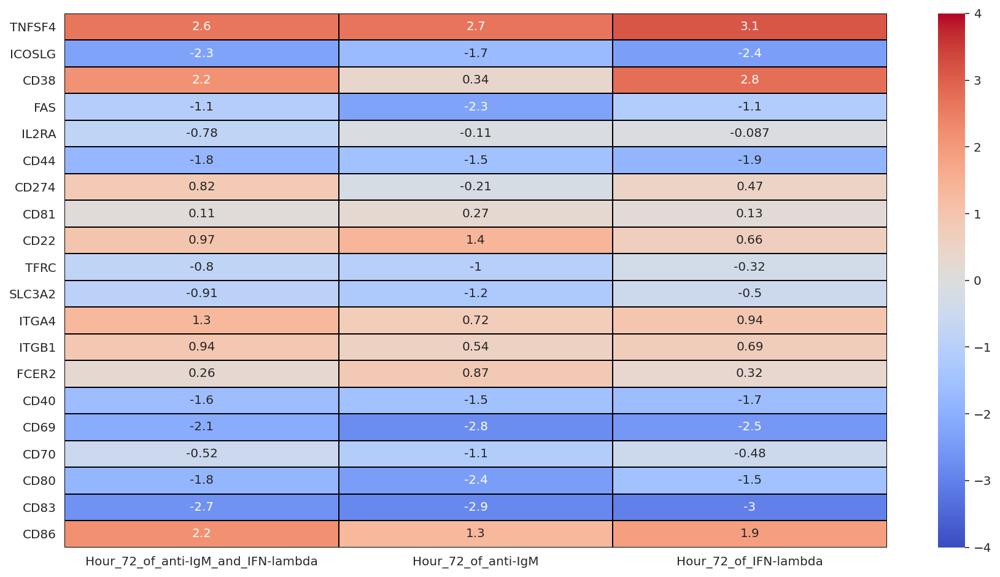

In [47]:
stimulation_expr_edgeR = pd.concat([x[['logFC']] for x in list_edgeR], axis=1)
stimulation_expr_edgeR.columns = list_Stimulation_no_control

plt.figure(figsize=(15,8))
sns.heatmap(stimulation_expr_edgeR.loc[list_gene_marker, :], annot = True, vmin=-4, vmax=4, center =0,
                cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=True, cbar=True)

Уберем из Hour_72_of_IFN-lambda (было 4, стало 3):

In [48]:
cells_GSE156195_2 = cells_GSE156195.loc[cells_GSE156195.index != 'SRX8943729']

dict_stimulations_2 = {}
for stimul in cells_GSE156195_2.Stimulation.unique():
    dict_stimulations_2[stimul] = cells_GSE156195_2[cells_GSE156195_2.Stimulation == stimul].index

dict_stimulations_2

{'Without_stimulation': Index(['SRX8943716', 'SRX8943720', 'SRX8943724', 'SRX8943728', 'SRX8943732'], dtype='object', name='Sample'),
 'Hour_72_of_IFN-lambda': Index(['SRX8943717', 'SRX8943721', 'SRX8943725'], dtype='object', name='Sample'),
 'Hour_72_of_anti-IgM': Index(['SRX8943718', 'SRX8943722', 'SRX8943726', 'SRX8943730', 'SRX8943733'], dtype='object', name='Sample'),
 'Hour_72_of_anti-IgM_and_IFN-lambda': Index(['SRX8943719', 'SRX8943723', 'SRX8943727', 'SRX8943731', 'SRX8943734'], dtype='object', name='Sample')}

In [49]:
#для всех генов

list_edgeR = []
control = 'Without_stimulation'
for interest in list_Stimulation_no_control:
    DE = calculate_diff_expr_between_two_group(
                                expr_counts, 
                                dict_stimulations_2[control], 
                                dict_stimulations_2[interest], '')
    list_edgeR.append(DE)
list_edgeR

[             logFC    logCPM         PValue            FDR
 IFI27    10.184582  5.595929  3.183136e-135  6.386008e-131
 OAS1     4.302682   8.764913  3.030769e-130  3.040164e-126
 LMNA    -6.220652   8.502841  1.555822e-116  1.040430e-112
 MKI67    7.760143   6.114815  2.245634e-115  1.126298e-111
 S1PR2   -5.460920   6.811690  4.791522e-102  1.922550e-98 
 ...           ...        ...            ...           ... 
 ZNF705B  0.000000  -3.171284  1.000000e+00   1.000000e+00 
 ZNF804B  0.000000  -3.171284  1.000000e+00   1.000000e+00 
 ZNRF4    0.000000  -3.171284  1.000000e+00   1.000000e+00 
 ZP4      0.000000  -3.171284  1.000000e+00   1.000000e+00 
 ZSWIM2   0.000000  -3.171284  1.000000e+00   1.000000e+00 
 
 [20062 rows x 4 columns],
             logFC     logCPM         PValue           FDR
 S1PR2   -5.723409  6.806064   1.663052e-100  3.336415e-96
 MKI67    6.653775  5.018021   3.548322e-84   3.559322e-80
 SEMA7A  -3.836985  10.223923  2.304383e-81   1.541018e-77
 LZTS3   -3.866

<AxesSubplot:>

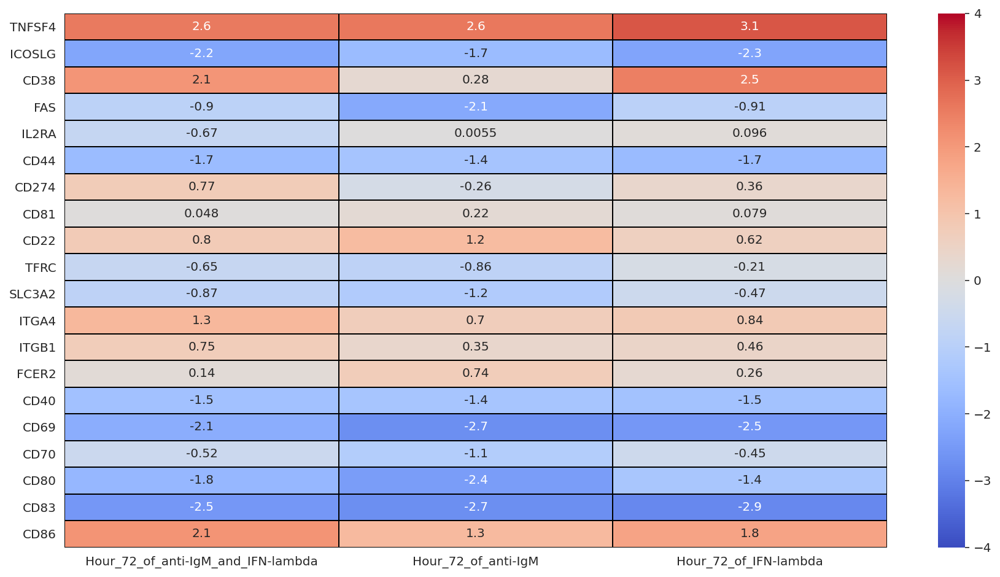

In [50]:
stimulation_expr_edgeR = pd.concat([x[['logFC']] for x in list_edgeR], axis=1)
stimulation_expr_edgeR.columns = list_Stimulation_no_control

plt.figure(figsize=(15,8))
sns.heatmap(stimulation_expr_edgeR.loc[list_gene_marker, :], annot = True, vmin=-4, vmax=4, center =0,
                cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=True, cbar=True)

Уберем из Hour_72_of_anti-IgM (было 6, стало 5):

In [51]:
cells_GSE156195_3 = cells_GSE156195.loc[cells_GSE156195.index != 'SRX8943722']

dict_stimulations_3 = {}
for stimul in cells_GSE156195_3.Stimulation.unique():
    dict_stimulations_3[stimul] = cells_GSE156195_3[cells_GSE156195_3.Stimulation == stimul].index

dict_stimulations_3

{'Without_stimulation': Index(['SRX8943716', 'SRX8943720', 'SRX8943724', 'SRX8943728', 'SRX8943732'], dtype='object', name='Sample'),
 'Hour_72_of_IFN-lambda': Index(['SRX8943717', 'SRX8943721', 'SRX8943725', 'SRX8943729'], dtype='object', name='Sample'),
 'Hour_72_of_anti-IgM': Index(['SRX8943718', 'SRX8943726', 'SRX8943730', 'SRX8943733'], dtype='object', name='Sample'),
 'Hour_72_of_anti-IgM_and_IFN-lambda': Index(['SRX8943719', 'SRX8943723', 'SRX8943727', 'SRX8943731', 'SRX8943734'], dtype='object', name='Sample')}

In [52]:
#для всех генов

list_edgeR = []
control = 'Without_stimulation'
for interest in list_Stimulation_no_control:
    DE = calculate_diff_expr_between_two_group(
                                expr_counts, 
                                dict_stimulations_3[control], 
                                dict_stimulations_3[interest], '')
    list_edgeR.append(DE)
list_edgeR

[             logFC    logCPM         PValue            FDR
 IFI27    10.184582  5.595929  3.183136e-135  6.386008e-131
 OAS1     4.302682   8.764913  3.030769e-130  3.040164e-126
 LMNA    -6.220652   8.502841  1.555822e-116  1.040430e-112
 MKI67    7.760143   6.114815  2.245634e-115  1.126298e-111
 S1PR2   -5.460920   6.811690  4.791522e-102  1.922550e-98 
 ...           ...        ...            ...           ... 
 ZNF705B  0.000000  -3.171284  1.000000e+00   1.000000e+00 
 ZNF804B  0.000000  -3.171284  1.000000e+00   1.000000e+00 
 ZNRF4    0.000000  -3.171284  1.000000e+00   1.000000e+00 
 ZP4      0.000000  -3.171284  1.000000e+00   1.000000e+00 
 ZSWIM2   0.000000  -3.171284  1.000000e+00   1.000000e+00 
 
 [20062 rows x 4 columns],
             logFC    logCPM         PValue           FDR
 S1PR2   -5.918800  6.949648  2.299485e-101  4.613226e-97
 MKI67    6.619273  4.818323  3.324468e-74   3.334774e-70
 LMNA    -5.160749  8.667234  8.784029e-69   5.874173e-65
 CRIP2   -4.489869 

<AxesSubplot:>

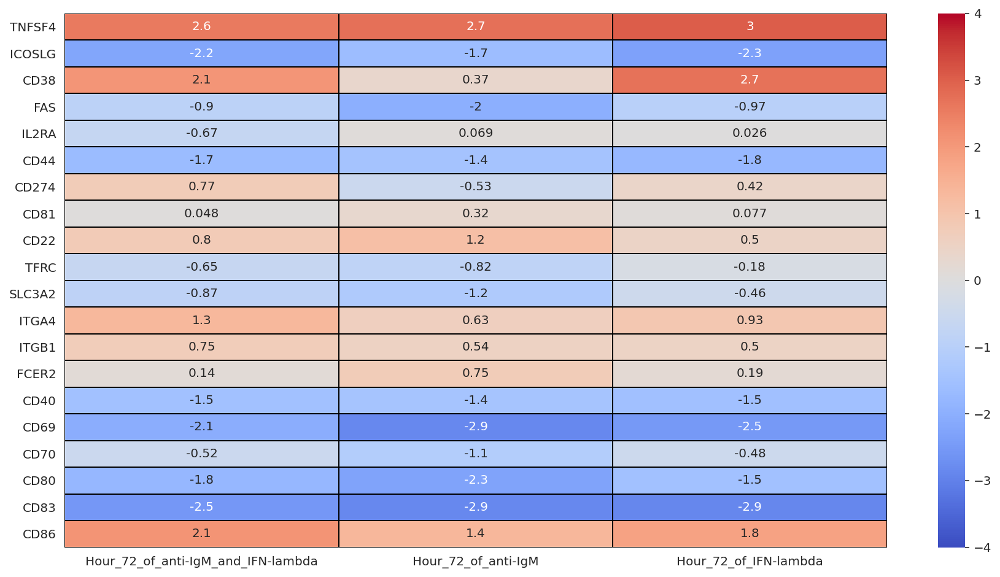

In [53]:
stimulation_expr_edgeR = pd.concat([x[['logFC']] for x in list_edgeR], axis=1)
stimulation_expr_edgeR.columns = list_Stimulation_no_control

plt.figure(figsize=(15,8))
sns.heatmap(stimulation_expr_edgeR.loc[list_gene_marker, :], annot = True, vmin=-4, vmax=4, center =0,
                cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=True, cbar=True)

Уберем из Hour_72_of_anti-IgM_and_IFN-lambda (было 6, стало 5):

In [54]:
cells_GSE156195_4 = cells_GSE156195.loc[cells_GSE156195.index != 'SRX8943731']

dict_stimulations_4 = {}
for stimul in cells_GSE156195_4.Stimulation.unique():
    dict_stimulations_4[stimul] = cells_GSE156195_4[cells_GSE156195_4.Stimulation == stimul].index

dict_stimulations_4

{'Without_stimulation': Index(['SRX8943716', 'SRX8943720', 'SRX8943724', 'SRX8943728', 'SRX8943732'], dtype='object', name='Sample'),
 'Hour_72_of_IFN-lambda': Index(['SRX8943717', 'SRX8943721', 'SRX8943725', 'SRX8943729'], dtype='object', name='Sample'),
 'Hour_72_of_anti-IgM': Index(['SRX8943718', 'SRX8943722', 'SRX8943726', 'SRX8943730', 'SRX8943733'], dtype='object', name='Sample'),
 'Hour_72_of_anti-IgM_and_IFN-lambda': Index(['SRX8943719', 'SRX8943723', 'SRX8943727', 'SRX8943734'], dtype='object', name='Sample')}

In [55]:
#для всех генов

list_edgeR = []
control = 'Without_stimulation'
for interest in list_Stimulation_no_control:
    DE = calculate_diff_expr_between_two_group(
                                expr_counts, 
                                dict_stimulations_4[control], 
                                dict_stimulations_4[interest], '')
    list_edgeR.append(DE)


<AxesSubplot:>

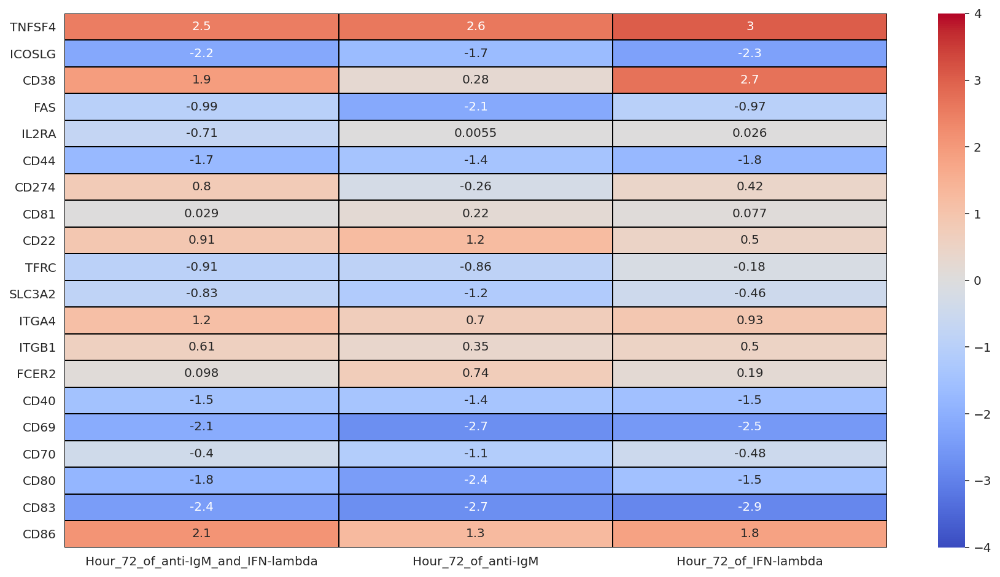

In [56]:
stimulation_expr_edgeR = pd.concat([x[['logFC']] for x in list_edgeR], axis=1)
stimulation_expr_edgeR.columns = list_Stimulation_no_control

plt.figure(figsize=(15,8))
sns.heatmap(stimulation_expr_edgeR.loc[list_gene_marker, :], annot = True, vmin=-4, vmax=4, center =0,
                cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=True, cbar=True)

## Cравнение по донорам в TPM

### Сортировка по стимуляции

In [32]:
df = pd.DataFrame(np.zeros((14,5 + len(list_gene_marker))))
df.columns = ['donor_id', 'control_sample_id', 'control_stimulation', 'interest_sample_id', 
              'interest_stimulation'] + list_gene_marker

i = 0 
for donor_id in ['donorA', 'donorB', 'donorC', 'donorD']:
    control_group = 'Without_stimulation'
    for interest_group in list_Stimulation_no_control:
        #все сэмплы контрольной группы
        samples_control_group = dict_stimulations[control_group]
        #сэмпл из сэмплов контрольной группы, подходящий иммено для нашего донора
        control_sample = list(cells_GSE156195.loc[(samples_control_group)].loc[cells_GSE156195.Donor_id == donor_id].index)[0]
        
        #все сэмплы интересной группы
        samples_interest_group = dict_stimulations[interest_group]
        #сэмпл из сэмплов интересной группы, подходящий иммено для нашего донора
        interest_sample = list(cells_GSE156195.loc[(samples_interest_group)].loc[cells_GSE156195.Donor_id == donor_id].index)[0]
        
        df.loc[i, 'donor_id'] = donor_id
        df.loc[i, 'control_sample_id'] = control_sample
        df.loc[i, 'control_stimulation'] = control_group
        df.loc[i, 'interest_sample_id'] = interest_sample
        df.loc[i, 'interest_stimulation'] = interest_group
        
        for gene in list_gene_marker:
            df.loc[i, gene] = np.log2(
                                    (expr_TPM.loc[gene,interest_sample] + 1) / (expr_TPM.loc[gene,control_sample] + 1))
        i += 1 #для того, чтобы в следующую строку результат записывался

donor_id = 'donorE'
control_group = 'Without_stimulation'
for interest_group in ['Hour_72_of_anti-IgM', 'Hour_72_of_anti-IgM_and_IFN-lambda']:
    #все сэмплы контрольной группы
    samples_control_group = dict_stimulations[control_group]
    #сэмпл из сэмплов контрольной группы, подходящий иммено для нашего донора
    control_sample = list(cells_GSE156195.loc[(samples_control_group)].loc[cells_GSE156195.Donor_id == donor_id].index)[0]
        
    #все сэмплы интересной группы
    samples_interest_group = dict_stimulations[interest_group]
    #сэмпл из сэмплов интересной группы, подходящий иммено для нашего донора
    interest_sample = list(cells_GSE156195.loc[(samples_interest_group)].loc[cells_GSE156195.Donor_id == donor_id].index)[0]
        
    df.loc[i, 'donor_id'] = donor_id
    df.loc[i, 'control_sample_id'] = control_sample
    df.loc[i, 'control_stimulation'] = control_group
    df.loc[i, 'interest_sample_id'] = interest_sample
    df.loc[i, 'interest_stimulation'] = interest_group
        
    for gene in list_gene_marker:
        df.loc[i, gene] = np.log2(
                                (expr_TPM.loc[gene,interest_sample] + 1) / (expr_TPM.loc[gene,control_sample] + 1))
    i += 1

In [33]:
df

,donor_id,control_sample_id,control_stimulation,interest_sample_id,interest_stimulation,TNFSF4,ICOSLG,CD38,FAS,IL2RA,CD44,CD274,CD81,CD22,TFRC,SLC3A2,ITGA4,ITGB1,FCER2,CD40,CD69,CD70,CD80,CD83,CD86
0,donorA,SRX8943716,Without_stimulation,SRX8943719,Hour_72_of_anti-IgM_and_IFN-lambda,1.384115,-1.648190,2.486378,0.423792,-0.444093,-1.273283,0.143515,-0.092618,0.590044,-0.162275,-0.763813,1.031681,0.451051,-0.049891,-1.008880,-2.280082,-0.772331,-1.261137,-1.985190,1.271097
1,donorA,SRX8943716,Without_stimulation,SRX8943718,Hour_72_of_anti-IgM,1.313390,-1.466714,0.607020,-0.778850,-0.029591,-1.183024,-0.793006,-0.048459,0.812448,0.180008,-1.305439,0.575773,0.039270,0.302617,-0.939675,-2.787131,-1.313738,-1.651841,-2.331924,0.966195
2,donorA,SRX8943716,Without_stimulation,SRX8943717,Hour_72_of_IFN-lambda,1.958734,-1.911379,3.532928,0.260195,0.547039,-1.242583,0.265570,-0.123933,0.286882,0.763742,-0.508276,1.150929,0.495482,-0.095726,-0.944490,-2.207328,-0.463306,-1.005406,-2.323392,1.519854
3,donorB,SRX8943720,Without_stimulation,SRX8943723,Hour_72_of_anti-IgM_and_IFN-lambda,1.193973,-2.321505,2.766471,-1.068228,-1.124980,-1.498703,1.026235,-0.165403,1.321467,-0.736301,-0.430974,1.355273,0.435550,0.102248,-1.944286,-2.122063,-0.425335,-1.301433,-2.598045,2.132741
4,donorB,SRX8943720,Without_stimulation,SRX8943722,Hour_72_of_anti-IgM,0.988892,-1.900270,0.951462,-2.406228,-0.190604,-1.027621,0.162902,-0.294340,1.870434,-1.038205,-0.985377,1.434372,0.153511,0.854286,-1.752658,-2.458627,-1.635830,-1.881574,-2.986304,0.851812
5,donorB,SRX8943720,Without_stimulation,SRX8943721,Hour_72_of_IFN-lambda,1.341098,-2.468237,3.374606,-1.192301,0.211370,-1.521985,-0.433096,0.160030,0.827086,-0.722571,-0.384161,0.348663,0.031776,0.490576,-1.878743,-3.009996,-1.114673,-1.462236,-3.579563,1.210541
6,donorC,SRX8943724,Without_stimulation,SRX8943727,Hour_72_of_anti-IgM_and_IFN-lambda,1.464644,-2.298286,2.079975,-1.053683,-0.746687,-2.079961,0.350179,0.497627,0.923290,-1.268748,-1.093970,0.913644,0.317007,0.416416,-1.233324,-1.431534,-0.160646,-1.688395,-2.355632,1.868523
7,donorC,SRX8943724,Without_stimulation,SRX8943726,Hour_72_of_anti-IgM,1.649418,-1.954124,-0.273197,-1.223569,-0.577962,-1.945593,-0.316976,0.616179,1.187236,-1.423573,-1.685332,0.301459,-0.030346,0.750890,-1.142301,-2.183027,-0.869067,-2.088854,-2.742550,1.126329
8,donorC,SRX8943724,Without_stimulation,SRX8943725,Hour_72_of_IFN-lambda,2.071710,-2.413214,3.199705,-0.311753,0.099709,-1.899162,0.646758,0.476155,0.331165,-0.658684,-1.113194,0.684922,0.638225,-0.153879,-1.420104,-2.039305,0.238850,-1.065444,-2.440443,2.103876
9,donorD,SRX8943728,Without_stimulation,SRX8943731,Hour_72_of_anti-IgM_and_IFN-lambda,2.040861,-2.838220,2.151982,-0.571746,0.194497,-2.004801,1.361311,0.101229,0.463426,-0.100557,-0.875165,2.025022,1.583187,0.203661,-1.651190,-1.749934,-0.467298,-0.891644,-3.101695,2.300115


In [34]:
df= df.sort_values(by='interest_stimulation')

<Figure size 1440x1080 with 0 Axes>

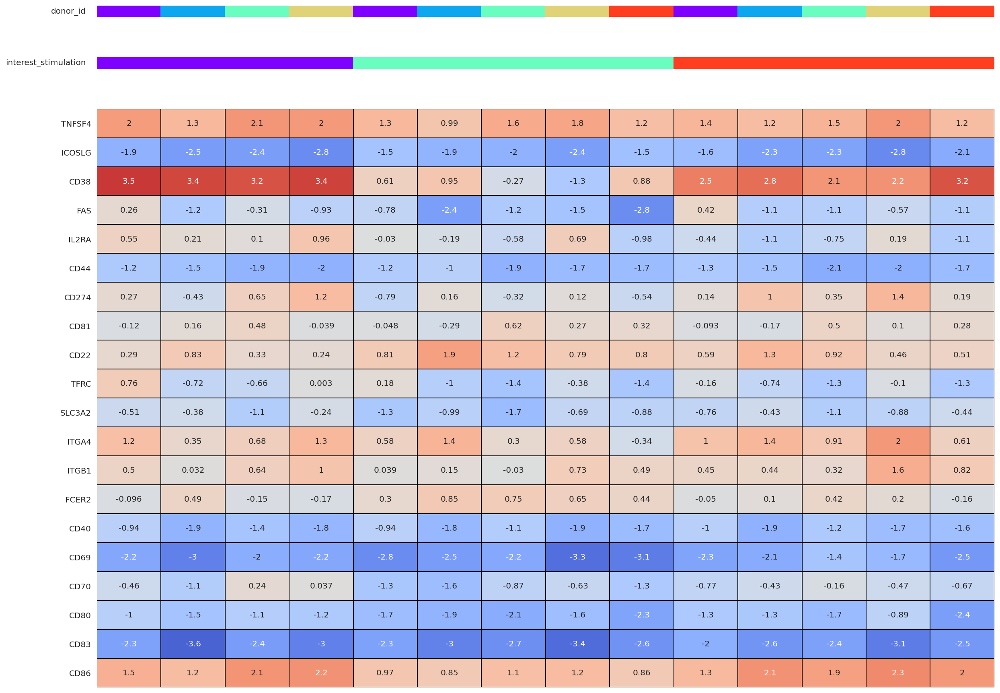

<AxesSubplot:>

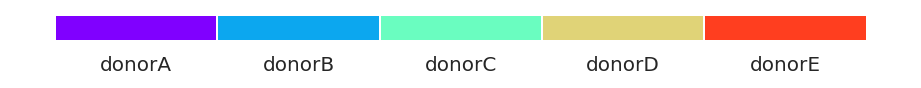

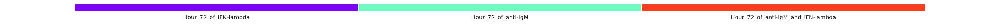

In [83]:
plt.figure(figsize=(20,15))

af = axis_matras([.3, .3, 15], x_len=20)
line_palette_annotation_plot(df['donor_id'], ax=next(af), 
                             palette=lin_colors(df['donor_id']))

line_palette_annotation_plot(df['interest_stimulation'], ax=next(af), 
                             palette=lin_colors(df['interest_stimulation']))



sns.heatmap(df.iloc[:, 5:26].T, annot = True, vmin=-4, vmax=4, center = 0, cmap= 'coolwarm',
              linewidths=1, linecolor='black', xticklabels=False, cbar=False,
            cbar_kws= {'orientation': 'horizontal'})
plt.show()
patch_plot(lin_colors(df['donor_id']), legend_right=True, vertical=True, h=8, show_ticks=True)
patch_plot(lin_colors(df['interest_stimulation']), legend_right=True, vertical=True, h=32, show_ticks=True)

<AxesSubplot:>

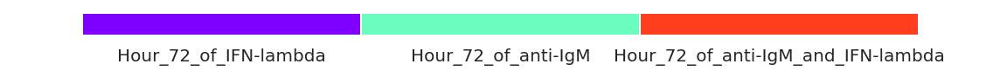

In [36]:
patch_plot(lin_colors(df['interest_stimulation']), legend_right=True, vertical=True, h=10, show_ticks=True)

### Сортировка по донорам

In [84]:
df = pd.DataFrame(np.zeros((14,5 + len(list_gene_marker))))
df.columns = ['donor_id', 'control_sample_id', 'control_stimulation', 'interest_sample_id', 
              'interest_stimulation'] + list_gene_marker

i = 0 
for donor_id in ['donorA', 'donorB', 'donorC', 'donorD']:
    control_group = 'Without_stimulation'
    for interest_group in list_Stimulation_no_control:
        #все сэмплы контрольной группы
        samples_control_group = dict_stimulations[control_group]
        #сэмпл из сэмплов контрольной группы, подходящий иммено для нашего донора
        control_sample = list(cells_GSE156195.loc[(samples_control_group)].loc[cells_GSE156195.Donor_id == donor_id].index)[0]
        
        #все сэмплы интересной группы
        samples_interest_group = dict_stimulations[interest_group]
        #сэмпл из сэмплов интересной группы, подходящий иммено для нашего донора
        interest_sample = list(cells_GSE156195.loc[(samples_interest_group)].loc[cells_GSE156195.Donor_id == donor_id].index)[0]
        
        df.loc[i, 'donor_id'] = donor_id
        df.loc[i, 'control_sample_id'] = control_sample
        df.loc[i, 'control_stimulation'] = control_group
        df.loc[i, 'interest_sample_id'] = interest_sample
        df.loc[i, 'interest_stimulation'] = interest_group
        
        for gene in list_gene_marker:
            df.loc[i, gene] = np.log2(
                                    (expr_TPM.loc[gene,interest_sample] + 1) / (expr_TPM.loc[gene,control_sample] + 1))
        i += 1 #для того, чтобы в следующую строку результат записывался

donor_id = 'donorE'
control_group = 'Without_stimulation'
for interest_group in ['Hour_72_of_anti-IgM', 'Hour_72_of_anti-IgM_and_IFN-lambda']:
    #все сэмплы контрольной группы
    samples_control_group = dict_stimulations[control_group]
    #сэмпл из сэмплов контрольной группы, подходящий иммено для нашего донора
    control_sample = list(cells_GSE156195.loc[(samples_control_group)].loc[cells_GSE156195.Donor_id == donor_id].index)[0]
        
    #все сэмплы интересной группы
    samples_interest_group = dict_stimulations[interest_group]
    #сэмпл из сэмплов интересной группы, подходящий иммено для нашего донора
    interest_sample = list(cells_GSE156195.loc[(samples_interest_group)].loc[cells_GSE156195.Donor_id == donor_id].index)[0]
        
    df.loc[i, 'donor_id'] = donor_id
    df.loc[i, 'control_sample_id'] = control_sample
    df.loc[i, 'control_stimulation'] = control_group
    df.loc[i, 'interest_sample_id'] = interest_sample
    df.loc[i, 'interest_stimulation'] = interest_group
        
    for gene in list_gene_marker:
        df.loc[i, gene] = np.log2(
                                (expr_TPM.loc[gene,interest_sample] + 1) / (expr_TPM.loc[gene,control_sample] + 1))
    i += 1

In [85]:
df

,donor_id,control_sample_id,control_stimulation,interest_sample_id,interest_stimulation,TNFSF4,ICOSLG,CD38,FAS,IL2RA,CD44,CD274,CD81,CD22,TFRC,SLC3A2,ITGA4,ITGB1,FCER2,CD40,CD69,CD70,CD80,CD83,CD86
0,donorA,SRX8943716,Without_stimulation,SRX8943719,Hour_72_of_anti-IgM_and_IFN-lambda,1.384115,-1.648190,2.486378,0.423792,-0.444093,-1.273283,0.143515,-0.092618,0.590044,-0.162275,-0.763813,1.031681,0.451051,-0.049891,-1.008880,-2.280082,-0.772331,-1.261137,-1.985190,1.271097
1,donorA,SRX8943716,Without_stimulation,SRX8943718,Hour_72_of_anti-IgM,1.313390,-1.466714,0.607020,-0.778850,-0.029591,-1.183024,-0.793006,-0.048459,0.812448,0.180008,-1.305439,0.575773,0.039270,0.302617,-0.939675,-2.787131,-1.313738,-1.651841,-2.331924,0.966195
2,donorA,SRX8943716,Without_stimulation,SRX8943717,Hour_72_of_IFN-lambda,1.958734,-1.911379,3.532928,0.260195,0.547039,-1.242583,0.265570,-0.123933,0.286882,0.763742,-0.508276,1.150929,0.495482,-0.095726,-0.944490,-2.207328,-0.463306,-1.005406,-2.323392,1.519854
3,donorB,SRX8943720,Without_stimulation,SRX8943723,Hour_72_of_anti-IgM_and_IFN-lambda,1.193973,-2.321505,2.766471,-1.068228,-1.124980,-1.498703,1.026235,-0.165403,1.321467,-0.736301,-0.430974,1.355273,0.435550,0.102248,-1.944286,-2.122063,-0.425335,-1.301433,-2.598045,2.132741
4,donorB,SRX8943720,Without_stimulation,SRX8943722,Hour_72_of_anti-IgM,0.988892,-1.900270,0.951462,-2.406228,-0.190604,-1.027621,0.162902,-0.294340,1.870434,-1.038205,-0.985377,1.434372,0.153511,0.854286,-1.752658,-2.458627,-1.635830,-1.881574,-2.986304,0.851812
5,donorB,SRX8943720,Without_stimulation,SRX8943721,Hour_72_of_IFN-lambda,1.341098,-2.468237,3.374606,-1.192301,0.211370,-1.521985,-0.433096,0.160030,0.827086,-0.722571,-0.384161,0.348663,0.031776,0.490576,-1.878743,-3.009996,-1.114673,-1.462236,-3.579563,1.210541
6,donorC,SRX8943724,Without_stimulation,SRX8943727,Hour_72_of_anti-IgM_and_IFN-lambda,1.464644,-2.298286,2.079975,-1.053683,-0.746687,-2.079961,0.350179,0.497627,0.923290,-1.268748,-1.093970,0.913644,0.317007,0.416416,-1.233324,-1.431534,-0.160646,-1.688395,-2.355632,1.868523
7,donorC,SRX8943724,Without_stimulation,SRX8943726,Hour_72_of_anti-IgM,1.649418,-1.954124,-0.273197,-1.223569,-0.577962,-1.945593,-0.316976,0.616179,1.187236,-1.423573,-1.685332,0.301459,-0.030346,0.750890,-1.142301,-2.183027,-0.869067,-2.088854,-2.742550,1.126329
8,donorC,SRX8943724,Without_stimulation,SRX8943725,Hour_72_of_IFN-lambda,2.071710,-2.413214,3.199705,-0.311753,0.099709,-1.899162,0.646758,0.476155,0.331165,-0.658684,-1.113194,0.684922,0.638225,-0.153879,-1.420104,-2.039305,0.238850,-1.065444,-2.440443,2.103876
9,donorD,SRX8943728,Without_stimulation,SRX8943731,Hour_72_of_anti-IgM_and_IFN-lambda,2.040861,-2.838220,2.151982,-0.571746,0.194497,-2.004801,1.361311,0.101229,0.463426,-0.100557,-0.875165,2.025022,1.583187,0.203661,-1.651190,-1.749934,-0.467298,-0.891644,-3.101695,2.300115


<Figure size 1440x1080 with 0 Axes>

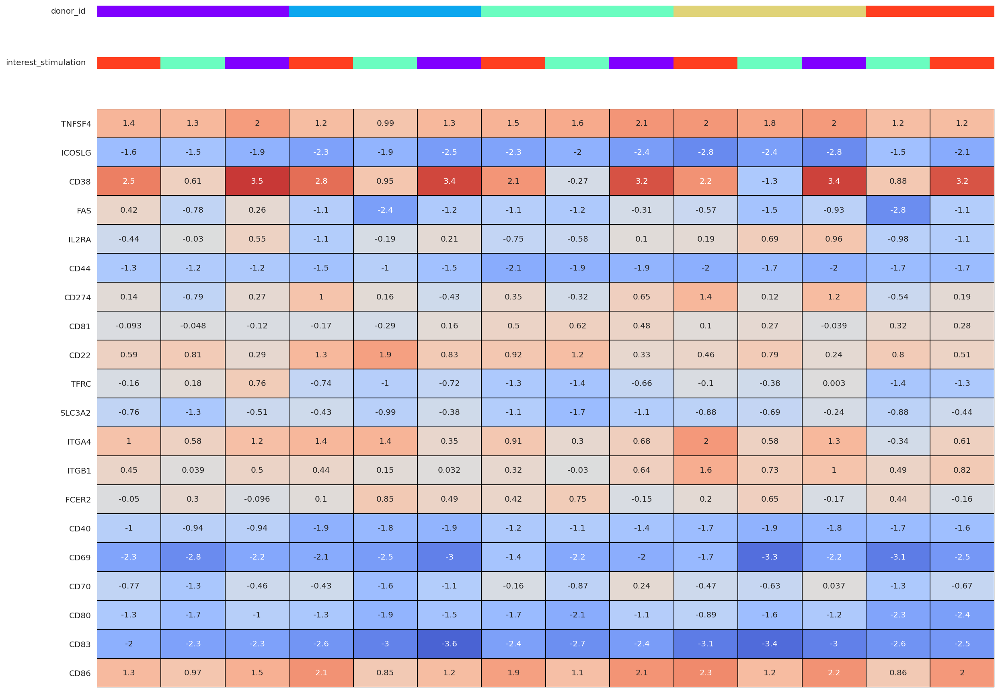

<AxesSubplot:>

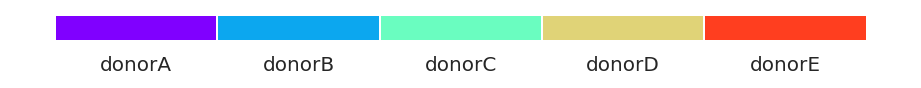

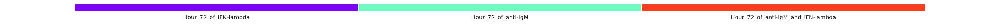

In [86]:
plt.figure(figsize=(20,15))

af = axis_matras([.3, .3, 15], x_len=20)
line_palette_annotation_plot(df['donor_id'], ax=next(af), 
                             palette=lin_colors(df['donor_id']))

line_palette_annotation_plot(df['interest_stimulation'], ax=next(af), 
                             palette=lin_colors(df['interest_stimulation']))



sns.heatmap(df.iloc[:, 5:26].T, annot = True, vmin=-4, vmax=4, center = 0, cmap= 'coolwarm',
          linewidths=1, linecolor='black', xticklabels=False, cbar=False,
            cbar_kws= {'orientation': 'horizontal'})
plt.show()
patch_plot(lin_colors(df['donor_id']), legend_right=True, vertical=True, h=8, show_ticks=True)
patch_plot(lin_colors(df['interest_stimulation']), legend_right=True, vertical=True, h=32, show_ticks=True)

## Динамика экспрессии в TPM

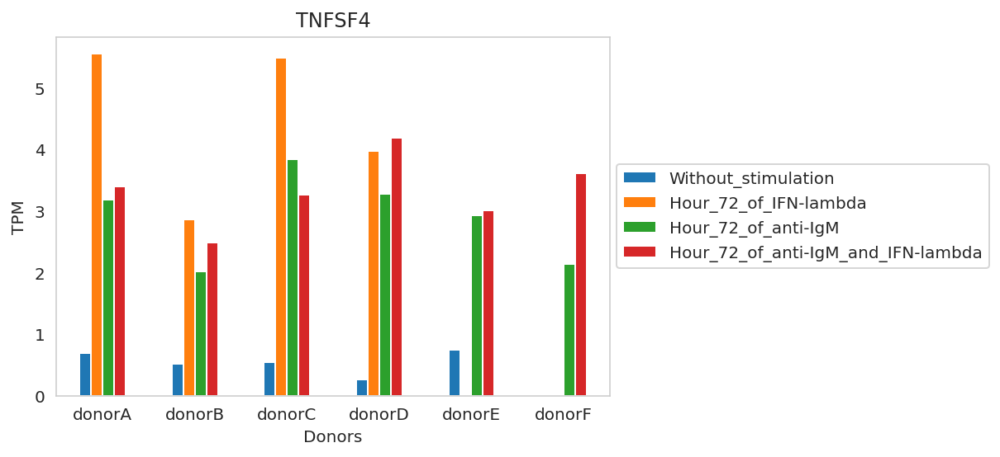

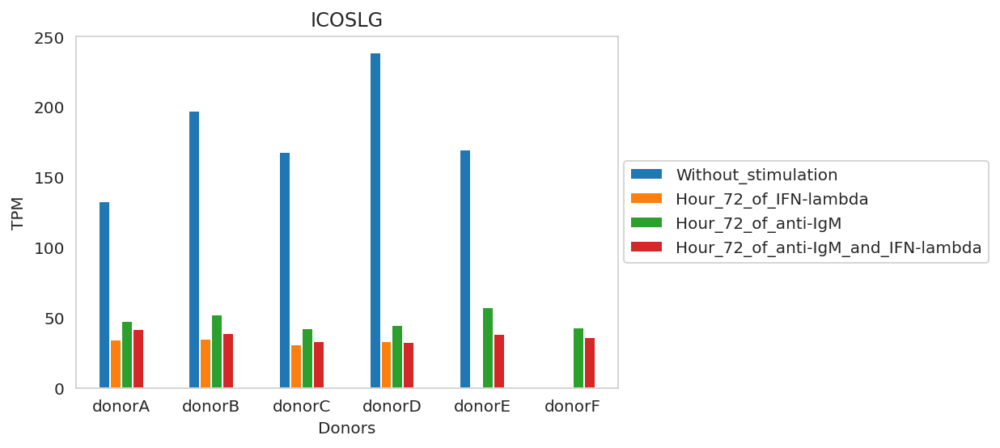

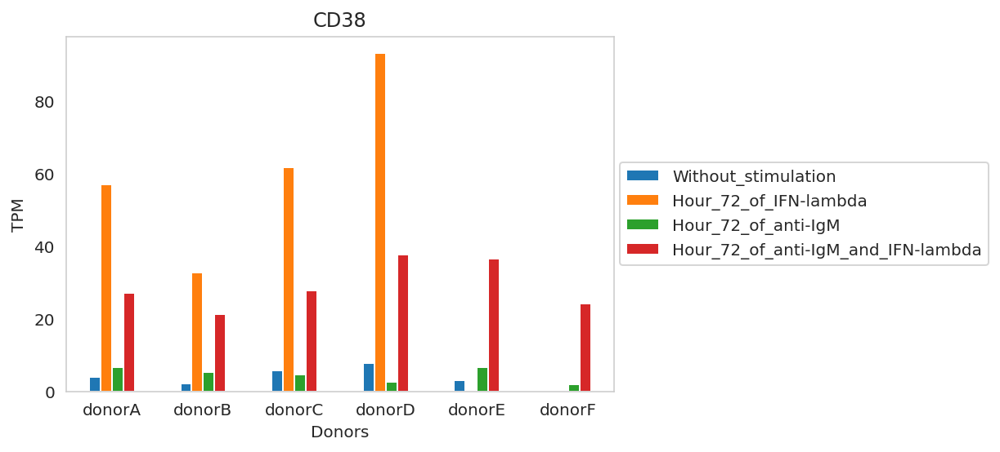

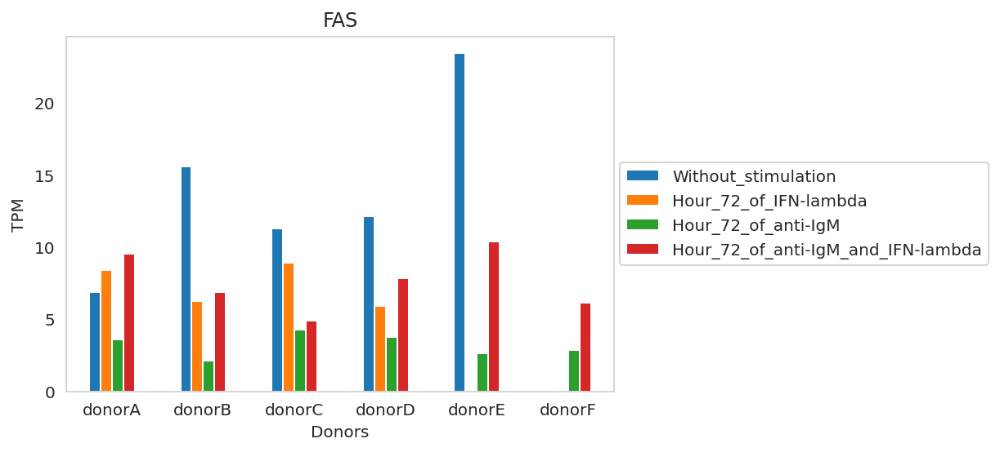

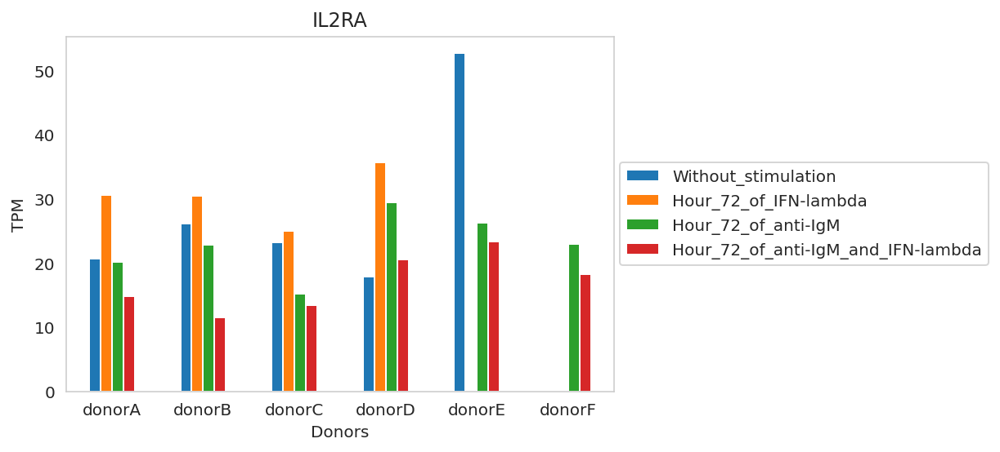

...

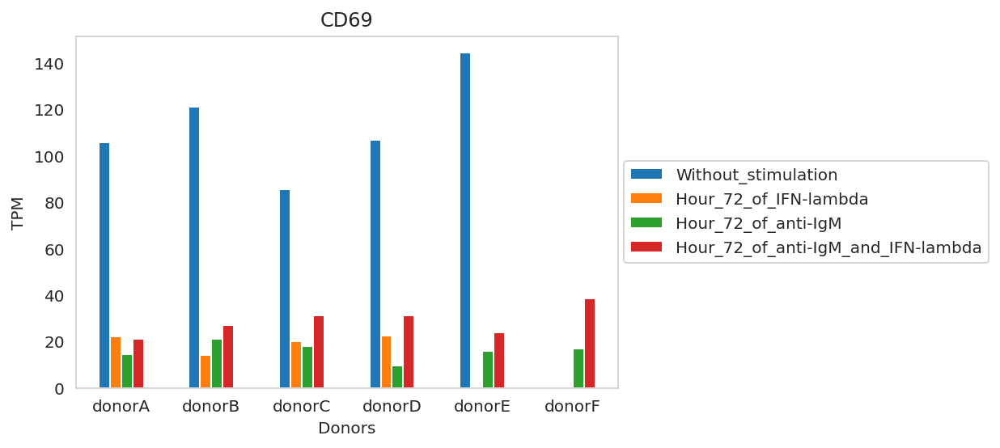

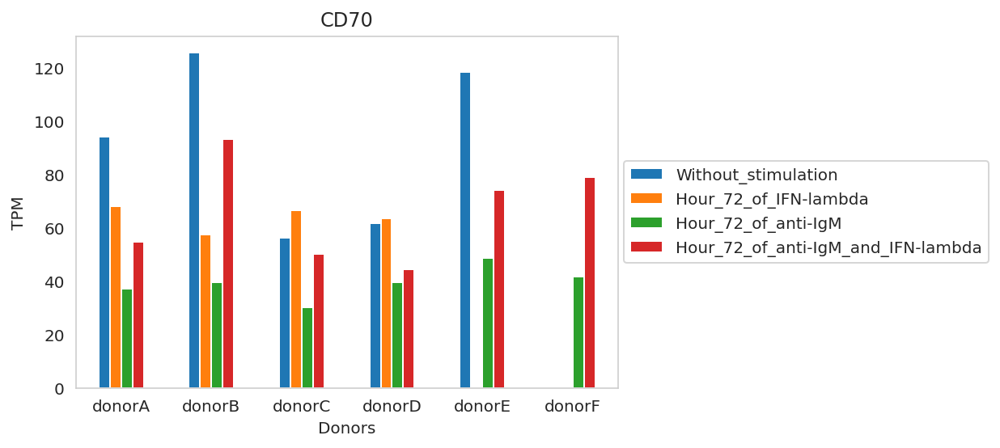

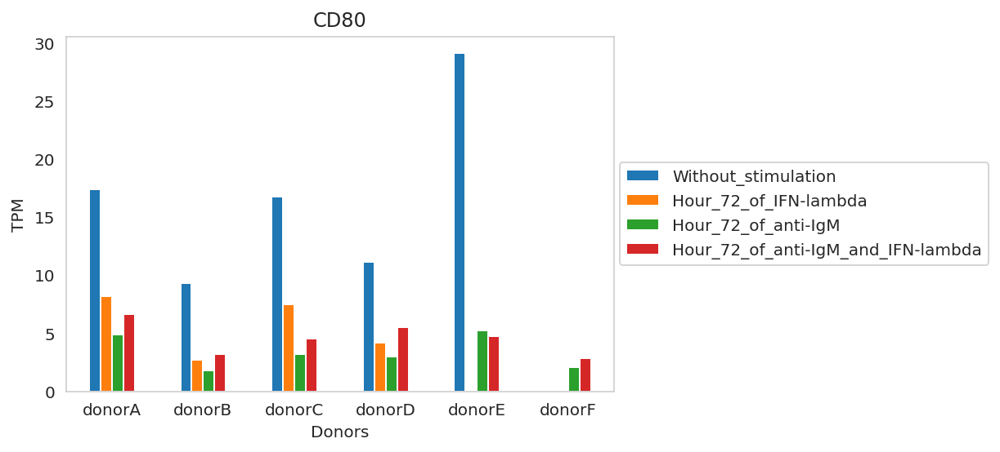

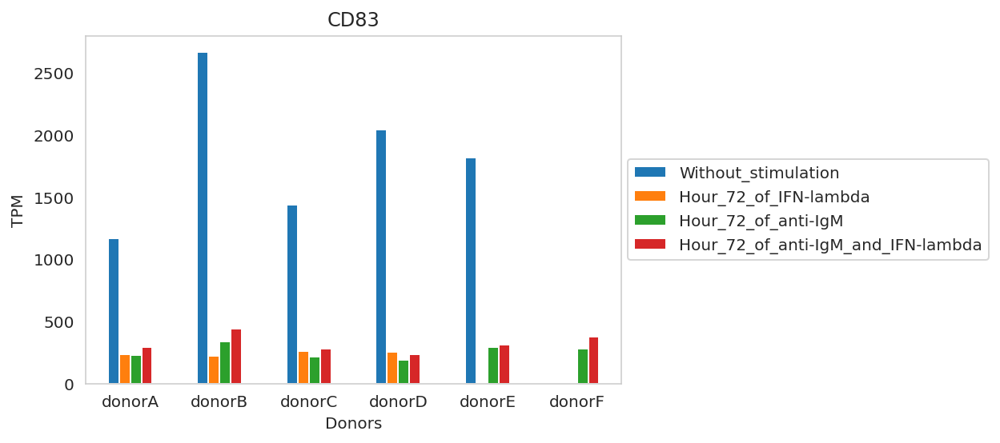

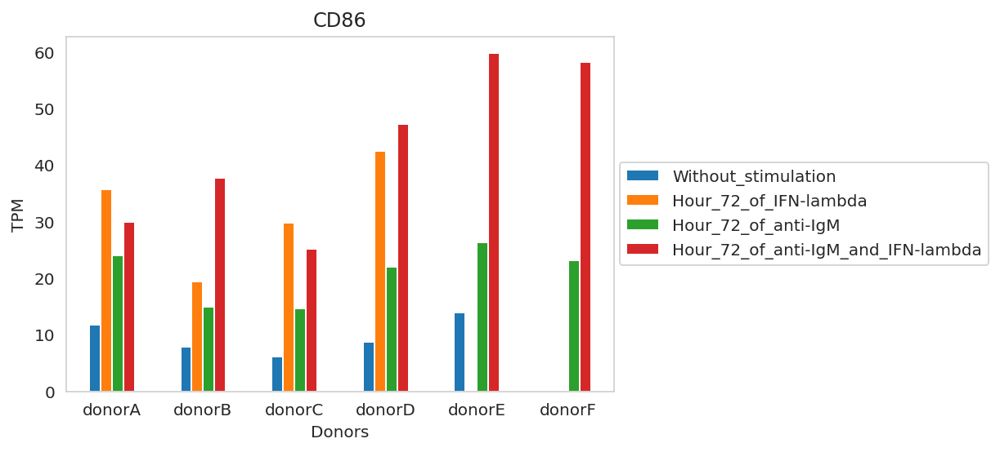

In [37]:
index = cells_GSE156195.Donor_id.unique()
columns = cells_GSE156195.Stimulation.unique()

for gene in list_gene_marker:
    df = pd.DataFrame(index=index, columns=columns)

    for ind in cells_GSE156195.index:
        df.loc[cells_GSE156195.loc[ind, 'Donor_id'], cells_GSE156195.loc[ind, 'Stimulation']] = expr_TPM.loc[gene, ind]

    ax = df.plot.bar(rot=0)
    ax.set_xlabel('Donors')
    ax.set_ylabel('TPM')
    ax.set_title(gene)
    ax.grid()
    ax.legend(loc="center right", bbox_to_anchor=(1.7, 0.5))

# Литературные гены: GSE151415

## GSE151415 download

In [12]:
cells = get_gspread('Annotation calculated', 'Cells_to_check')

In [50]:
cells_GSE151415 = cells[cells.Dataset == 'GSE151415']
cells_GSE151415

,Run,Dataset,Cell type,Cell_type_details,Extended_details,Stimulation,Therapy,Modification,Diagnosis,GSM,Sorting_markers,Comment,Cell_origin,Rna_extraction_kit,Library_preparation_kit,Cells_isolation_kit,Donor_id,Gender,Age,Age_range,PMID,Material_type,Layout,Readcounts,To_check,QC_bad,QC_good,QC_score,Who_checks,Decision,Expression_comment,Run_id,Sample_id,Run_tiledb_id,Sample_tiledb_id,Spike_in,Response,Material_sampling_time,Only for target (CR type),Prior_surgery,Diagnosis_comment,Stage,Combo_class,Measurement_method,Race/Ethnicity,UMI (Only for target),Deconvolution_cell_type,Filter_tag,Severity,
Sample,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
SRX8421707,SRR11872000,GSE151415,Transitional_B_cells,,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4577676,CD19+ CD24high CD38high CD39low IgD+,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,1,No_data,No_data,,33750787,,PAIRED,25709185,,,,4.08333,,,,141377,117525,129534,105353,,,,,,,,,,,,,,,
SRX8421708,SRR11872001,GSE151415,Breg_cells,B10-like Bregs,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4577677,CD19+ CD27+ CD39high IgD+,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,1,No_data,No_data,,33750787,,PAIRED,21495908,,,,4.08333,,,,141345,117493,129502,105321,,,,,,,,,,,,,,,
SRX8421709,SRR11872002,GSE151415,B_cells,,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4577678,CD19+ CD27- CD39high IgD+,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,1,No_data,No_data,,33750787,,PAIRED,21591885,,,,4.08333,,,,141371,117519,129528,105347,,,,,,,,,,,,,,,
SRX8421710,SRR11872003,GSE151415,Breg_cells,B10-like Bregs,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4577679,CD19+ CD27+ CD39high IgD-,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,1,No_data,No_data,,33750787,,PAIRED,26158401,,,,4.08333,,,,141323,117471,129480,105299,,,,,,,,,,,,,,,
SRX8421711,SRR11872004,GSE151415,B_cells,,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4577680,CD19+ CD27- CD39low IgD+,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,1,No_data,No_data,,33750787,,PAIRED,24993235,,,,4.08333,,,,141333,117481,129490,105309,,,,,,,,,,,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRX8421770,SRR11872063,GSE151415,Breg_cells,B10-like Bregs,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4577739,CD19+ CD27+ CD39high IgD-,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,6,No_data,No_data,,33750787,,PAIRED,31747748,,,,4.08333,,,,141379,117527,129536,105355,,,,,,,,,,,,,,,
SRX8421771,SRR11872064,GSE151415,Transitional_B_cells,,,Hour_16_of_CpG-B,Without_therapy,Without_modification,Healthy,GSM4577740,CD19+ CD24high CD38high CD39low IgD+,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,6,No_data,No_data,,33750787,,PAIRED,52915953,,,,4.66667,,,,141314,117462,129471,105290,,,,,,,,,,,,,,,
SRX8421772,SRR11872065,GSE151415,Breg_cells,B10-like Bregs,,Hour_16_of_CpG-B,Without_therapy,Without_modification,Healthy,GSM4577741,CD19+ CD27+ CD39high IgD+,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,6,No_data,No_data,,33750787,,PAIRED,4279821

In [64]:
cells_GSE151415.rename(columns = {'Cell type' : 'Cell_type'}, inplace = True) 

In [65]:
cells_GSE151415 = cells_GSE151415[(cells_GSE151415.Readcounts > 5000000)
                                & (cells_GSE151415.QC_score > 4)]

In [66]:
# в словарь записывает, какие сэмплы к каким стимуляциям относятся

dict_stimulations = {}
for stimul in cells_GSE151415.Stimulation.unique():
    dict_stimulations[stimul] = cells_GSE151415[cells_GSE151415.Stimulation == stimul].index

dict_stimulations

{'Without_stimulation': Index(['SRX8421707', 'SRX8421708', 'SRX8421709', 'SRX8421710', 'SRX8421711',
        'SRX8421712', 'SRX8421719', 'SRX8421720', 'SRX8421721', 'SRX8421722',
        'SRX8421723', 'SRX8421724', 'SRX8421731', 'SRX8421732', 'SRX8421734',
        'SRX8421735', 'SRX8421736', 'SRX8421743', 'SRX8421744', 'SRX8421745',
        'SRX8421746', 'SRX8421747', 'SRX8421748', 'SRX8421755', 'SRX8421756',
        'SRX8421757', 'SRX8421758', 'SRX8421759', 'SRX8421760', 'SRX8421767',
        'SRX8421768', 'SRX8421769', 'SRX8421770'],
       dtype='object', name='Sample'),
 'Hour_16_of_CpG-B': Index(['SRX8421713', 'SRX8421714', 'SRX8421715', 'SRX8421716', 'SRX8421717',
        'SRX8421718', 'SRX8421725', 'SRX8421726', 'SRX8421727', 'SRX8421728',
        'SRX8421729', 'SRX8421730', 'SRX8421737', 'SRX8421738', 'SRX8421739',
        'SRX8421740', 'SRX8421741', 'SRX8421742', 'SRX8421749', 'SRX8421750',
        'SRX8421751', 'SRX8421752', 'SRX8421753', 'SRX8421754', 'SRX8421761',
        '

In [67]:
expr_counts = read_expressions(cells_GSE151415, suf='-kallisto-Xena-gene-est_counts_without_noncoding.tsv')

In [68]:
expr_TPM = read_expressions(cells_GSE151415, suf='-kallisto-Xena-gene-TPM_without_noncoding.tsv')
expr_TPM = read_renorm_expressions(expr_TPM)

In [69]:
#cells_GSE151415, expr_counts = compare_df_annotation_with_df_expression(GSE151415, expr_counts)
#cells_GSE151415, expr_TPM = compare_df_annotation_with_df_expression(GSE151415, expr_TPM)

#cells_GSE156195 = cells_GSE156195.sort_values(by=['Donor_id'])

In [70]:
# интересующих список маркеров для B клеток
list_gene_marker_B_cells = ['TNFSF4', 
                    'ICOSLG', 
                    'CD38', 
                    'FAS', 
                    'IL2RA', 
                    'CD44', 
                    'CD274', 
                    'CD81', 
                    'CD22', 
                    'TFRC', 
                    'SLC3A2',  
                    'ITGA4', 
                    'ITGB1', 
                    'FCER2', 
#                    'B3GAT1', 
                    'CD40', 
                    'CD69', 
                    'CD70', 
                    'CD80', 
                    'CD83', 
                    'CD86']

In [71]:
# интересующих список маркеров для Bregs
list_gene_marker_Bregs = ['TNFSF4', 
                    'ICOSLG', 
                    'CD38', 
                    'FAS', 
                    'IL2RA', 
                    'CD44', 
                    'CD274', 
                    'CD81', 
                    'CD22', 
                    'TFRC', 
                    'SLC3A2',  
                    'ITGA4', 
                    'ITGB1', 
                    'FCER2', 
            #        'B3GAT1', 
                    'CD40', 
                    'CD69', 
                    'CD70', 
                    'CD80', 
                    'CD83', 
                    'CD86', 
                    'TIGIT', 
             #       'LAG3', 
                    'BTLA',  
                    'NT5E', 
                    'ENTPD1', 
              #      'HAVCR1', 
              #      'HAVCR2', 
             #       'FOXP3', 
                    'IL10', 
                    'IL12A', 
                    'EBI3',
                    'TGFB1', 
                    'IDO1', 
                    'GZMB'] 

In [72]:
# список маркеров для проверки GO:
list_try_GO = ['TGFB1',
 'CD27',
 'PRKCD',
 'MSH2',
 'INPP5D',
 'TPD52',
 'LAPTM5',
 'CARD11',
 'INHBA',
 'BCL6',
 'CD38',
 'IRF2BP2',
 'CD79A',
 'GAPT',
 'BST2',
 'BST1',
 'TNFRSF4',
 'LRRC8A',
 'ZAP70',
 'BLK',
 'ZFP36L1',
 'UNG',
 'NCKAP1L',
 'MS4A1',
 'DLL1',
 'TNFSF4',
 'TCIRG1',
 'IFNK',
 'IGHD',
 'IGHG3',
 'IFNA14',
 'IFNA7',
 'SFRP1',
 'IFNA1',
 'FOXP3',
 'CHRNA4',
 'NKX2-3',
 'THEMIS2',
 'FCGR2B',
 'CD180',
 'CEBPG',
 'EZH2',
 'ID2',
 'ITGA4',
 'NDFIP1',
 'CD22',
 'PHB',
 'SUPT6H',
 'TIRAP',
 'IFNE',
 'C17orf99',
 'FLT3',
 'RNF168',
 'FNIP1',
 'IL27RA',
 'TNFAIP3',
 'PLCG2',
 'IL7R',
 'KLF6',
 'PHB2',
 'EXOSC6',
 'BAD',
 'RNF8',
 'FZD9',
 'NOD2',
 'APLF',
 'TP53',
 'NTRK1',
 'IL21',
 'BLNK',
 'MFNG',
 'PIK3CD',
 'STAT5B',
 'CCR6',
 'CDKN1A',
 'FOXJ1',
 'CTLA4',
 'MZB1',
 'SYK',
 'RC3H1',
 'GON4L',
 'ADGRG3',
 'IFNA2',
 'IFNA10',
 'IFNA21',
 'IFNA5',
 'IFNA17',
 'IFNB1',
 'LAX1',
 'NFATC2',
 'CD74',
 'ADAM17',
 'PRKDC',
 'IGKC',
 'PTPRC',
 'IGHG1',
 'IGHM',
 'TICAM1',
 'NBN',
 'LAT2',
 'IL4I1',
 'AICDA',
 'TNFRSF13C',
 'CD320',
 'MIF',
 'TFRC',
 'CD40LG',
 'LYL1',
 'SYVN1',
 'WNT3A',
 'HDAC4',
 'IL13',
 'ATM',
 'ATAD5',
 'RIF1',
 'LGALS1',
 'HHEX',
 'HMGB3',
 'DCLRE1C',
 'GPS2',
 'MMP14',
 'IGBP1',
 'LIG4',
 'CD70',
 'SLC15A4',
 'SASH3',
 'XBP1',
 'CTPS1',
 'ST3GAL1',
 'ADA',
 'TRBC2',
 'FCRL3',
 'TLR9',
 'ERCC1',
 'EXO1',
 'IGLL5',
 'LYN',
 'FCRL1',
 'IRS2',
 'PTPN6',
 'SPI1',
 'EPHB2',
 'CR1',
 'IFNA8',
 'TNFSF13',
 'CHRNB2',
 'PAWR',
 'SLC39A10',
 'PCID2',
 'PTPN2',
 'TYROBP',
 'MEF2C',
 'HDAC9',
 'IKZF3',
 'VCAM1',
 'PLCL2',
 'SAMSN1',
 'TBC1D10C',
 'POU2AF1',
 'TBX21',
 'BAK1',
 'CLCF1',
 'AKAP17A',
 'IL10',
 'RBPJ',
 'LEF1',
 'BATF',
 'RABL3',
 'NOTCH2',
 'TNIP2',
 'PARP3',
 'PRKCB',
 'CXCR5',
 'TRAF3IP2',
 'PELI1',
 'BCL2',
 'SWAP70',
 'TCF3',
 'RAG1',
 'GPR183',
 'MSH6',
 'CASP3',
 'IL11',
 'PKN1',
 'HSPD1',
 'ITM2A',
 'ABL1',
 'BCL3',
 'DOCK11',
 'ZFP36L2',
 'CMTM7',
 'HMCES',
 'CD28',
 'SKAP2',
 'KIT',
 'THOC1',
 'CD300A',
 'SLC25A5',
 'IL5',
 'IL4',
 'INHA',
 'AHR',
 'CD19',
 'CR2',
 'PTK2B',
 'TXLNA',
 'TP53BP1',
 'CDH17',
 'IRF8',
 'HDAC5',
 'ITFG2',
 'PPP2R3C',
 'IFNA16',
 'IFNA4',
 'IFNA6',
 'IFNW1',
 'EXOSC3',
 'IL9',
 'YY1',
 'TNFRSF13B',
 'MNDA',
 'IL2',
 'RAG2',
 'SP3',
 'EP300',
 'PTPRJ',
 'MALT1',
 'MAD2L2',
 'IGLL1',
 'CASP8',
 'SH3KBP1',
 'ITGB1',
 'DNAJB9',
 'SLAMF8',
 'ZBTB7A',
 'TRDC',
 'ONECUT1',
 'VAV3',
 'RASGRP1',
 'MLH1',
 'IL6',
 'JAK3',
 'BANK1',
 'CD86',
 'CD40',
 'NHEJ1',
 'TNFSF13B',
 'STAT6',
 'DOCK10',
 'NFAM1',
 'ICOSLG',
 'LFNG',
 'BAX',
 'IL7',
 'TLR4',
 'CD81',
 'BTK',
 'TNFRSF21',
 'CD79B',
 'PELO',
 'CSDE1',
 'CNOT6',
 'DRD4',
 'DRD3',
 'DRD2']

## EDA analysis

<AxesSubplot:xlabel='Stimulation'>

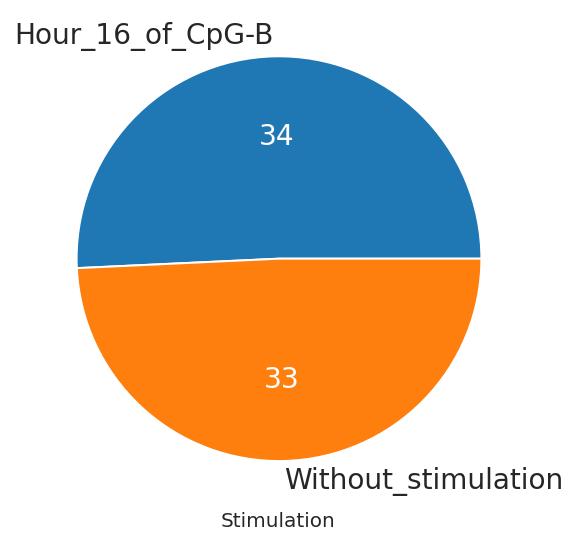

In [73]:
vector_pie_plot(cells_GSE151415.Stimulation, figsize=(4, 4.5), display_counts=True, order = ['Hour_16_of_CpG-B', 'Without_stimulation'])

<AxesSubplot:xlabel='Diagnosis'>

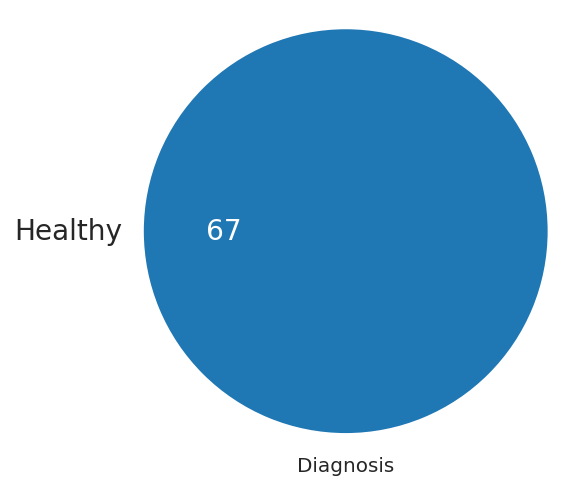

In [74]:
vector_pie_plot(cells_GSE151415.Diagnosis, display_counts=True)

<AxesSubplot:xlabel='Cell_type'>

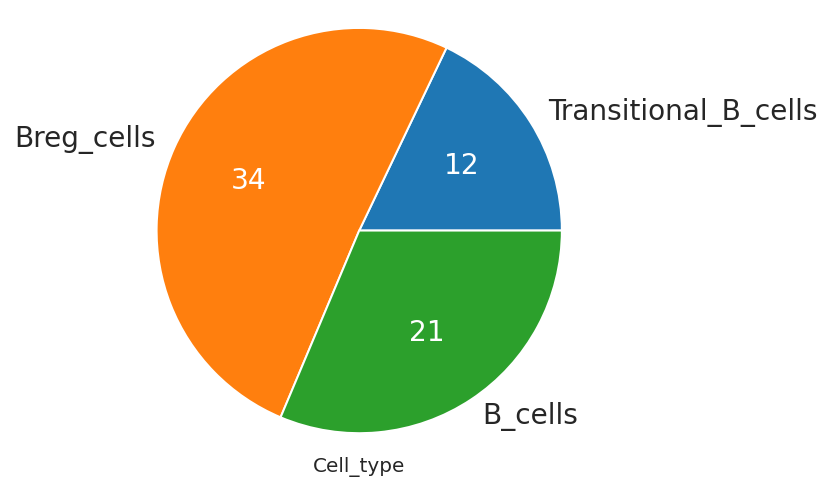

In [75]:
vector_pie_plot(cells_GSE151415.Cell_type, display_counts=True)

<AxesSubplot:xlabel='Donor_id'>

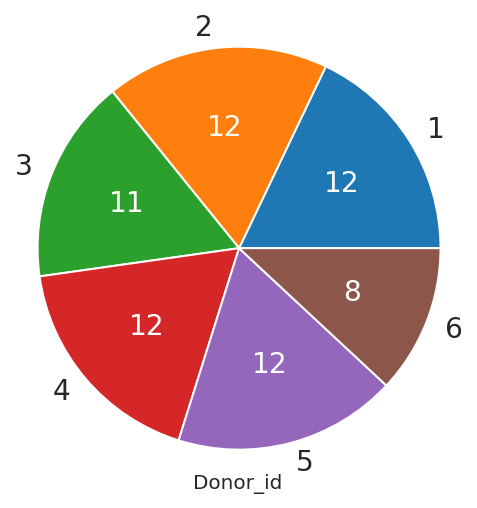

In [515]:
vector_pie_plot(cells_GSE151415.Donor_id, display_counts=True)

In [48]:
vector_pie_plot(cells_GSE151415.loc[cells_GSE151415.Cell_type == 'Transitional_B_cells'].Sorting_markers, title = 'Transitional_B_cells', display_counts=True)
vector_pie_plot(cells_GSE151415.loc[cells_GSE151415.Cell_type == 'Breg_cells'].Sorting_markers, title = 'Breg_cells', display_counts=True)
vector_pie_plot(cells_GSE151415.loc[cells_GSE151415.Cell_type == 'B_cells'].Sorting_markers, title = 'B_cells', display_counts=True)

AttributeError: 'DataFrame' object has no attribute 'Cell_type'

In [49]:
vector_pie_plot(cells_GSE151415.loc[cells_GSE151415.Donor_id == 1].Cell_type, title = 'Donor 1', display_counts=True)
vector_pie_plot(cells_GSE151415.loc[cells_GSE151415.Donor_id == 2].Cell_type, title = 'Donor 2', display_counts=True)
vector_pie_plot(cells_GSE151415.loc[cells_GSE151415.Donor_id == 3].Cell_type, title = 'Donor 3', display_counts=True)
vector_pie_plot(cells_GSE151415.loc[cells_GSE151415.Donor_id == 4].Cell_type, title = 'Donor 4', display_counts=True)
vector_pie_plot(cells_GSE151415.loc[cells_GSE151415.Donor_id == 5].Cell_type, title = 'Donor 5', display_counts=True)
vector_pie_plot(cells_GSE151415.loc[cells_GSE151415.Donor_id == 6].Cell_type, title = 'Donor 6', display_counts=True)

AttributeError: 'DataFrame' object has no attribute 'Cell_type'

## Transitional_B_cells

In [76]:
cells_GSE151415_Transitional = cells_GSE151415[(cells_GSE151415.Cell_type == 'Transitional_B_cells')]
expr_counts_Transitional = expr_counts[cells_GSE151415_Transitional.index]
expr_TPM_Transitional = expr_TPM[cells_GSE151415_Transitional.index]

In [77]:
# в словарь записывает, какие сэмплы к каким стимуляциям относятся

dict_stimulations_Transitional = {}
for stimul in cells_GSE151415_Transitional.Stimulation.unique():
    dict_stimulations_Transitional[stimul] = cells_GSE151415_Transitional[cells_GSE151415_Transitional.Stimulation == stimul].index

dict_stimulations_Transitional

{'Without_stimulation': Index(['SRX8421707', 'SRX8421719', 'SRX8421731', 'SRX8421743', 'SRX8421755',
        'SRX8421767'],
       dtype='object', name='Sample'),
 'Hour_16_of_CpG-B': Index(['SRX8421713', 'SRX8421725', 'SRX8421737', 'SRX8421749', 'SRX8421761',
        'SRX8421771'],
       dtype='object', name='Sample')}

### Проверка сортировочных маркеров

In [78]:
all_deconv_Transitional = model.predict(expr_TPM[cells_GSE151415_Transitional.index])

Expressions OK


In [79]:
#вывод примера для одного сампла

sample = 'SRX8421707'

fig, ax = plt.subplots(figsize=(90, 30))
plt.ylabel('ylabel', fontsize=80)
sns.barplot(x=all_deconv_Transitional[sample].index, y=all_deconv_Transitional[sample], ax=ax)

for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(50)
    
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(40)
    
plt.xticks(rotation=-90)
plt.title('Deconvolution check', fontsize=100)

Text(0.5, 1.0, 'Deconvolution check')

In [ ]:
#вывод для всех самплов (хорошая проверка)

for sample in all_deconv_Transitional.columns:
    fig, ax = plt.subplots(figsize=(90, 30))
    plt.ylabel('ylabel', fontsize=80)
    sns.barplot(x=all_deconv_Transitional[sample].index, y=all_deconv_Transitional[sample], ax=ax)
    
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    plt.xticks(rotation=-90)

### Сравнение среднего (edgeR) в каунтах

"-" означает, что было больше изначально

In [80]:
#для всех генов

list_edgeR_Transitional = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group(
                            expr_counts, 
                            dict_stimulations_Transitional[control], 
                            dict_stimulations_Transitional[interest], '')
list_edgeR_Transitional.append(DE)

list_edgeR_Transitional

[            logFC    logCPM         PValue            FDR
 ABTB2    7.731475  6.495280  3.012925e-227  6.044531e-223
 TRIP10   5.563942  7.544203  8.811368e-211  8.838684e-207
 SLC43A3  5.016008  8.444942  1.556627e-210  1.040969e-206
 LGALS3   7.621349  6.355537  3.660079e-188  1.835713e-184
 FCRL1   -4.995973  8.094502  6.245393e-186  2.505902e-182
 ...           ...       ...            ...            ...
 ZNF645   0.000000 -3.774526  1.000000e+00   1.000000e+00 
 ZNF804B  0.000000 -3.774526  1.000000e+00   1.000000e+00 
 ZNRF4    0.000000 -3.774526  1.000000e+00   1.000000e+00 
 ZP4      0.000000 -3.774526  1.000000e+00   1.000000e+00 
 ZSWIM2   0.000000 -3.774526  1.000000e+00   1.000000e+00 
 
 [20062 rows x 4 columns]]

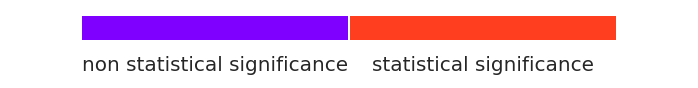

<Figure size 1800x144 with 0 Axes>

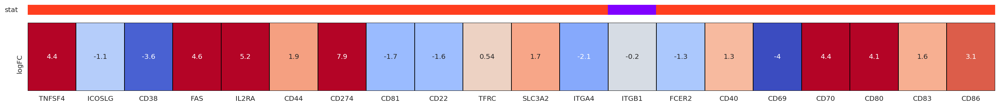

In [81]:
for i in list_edgeR_Transitional:
    draw_logFC_stat(i, list_gene_marker_B_cells, (25,2))

In [82]:
stimulation_expr_edgeR_Transitional = pd.concat([x[['logFC']] for x in list_edgeR_Transitional], axis=1)
stimulation_expr_edgeR_Transitional.columns = ['Hour_16_of_CpG-B']
stimulation_expr_edgeR_Transitional.head()

,Hour_16_of_CpG-B
ABTB2,7.731475
TRIP10,5.563942
SLC43A3,5.016008
LGALS3,7.621349
FCRL1,-4.995973


In [83]:
new = pd.concat([x[['logFC']] for x in list_edgeR_Transitional], axis=1)
new.columns = ['Transitional']
new = new.loc[new.index.isin(list_gene_marker_B_cells)]
#stimulation_expr_edgeR_graf = stimulation_expr_edgeR_graf.join(new)
#stimulation_expr_edgeR_graf.head()

In [89]:
new

,Transitional
CD274,7.913625
IL2RA,5.191661
CD38,-3.603135
TNFSF4,4.354778
ITGA4,-2.141391
FAS,4.554230
CD44,1.852083
CD70,4.352577
CD80,4.099278
CD69,-3.991322


### Сравнение по донорам в TPM

Сортировка по донорам (стимуляция одна)

In [105]:
df = pd.DataFrame(np.zeros((6,5 + len(list_gene_marker_B_cells))))
df.columns = ['donor_id', 'control_sample_id', 'control_stimulation', 'interest_sample_id', 
              'interest_stimulation'] + list_gene_marker_B_cells

i = 0 
for donor_id in cells_GSE151415_Transitional.Donor_id.unique():
    control_group = 'Without_stimulation'
    interest_group = 'Hour_16_of_CpG-B'
    
    #все сэмплы контрольной группы
    samples_control_group = dict_stimulations_Transitional[control_group]
    #сэмпл из сэмплов контрольной группы, подходящий иммено для нашего донора
    control_sample = list(cells_GSE151415_Transitional.loc[(samples_control_group)].loc[cells_GSE151415_Transitional.Donor_id == donor_id].index)[0]
        
    #все сэмплы интересной группы
    samples_interest_group = dict_stimulations_Transitional[interest_group]
    #сэмпл из сэмплов интересной группы, подходящий иммено для нашего донора
    interest_sample = list(cells_GSE151415_Transitional.loc[(samples_interest_group)].loc[cells_GSE151415_Transitional.Donor_id == donor_id].index)[0]
        
    df.loc[i, 'donor_id'] = donor_id
    df.loc[i, 'control_sample_id'] = control_sample
    df.loc[i, 'control_stimulation'] = control_group
    df.loc[i, 'interest_sample_id'] = interest_sample
    df.loc[i, 'interest_stimulation'] = interest_group
        
    for gene in list_gene_marker_B_cells:
        df.loc[i, gene] = np.log2((expr_TPM_Transitional.loc[gene,interest_sample] + 1) / (expr_TPM_Transitional.loc[gene,control_sample] + 1))
    i += 1 #для того, чтобы в следующую строку результат записывался

In [106]:
df

,donor_id,control_sample_id,control_stimulation,interest_sample_id,interest_stimulation,TNFSF4,ICOSLG,CD38,FAS,IL2RA,CD44,CD274,CD81,CD22,TFRC,SLC3A2,ITGA4,ITGB1,FCER2,CD40,CD69,CD70,CD80,CD83,CD86
0,1.0,SRX8421707,Without_stimulation,SRX8421713,Hour_16_of_CpG-B,2.949278,-2.322021,-3.336308,3.945096,5.674044,1.776507,5.307198,-2.528321,-0.909856,0.094514,0.956007,-2.012597,-0.066778,-0.041786,1.387232,-5.932172,2.445879,3.165570,0.015744,1.625683
1,2.0,SRX8421719,Without_stimulation,SRX8421725,Hour_16_of_CpG-B,3.362475,-1.252468,-2.705050,3.727016,4.578760,1.333594,5.600782,-1.709801,-1.868118,0.549866,1.215216,-2.419433,-0.740665,-1.814901,1.264693,-3.589159,3.551901,2.222197,1.512016,3.393378
2,3.0,SRX8421731,Without_stimulation,SRX8421737,Hour_16_of_CpG-B,2.594827,-1.714670,-3.502632,2.803636,5.550861,1.525442,5.404045,-2.113696,-1.692578,0.293323,1.315282,-2.566593,-1.034655,-1.155123,1.093897,-3.725754,3.832386,2.478062,1.761719,2.512711
3,4.0,SRX8421743,Without_stimulation,SRX8421749,Hour_16_of_CpG-B,3.445747,-0.576097,-3.456562,3.766670,5.070639,2.183662,6.756109,-1.784374,-2.426127,0.627783,3.311002,-2.358746,0.409844,-3.859404,1.344576,-2.996287,5.790982,2.297507,3.774618,3.368954
4,5.0,SRX8421755,Without_stimulation,SRX8421761,Hour_16_of_CpG-B,2.796160,-1.453118,-3.343959,3.796185,5.423236,1.429567,5.625521,-1.646677,-1.548837,0.435779,0.703172,-2.466205,-0.679377,-1.002258,1.071144,-5.012198,3.892758,3.214189,1.132310,2.907838
5,6.0,SRX8421767,Without_stimulation,SRX8421771,Hour_16_of_CpG-B,3.613426,-0.329875,-3.442415,4.729302,4.826084,1.404993,5.425871,-2.051178,-2.096884,1.018326,1.789598,-2.044970,-0.240408,-1.755345,1.286816,-3.540014,3.871744,2.962890,2.046699,2.132550


<Figure size 1440x1080 with 0 Axes>

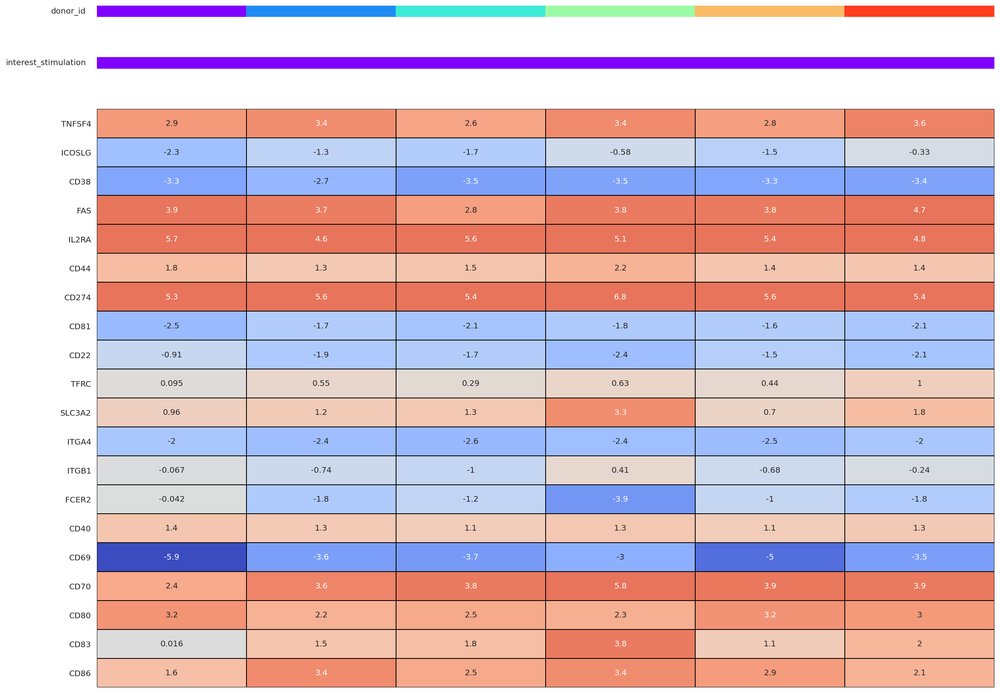

<AxesSubplot:>

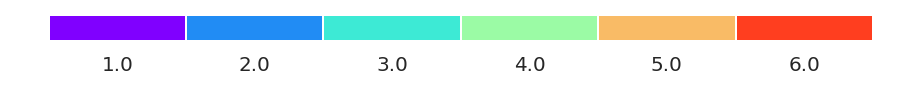

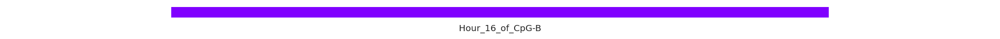

In [182]:
plt.figure(figsize=(20,15))

af = axis_matras([.3, .3, 15], x_len=20)
line_palette_annotation_plot(df['donor_id'], ax=next(af), 
                             palette=lin_colors(df['donor_id']))

line_palette_annotation_plot(df['interest_stimulation'], ax=next(af), 
                             palette=lin_colors(df['interest_stimulation']))



sns.heatmap(df.iloc[:, np.arange(5,25)].T, annot = True, vmin=-6, vmax=4, center =0,
            cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=False, cbar=False,
            cbar_kws= {'orientation': 'horizontal'})
plt.show()
patch_plot(lin_colors(df['donor_id']), legend_right=True, vertical=True, h=8, show_ticks=True)
patch_plot(lin_colors(df['interest_stimulation']), legend_right=True, vertical=True, h=20, show_ticks=True)

<AxesSubplot:>

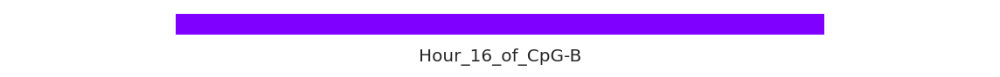

In [107]:
patch_plot(lin_colors(df['interest_stimulation']), legend_right=True, vertical=True, h=10, show_ticks=True)

### Динамика экспрессии в TPM

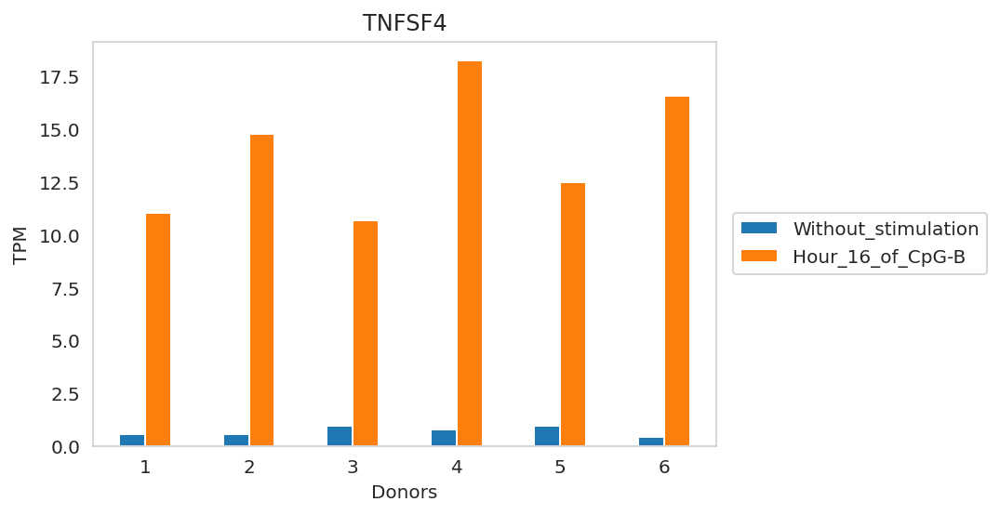

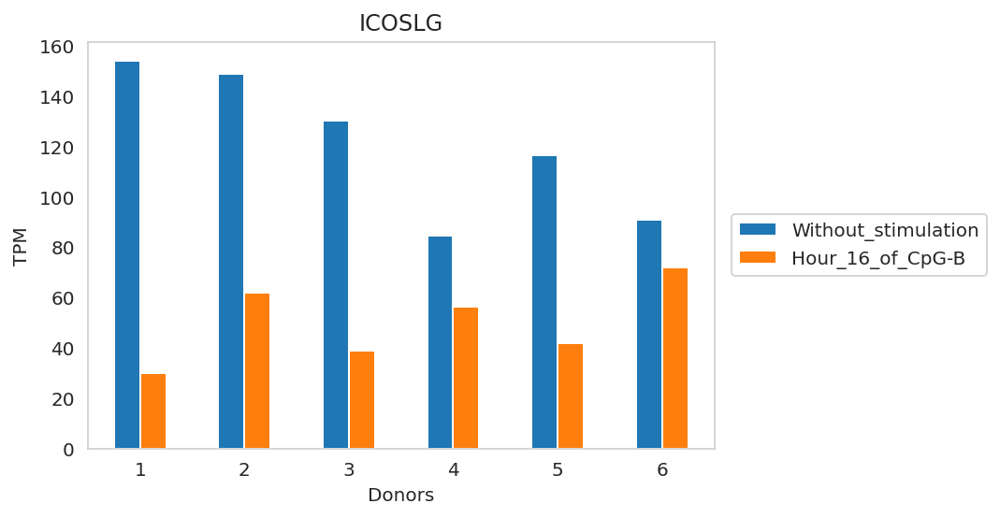

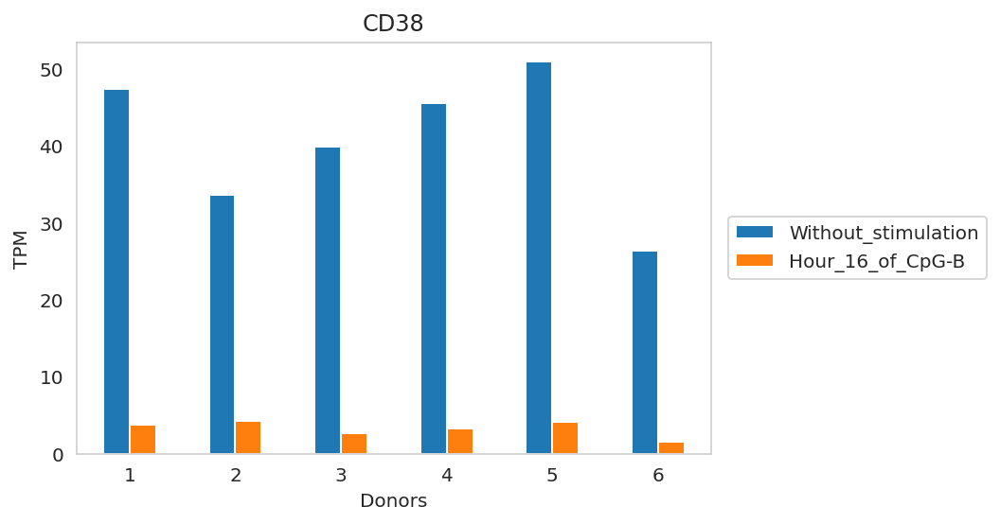

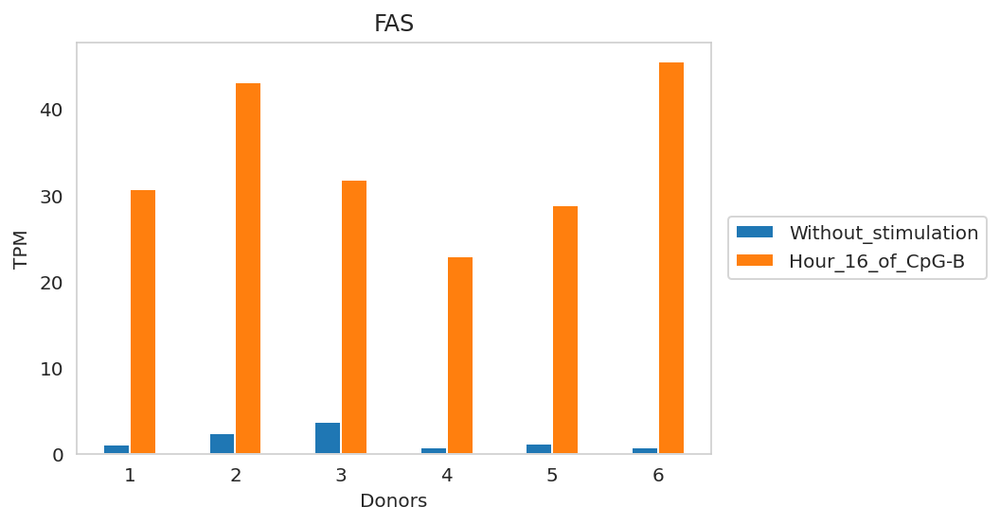

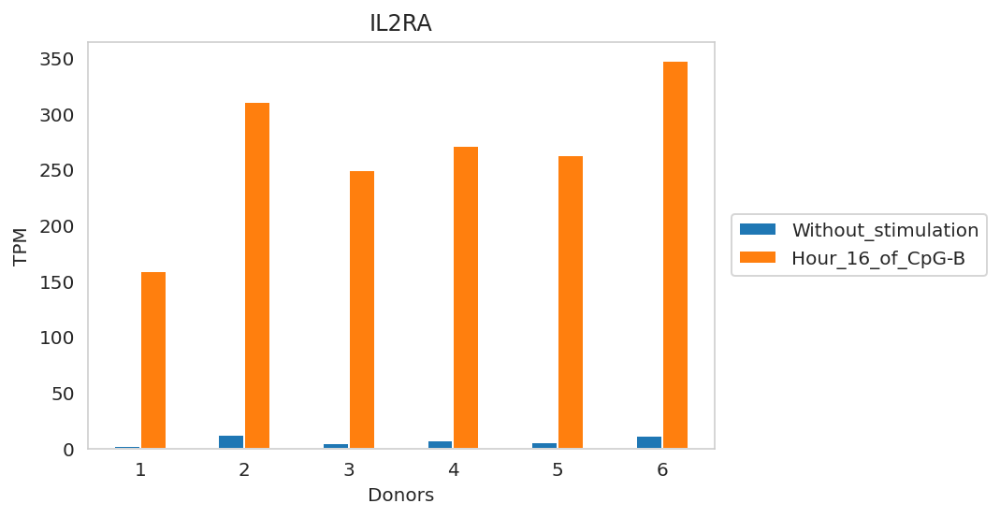

...

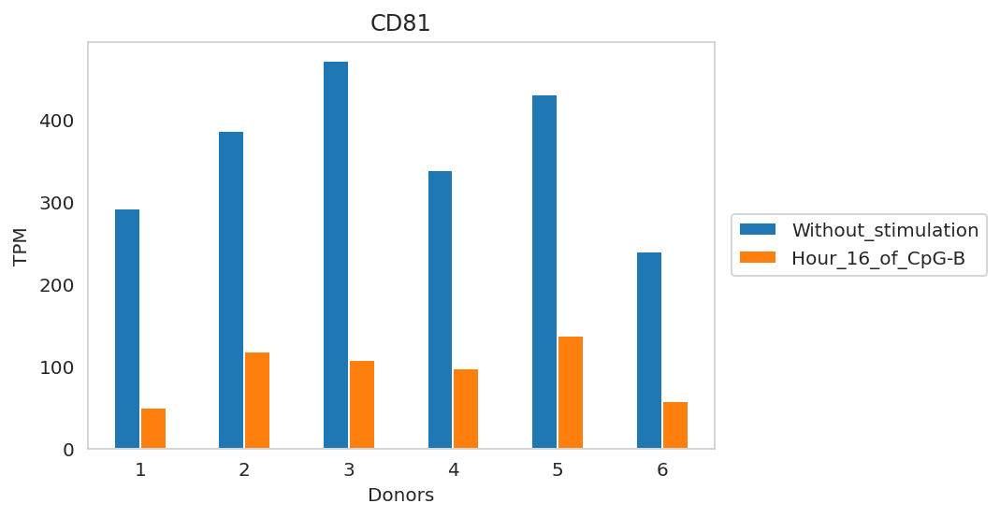

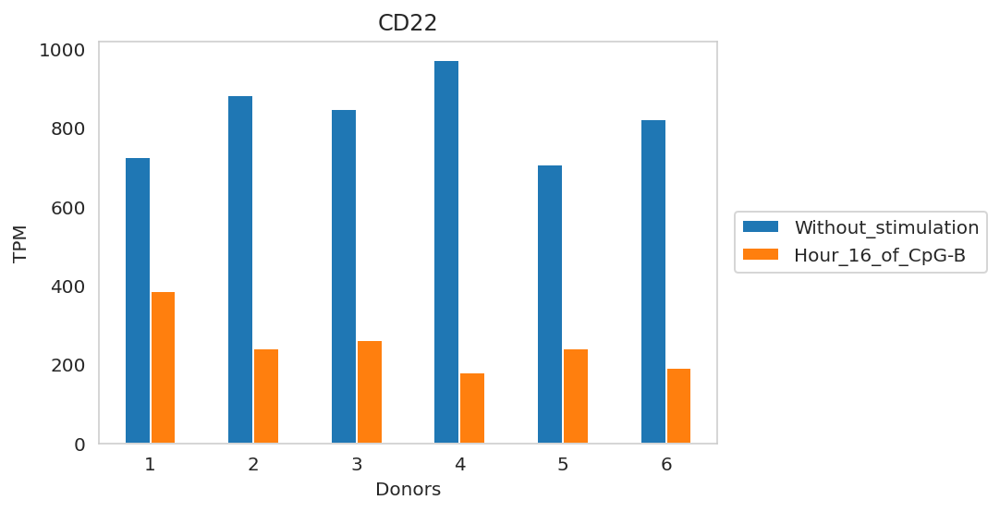

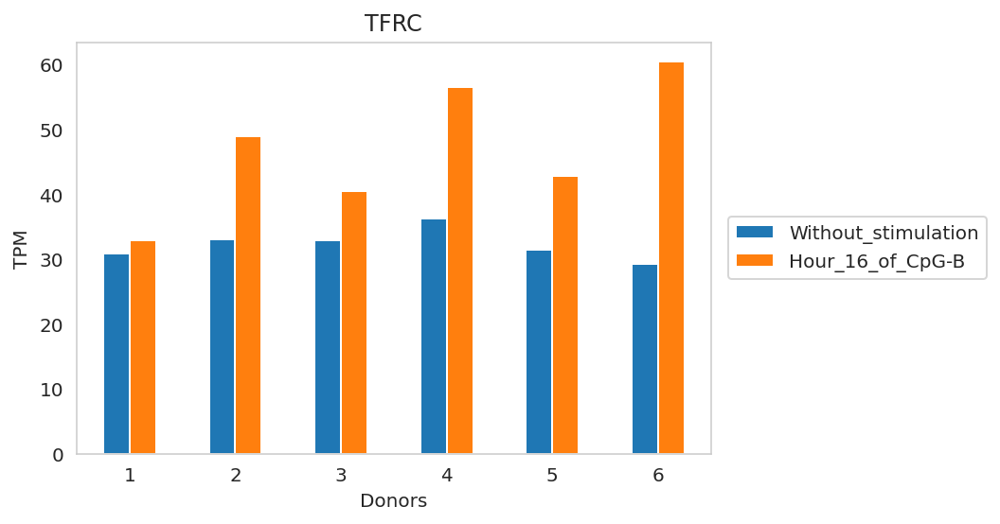

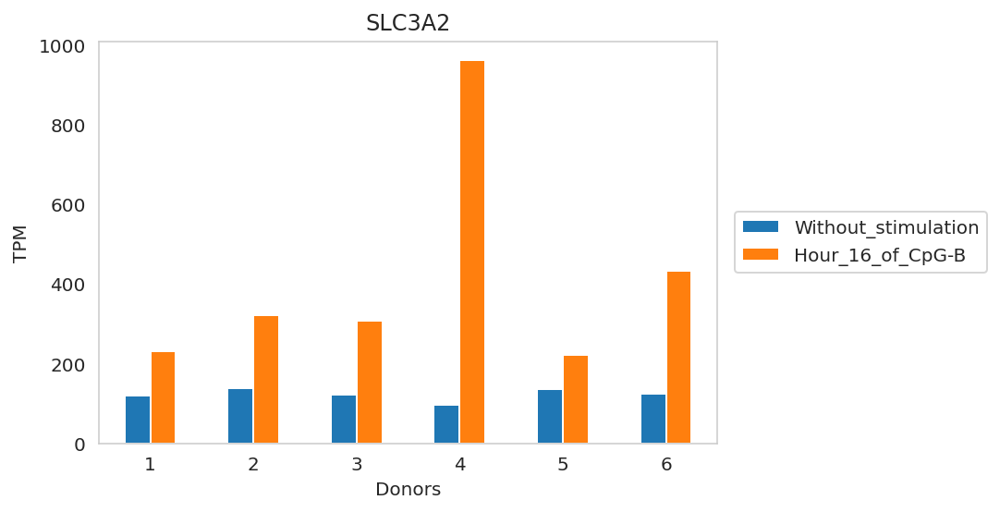

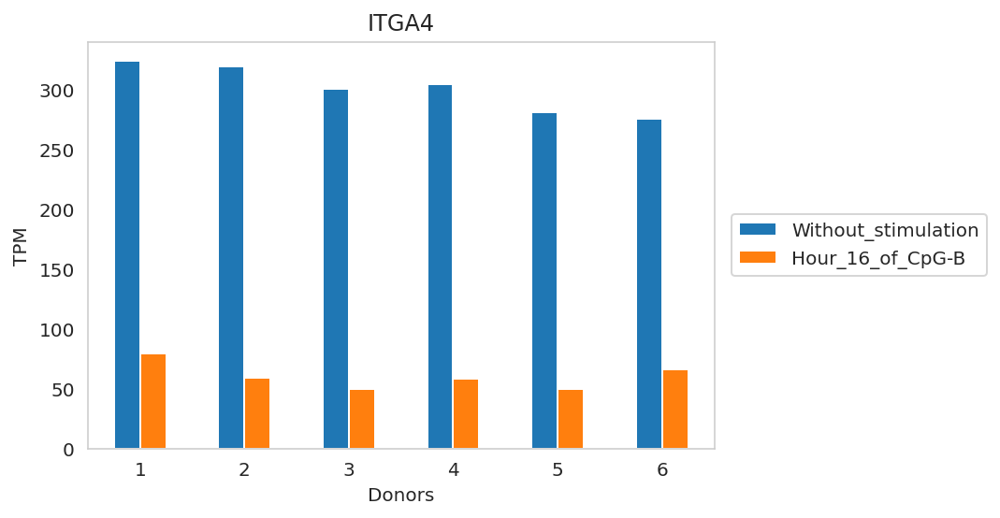

In [ ]:
index = cells_GSE151415_Transitional.Donor_id.unique()
columns = cells_GSE151415_Transitional.Stimulation.unique()

for gene in list_gene_marker_B_cells:
    df = pd.DataFrame(index=index, columns=columns)

    for ind in cells_GSE151415_Transitional.index:
        df.loc[cells_GSE151415_Transitional.loc[ind, 'Donor_id'], cells_GSE151415_Transitional.loc[ind, 'Stimulation']] = expr_TPM_Transitional.loc[gene, ind]

    ax = df.plot.bar(rot=0)
    ax.set_xlabel('Donors')
    ax.set_ylabel('TPM')
    ax.set_title(gene)
    ax.grid(visible=None)
    ax.legend(loc="center right", bbox_to_anchor=(1.45, 0.5))

## Breg-cells (all)

In [155]:
cells_GSE151415_Bregs_ALL = cells_GSE151415[(cells_GSE151415.Cell_type == 'Breg_cells')]
expr_counts_Bregs_ALL = expr_counts[cells_GSE151415_Bregs_ALL.index]
expr_TPM_Bregs_ALL = expr_TPM[cells_GSE151415_Bregs_ALL.index]

In [156]:
# в словарь записывает, какие сэмплы к каким стимуляциям относятся

dict_stimulations_Bregs_ALL = {}
for stimul in cells_GSE151415_Bregs_ALL.Stimulation.unique():
    dict_stimulations_Bregs_ALL[stimul] = cells_GSE151415_Bregs_ALL[cells_GSE151415_Bregs_ALL.Stimulation == stimul].index

dict_stimulations_Bregs_ALL

{'Without_stimulation': Index(['SRX8421708', 'SRX8421710', 'SRX8421712', 'SRX8421720', 'SRX8421722',
        'SRX8421724', 'SRX8421732', 'SRX8421734', 'SRX8421736', 'SRX8421744',
        'SRX8421746', 'SRX8421748', 'SRX8421756', 'SRX8421758', 'SRX8421760',
        'SRX8421768', 'SRX8421770'],
       dtype='object', name='Sample'),
 'Hour_16_of_CpG-B': Index(['SRX8421714', 'SRX8421716', 'SRX8421718', 'SRX8421726', 'SRX8421728',
        'SRX8421730', 'SRX8421738', 'SRX8421740', 'SRX8421742', 'SRX8421750',
        'SRX8421752', 'SRX8421754', 'SRX8421762', 'SRX8421764', 'SRX8421766',
        'SRX8421772', 'SRX8421774'],
       dtype='object', name='Sample')}

### Проверка сортировочных маркеров

In [157]:
all_deconv_Bregs_ALL = model.predict(expr_TPM[cells_GSE151415_Bregs_ALL.index])

Expressions OK


In [127]:
#вывод примера для одного сампла

sample = 'SRX8421708'

fig, ax = plt.subplots(figsize=(90, 30))
plt.ylabel('ylabel', fontsize=80)
sns.barplot(x=all_deconv_Bregs_ALL[sample].index, y=all_deconv_Bregs_ALL[sample], ax=ax)

for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(50)
    
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(50)
    
plt.xticks(rotation=-90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40]),
 [Text(0, 0, 'Other'),
  Text(1, 0, 'Basophils'),
  Text(2, 0, 'CD27neg_Memory_B_cells'),
  Text(3, 0, 'CD57neg_Cytotoxic_NK_cells'),
  Text(4, 0, 'CD57pos_Cytotoxic_NK_cells'),
  Text(5, 0, 'CDC'),
  Text(6, 0, 'Central_memory_CD8_T_cells'),
  Text(7, 0, 'Central_memory_T_helpers'),
  Text(8, 0, 'Class_switched_memory_B_cells'),
  Text(9, 0, 'Classical_monocytes'),
  Text(10, 0, 'Effector_memory_CD8_T_cells'),
  Text(11, 0, 'Effector_memory_T_helpers'),
  Text(12, 0, 'Eosinophils'),
  Text(13, 0, 'Naive_B_cells'),
  Text(14, 0, 'Naive_CD8_T_cells'),
  Text(15, 0, 'Naive_T_helpers'),
  Text(16, 0, 'Neutrophils'),
  Text(17, 0, 'Non_classical_monocytes'),
  Text(18, 0, 'Non_switched_memory_B_cells'),
  Text(19, 0, 'PDC'),
  Text(20, 0, 'Plasma_B_cells'),
  Text(21, 0, 'Plasmablasts'),
  Text(22, 0, '

In [ ]:
#вывод для всех самплов (хорошая проверка)

for sample in all_deconv_Bregs_ALL.columns:
    fig, ax = plt.subplots(figsize=(90, 30))
    plt.ylabel('ylabel', fontsize=80)
    sns.barplot(x=all_deconv_Bregs_ALL[sample].index, y=all_deconv_Bregs_ALL[sample], ax=ax)
    
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    plt.xticks(rotation=-90)

### Сравнение среднего (edgeR) в каунтах

"-" означает, что было больше изначально

In [158]:
#для всех генов

list_edgeR_Bregs_ALL = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group(
                            expr_counts, 
                            dict_stimulations_Bregs_ALL[control], 
                            dict_stimulations_Bregs_ALL[interest], '')
list_edgeR_Bregs_ALL.append(DE)

list_edgeR_Bregs_ALL

[                 logFC     logCPM         PValue            FDR
 SLC43A3      5.058194   8.342713   0.000000e+00   0.000000e+00 
 ITGA1        11.742073  5.183302   7.187593e-235  7.209875e-231
 TRAF1        5.687947   9.654227   1.687749e-230  1.128654e-226
 CTB-133G6.1 -6.864708   6.358048   2.527535e-229  1.267685e-225
 DUSP1       -7.029281   10.389131  1.598426e-223  6.413523e-220
 ...               ...         ...            ...            ...
 ZNF385B      0.000000  -3.743766   1.000000e+00   1.000000e+00 
 ZNF804B      0.000000  -3.743766   1.000000e+00   1.000000e+00 
 ZNRF4        0.000000  -3.743766   1.000000e+00   1.000000e+00 
 ZP4          0.000000  -3.743766   1.000000e+00   1.000000e+00 
 ZSWIM2       0.000000  -3.743766   1.000000e+00   1.000000e+00 
 
 [20062 rows x 4 columns]]

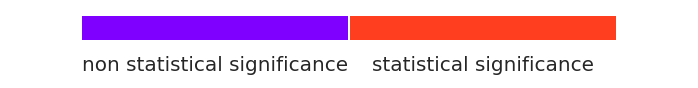

<Figure size 1800x144 with 0 Axes>

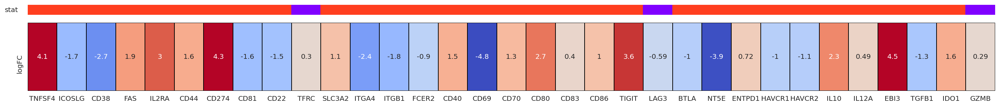

In [159]:
for i in list_edgeR_Bregs_ALL:
    draw_logFC_stat(i, list_gene_marker_Bregs, (25,2))

In [125]:
stimulation_expr_edgeR_Bregs_ALL = pd.concat([x[['logFC']] for x in list_edgeR_Bregs_ALL], axis=1)
stimulation_expr_edgeR_Bregs_ALL.columns = ['Hour_16_of_CpG-B']
stimulation_expr_edgeR_Bregs_ALL.head()

,Hour_16_of_CpG-B
SLC43A3,5.058194
ITGA1,11.742073
TRAF1,5.687947
CTB-133G6.1,-6.864708
DUSP1,-7.029281


### Сравнение по донорам в TPM

Сортировка по донорам (стимуляция одна)

In [160]:
#для попарного сравнение некоторых доноров на 2 группы разделила

cells_GSE151415_Bregs_ALL['Comment']['SRX8421710'] = 'donor1B'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421716'] = 'donor1B'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421712'] = 'donor1C'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421718'] = 'donor1C'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421708'] = 'donor1A'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421714'] = 'donor1A'

cells_GSE151415_Bregs_ALL['Comment']['SRX8421722'] = 'donor2B'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421728'] = 'donor2B'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421724'] = 'donor2C'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421730'] = 'donor2C'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421720'] = 'donor2A'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421726'] = 'donor2A'

cells_GSE151415_Bregs_ALL['Comment']['SRX8421734'] = 'donor3B'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421740'] = 'donor3B'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421736'] = 'donor3C'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421742'] = 'donor3C'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421732'] = 'donor3A'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421738'] = 'donor3A'

cells_GSE151415_Bregs_ALL['Comment']['SRX8421746'] = 'donor4B'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421752'] = 'donor4B'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421748'] = 'donor4C'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421754'] = 'donor4C'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421744'] = 'donor4A'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421750'] = 'donor4A'

cells_GSE151415_Bregs_ALL['Comment']['SRX8421758'] = 'donor5B'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421764'] = 'donor5B'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421760'] = 'donor5C'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421766'] = 'donor5C'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421756'] = 'donor5A'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421762'] = 'donor5A'

cells_GSE151415_Bregs_ALL['Comment']['SRX8421770'] = 'donor6B'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421774'] = 'donor6B'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421768'] = 'donor6A'
cells_GSE151415_Bregs_ALL['Comment']['SRX8421772'] = 'donor6A'

In [161]:
df = pd.DataFrame(np.zeros((9,5 + len(list_gene_marker_Bregs))))
df.columns = ['donor_id', 'control_sample_id', 'control_stimulation', 'interest_sample_id', 
              'interest_stimulation'] + list_gene_marker_Bregs

i = 0 
for donor_id in cells_GSE151415_Bregs_ALL.Comment.unique():
    control_group = 'Without_stimulation'
    interest_group = 'Hour_16_of_CpG-B'
    
    #все сэмплы контрольной группы
    samples_control_group = dict_stimulations_Bregs_ALL[control_group]
    #сэмпл из сэмплов контрольной группы, подходящий иммено для нашего донора
    control_sample = list(cells_GSE151415_Bregs_ALL.loc[(samples_control_group)].loc[cells_GSE151415_Bregs_ALL.Comment == donor_id].index)[0]
        
    #все сэмплы интересной группы
    samples_interest_group = dict_stimulations_Bregs_ALL[interest_group]
    #сэмпл из сэмплов интересной группы, подходящий иммено для нашего донора
    interest_sample = list(cells_GSE151415_Bregs_ALL.loc[(samples_interest_group)].loc[cells_GSE151415_Bregs_ALL.Comment == donor_id].index)[0]
    
    df.loc[i, 'donor_id'] = int(list(cells_GSE151415_Bregs_ALL.loc[(samples_control_group)].loc[cells_GSE151415_Bregs_ALL.Comment == donor_id].Donor_id)[0])
    df.loc[i, 'control_sample_id'] = control_sample
    df.loc[i, 'control_stimulation'] = control_group
    df.loc[i, 'interest_sample_id'] = interest_sample
    df.loc[i, 'interest_stimulation'] = interest_group
        
    for gene in list_gene_marker_Bregs:
        df.loc[i, gene] = np.log2((expr_TPM_Bregs_ALL.loc[gene,interest_sample] + 1) / (expr_TPM_Bregs_ALL.loc[gene,control_sample] + 1))
    i += 1 #для того, чтобы в следующую строку результат записывался

In [162]:
df

,donor_id,control_sample_id,control_stimulation,interest_sample_id,interest_stimulation,TNFSF4,ICOSLG,CD38,FAS,IL2RA,CD44,CD274,CD81,CD22,TFRC,SLC3A2,ITGA4,ITGB1,FCER2,CD40,CD69,CD70,CD80,CD83,CD86,TIGIT,LAG3,BTLA,NT5E,ENTPD1,HAVCR1,HAVCR2,IL10,IL12A,EBI3,TGFB1,IDO1,GZMB
0,1.0,SRX8421708,Without_stimulation,SRX8421714,Hour_16_of_CpG-B,2.553002,-4.200061,-1.171926,1.692785,1.796390,1.806274,4.217508,-3.182481,-0.992213,0.810775,0.530519,-2.381468,-1.889240,-0.106423,1.923635,-6.675238,-0.081334,1.776438,-1.026142,0.165679,2.789320,0.000000,-1.913282,-3.365982,0.742311,-0.584546,-0.300742,3.783679,1.262561,4.009454,-1.918784,0.236813,1.266350
1,1.0,SRX8421710,Without_stimulation,SRX8421716,Hour_16_of_CpG-B,2.763433,-2.200346,-1.352414,1.066389,1.549691,1.579789,3.935403,-1.156280,-0.414513,0.162176,0.812741,-2.590615,-2.538514,-0.070333,1.672814,-5.713529,0.212730,1.225829,-0.656630,-0.181185,3.096452,0.101423,-1.827401,-3.878587,1.223926,-0.441670,-0.917878,2.370477,0.532134,3.580235,-0.491363,-0.021032,1.456898
2,1.0,SRX8421712,Without_stimulation,SRX8421718,Hour_16_of_CpG-B,3.372693,-2.210462,-1.008938,2.149291,4.097359,2.070040,3.195716,-1.662281,-1.790217,-0.196435,1.648601,-2.198831,-0.991738,-0.229537,2.576731,-4.913268,2.497226,3.064375,0.034052,1.173241,1.751564,-0.054399,-0.403915,-3.163359,1.247436,0.285335,-0.398868,0.659316,-0.298015,5.230089,-0.952956,1.349522,0.617675
3,2.0,SRX8421720,Without_stimulation,SRX8421726,Hour_16_of_CpG-B,3.990619,-2.701133,-1.942016,2.916039,2.055682,1.119130,3.724073,-1.911080,-1.677623,0.732022,0.631504,-2.721808,-1.348100,-0.508754,1.638099,-5.053264,0.719584,3.264343,-0.507873,1.428287,2.608779,0.000000,-1.533872,-3.595974,0.121429,-0.027077,-0.422934,0.840505,-0.155835,5.903797,-1.364909,0.231810,-0.345685
4,2.0,SRX8421722,Without_stimulation,SRX8421728,Hour_16_of_CpG-B,3.706946,-1.462482,-2.530314,1.209405,2.031242,1.113841,3.247971,-0.658205,-1.142078,-0.159381,0.955885,-2.543568,-2.431274,-0.439247,1.407770,-4.354299,1.389251,1.898972,0.199389,0.583593,2.794483,0.110216,-1.251465,-3.353934,0.745762,-0.280842,-0.912706,-0.334723,0.776062,4.435042,-0.195792,0.392551,0.959519
5,2.0,SRX8421724,Without_stimulation,SRX8421730,Hour_16_of_CpG-B,2.667499,-1.361548,-1.660677,0.876966,2.365503,0.904876,4.319601,-2.424581,-1.305322,0.064111,0.860175,-2.169074,-1.172557,0.055772,1.423695,-4.297556,1.956694,1.786755,0.464965,1.050484,1.629662,0.044544,-1.252749,-3.240889,1.810893,-0.439264,-0.614485,0.811706,-0.671814,4.316566,-1.653578,1.124131,-2.557695
6,3.0,SRX8421732,Without_stimulation,SRX8421738,Hour_16_of_CpG-B,3.125595,-2.577722,-0.993275,1.631157,3.093897,1.779512,2.817645,-3.007711,-1.245096,0.365298,0.744550,-2.727510,-2.173032,-0.382496,1.587773,-4.712888,1.238949,2.452332,1.014333,0.398123,3.469916,0.000000,-1.699484,-3.265137,0.598777,0.313911,-0.605688,1.576789,0.666435,3.524222,-2.610470,0.275461,0.732095
7,3.0,SRX8421734,Without_stimulation,SRX8421740,Hour_16_of_CpG-B,2.320251,-3.228215,-0.652291,4.855774,4.524350,1.847292,4.210948,-1.266881,-2.215959,1.500984,1.269689,-2.524042,0.577233,-3.806996,0.669628,-5.424811,4.713637,5.066655,-0.720185,2.087378,4.027910,-0.062527,-4.010116,-4.135500,1.031671,-0.823834,0.018043,0.700289,0.088295,5.925741,-1.181538,-0.210122,1.913210
8,3.0,SRX8421736,Without_stimulation,SRX8421742,Hour_16_of_CpG-B,2.822511,0.272157,-1.646896,0.935879,3.772797,0.997672,4.374199,-1.071665,-1.475479,-0.127231,1.865388,-2.340254,-2.277884,-1.069513,0.996074,-3.510378,0.977703,1.694088,1.286271,0.711217,1.679224,-0.109663,-0.606362,-3.201990,0.172252,-0.050263,-1.239244,2.946817,-1.256796,4.830703,-0.956309,0.091424,0.028182
9,4.0,SRX8421744,Without_stimulation,SRX8421750,Hour_16_of_CpG-B,3.629767,-2.512365,-1.746205,1.905197,2.634635,1.663410,3.993365,-2.956301,-1.796115,0.350730,2.108378,-2.484451,-1.418967,-1.260242,1.476548,-5.424772,2.003520,3.121022,1.402737,1.197605,2.630501,0.061115,-1.742957,-3.278244,0.630977,-0.344315,-0.371686,1.767726,1.896788,

<Figure size 1440x1080 with 0 Axes>

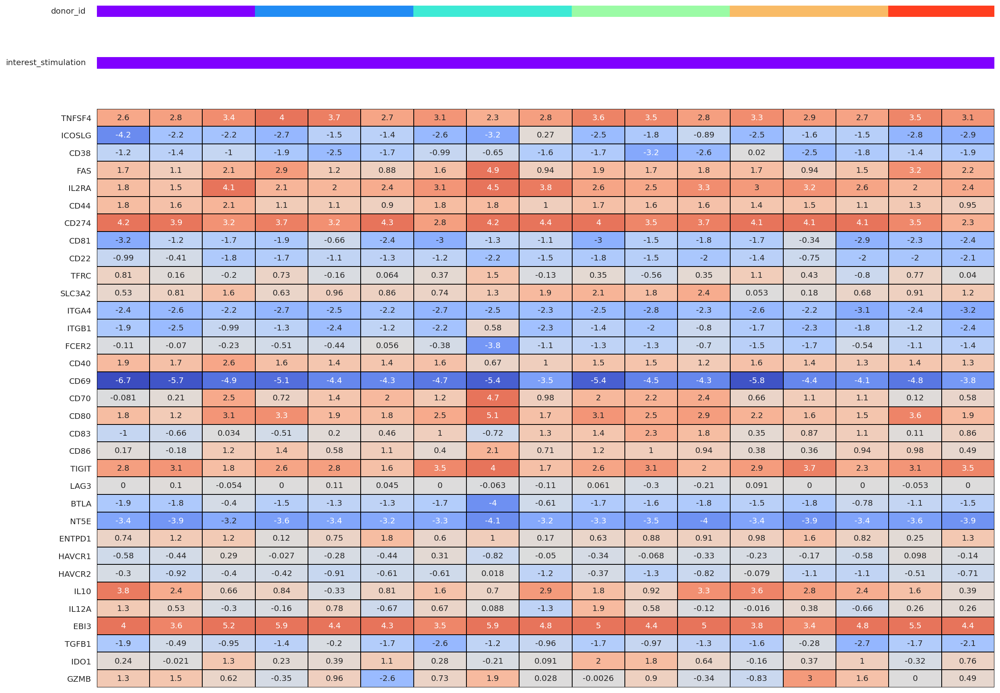

<AxesSubplot:>

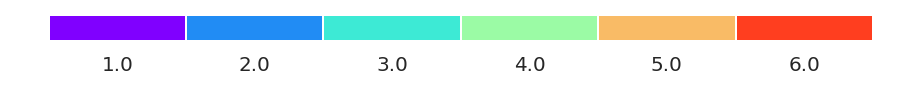

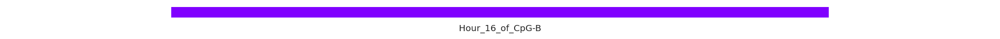

In [164]:
plt.figure(figsize=(20,15))

af = axis_matras([.3, .3, 15], x_len=20)
line_palette_annotation_plot(df['donor_id'], ax=next(af), 
                             palette=lin_colors(df['donor_id']))

line_palette_annotation_plot(df['interest_stimulation'], ax=next(af), 
                             palette=lin_colors(df['interest_stimulation']))



sns.heatmap(df.iloc[:, np.arange(5,38)].T, annot = True, vmin=-6, vmax=4, center =0,
            cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=False, cbar=False,
            cbar_kws= {'orientation': 'horizontal'})
plt.show()
patch_plot(lin_colors(df['donor_id']), legend_right=True, vertical=True, h=8, show_ticks=True)
patch_plot(lin_colors(df['interest_stimulation']), legend_right=True, vertical=True, h=20, show_ticks=True)

### Динамика экспрессии в TPM

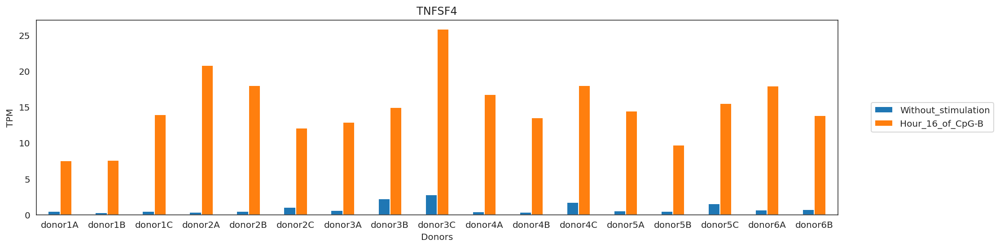

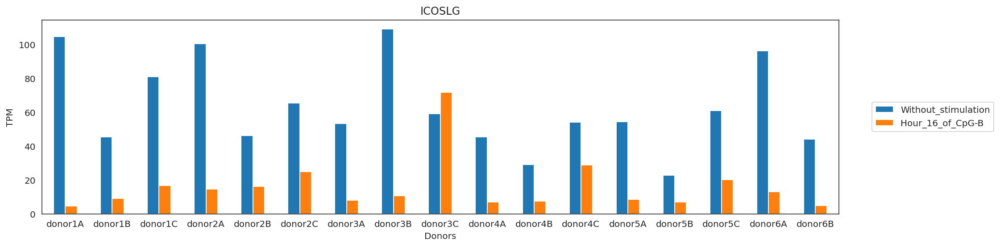

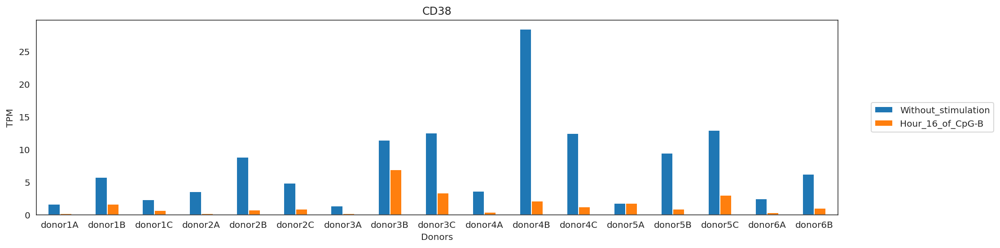

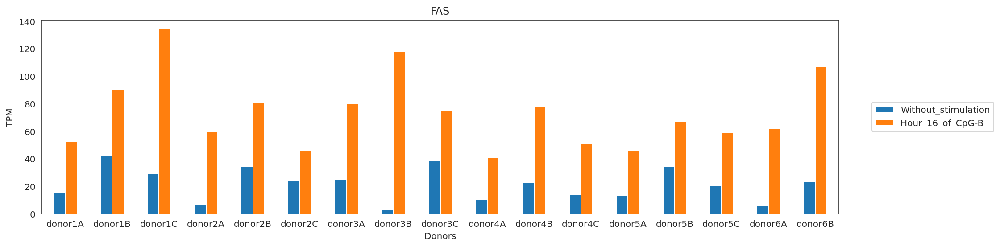

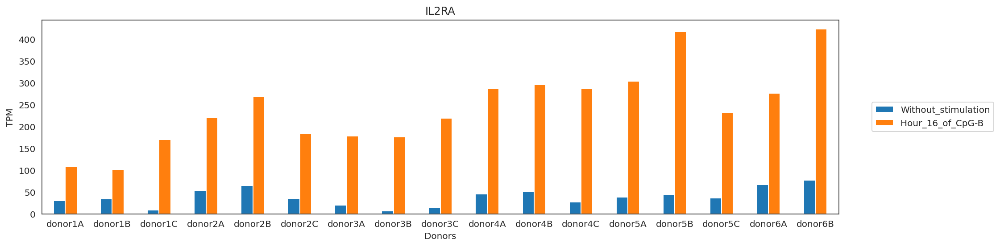

...

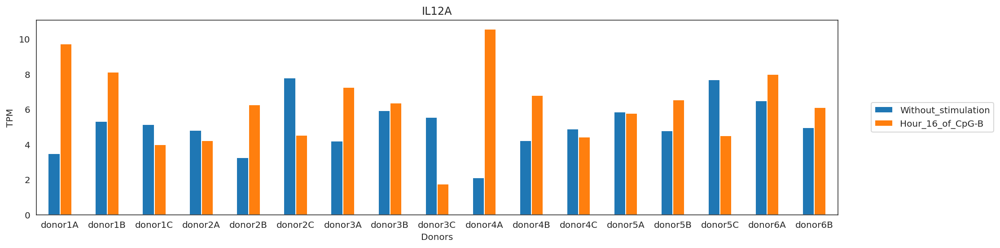

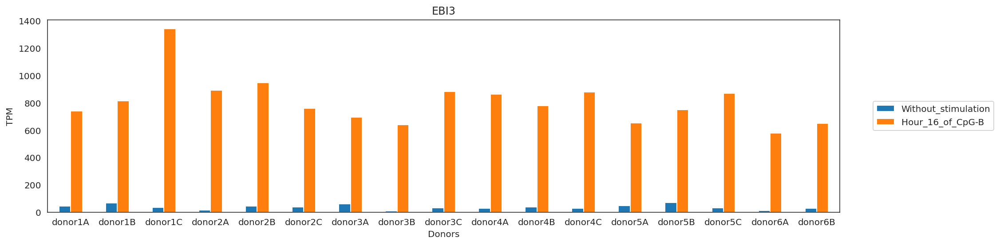

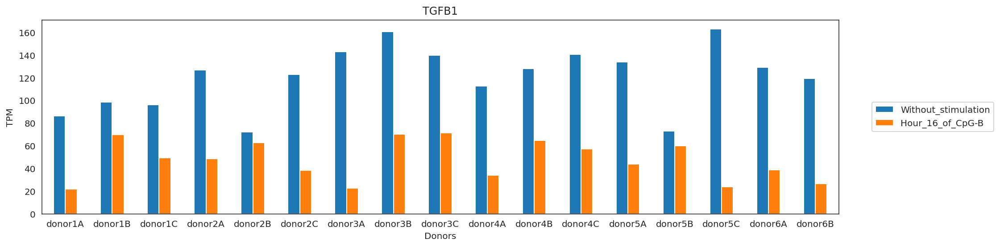

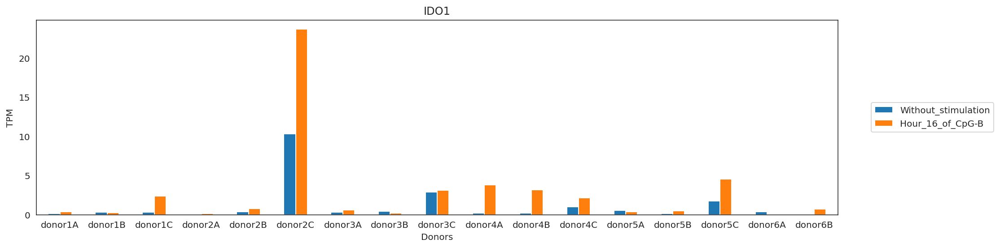

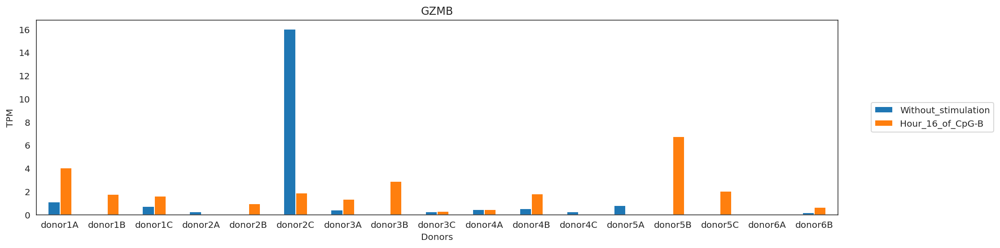

In [174]:
index = cells_GSE151415_Bregs_ALL.Comment.unique()
columns = cells_GSE151415_Bregs_ALL.Stimulation.unique()

for gene in list_gene_marker_Bregs:
    df = pd.DataFrame(index=index, columns=columns)

    for ind in cells_GSE151415_Bregs_ALL.index:
        df.loc[cells_GSE151415_Bregs_ALL.loc[ind, 'Comment'], cells_GSE151415_Bregs_ALL.loc[ind, 'Stimulation']] = expr_TPM_Bregs_ALL.loc[gene, ind]

    ax = df.plot.bar(rot=0)
    ax.set_xlabel('Donors')
    ax.set_ylabel('TPM')
    ax.set_title(gene)
    ax.legend(loc="center right", bbox_to_anchor=(1.2, 0.5))
    fig=ax.figure
    fig.set_figwidth(16)

## Breg-cells (SM: CD19+ CD27+ CD39high IgD+)

In [165]:
cells_GSE151415_Bregs_IgD = cells_GSE151415[(cells_GSE151415.Cell_type == 'Breg_cells') & (cells_GSE151415.Sorting_markers == 'CD19+ CD27+ CD39high IgD+')]
expr_counts_Bregs_IgD = expr_counts[cells_GSE151415_Bregs_IgD.index]
expr_TPM_Bregs_IgD = expr_TPM[cells_GSE151415_Bregs_IgD.index]

In [166]:
# в словарь записывает, какие сэмплы к каким стимуляциям относятся

dict_stimulations_Bregs_IgD = {}
for stimul in cells_GSE151415_Bregs_IgD.Stimulation.unique():
    dict_stimulations_Bregs_IgD[stimul] = cells_GSE151415_Bregs_IgD[cells_GSE151415_Bregs_IgD.Stimulation == stimul].index

dict_stimulations_Bregs_IgD

{'Without_stimulation': Index(['SRX8421708', 'SRX8421720', 'SRX8421732', 'SRX8421744', 'SRX8421756',
        'SRX8421768'],
       dtype='object', name='Sample'),
 'Hour_16_of_CpG-B': Index(['SRX8421714', 'SRX8421726', 'SRX8421738', 'SRX8421750', 'SRX8421762',
        'SRX8421772'],
       dtype='object', name='Sample')}

### Проверка сортировочных маркеров

In [ ]:
all_deconv_Bregs_IgD = model.predict(expr_TPM[cells_GSE151415_Bregs_IgD.index])

In [ ]:
#вывод примера для одного сампла

sample = 'SRX8421708'

fig, ax = plt.subplots(figsize=(90, 30))
plt.ylabel('ylabel', fontsize=80)
sns.barplot(x=all_deconv_Bregs_IgD[sample].index, y=all_deconv_Bregs_IgD[sample], ax=ax)

for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(50)
    
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(50)
    
plt.xticks(rotation=-90)

In [ ]:
#вывод для всех самплов (хорошая проверка)

for sample in all_deconv_Bregs_IgD.columns:
    fig, ax = plt.subplots(figsize=(90, 30))
    plt.ylabel('ylabel', fontsize=80)
    sns.barplot(x=all_deconv_Bregs_IgD[sample].index, y=all_deconv_Bregs_IgD[sample], ax=ax)
    
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    plt.xticks(rotation=-90)

### Сравнение среднего (edgeR) в каунтах

"-" означает, что было больше изначально

In [167]:
#для всех генов

list_edgeR_Bregs_IgD = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group(
                            expr_counts, 
                            dict_stimulations_Bregs_IgD[control], 
                            dict_stimulations_Bregs_IgD[interest], '')
list_edgeR_Bregs_IgD.append(DE)

list_edgeR_Bregs_IgD

[                 logFC     logCPM         PValue            FDR
 ITGA1        14.429959  5.718053   1.409703e-234  2.828147e-230
 FOS         -10.747555  10.063625  1.209973e-216  1.213723e-212
 CTB-133G6.1 -7.252216   6.176692   1.287442e-213  8.609554e-210
 SLC43A3      5.334072   8.410360   1.209382e-171  6.065657e-168
 FOSB        -8.374484   7.420388   7.345380e-171  2.947260e-167
 ...               ...        ...             ...            ...
 ZNF488       0.000000  -3.714416   1.000000e+00   1.000000e+00 
 ZNF804B      0.000000  -3.714416   1.000000e+00   1.000000e+00 
 ZNRF4        0.000000  -3.714416   1.000000e+00   1.000000e+00 
 ZP4          0.000000  -3.714416   1.000000e+00   1.000000e+00 
 ZSWIM2       0.000000  -3.714416   1.000000e+00   1.000000e+00 
 
 [20062 rows x 4 columns]]

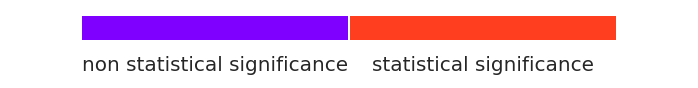

<Figure size 1800x144 with 0 Axes>

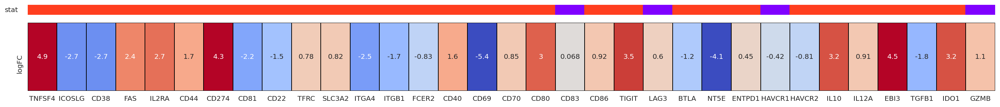

In [168]:
for i in list_edgeR_Bregs_IgD:
    draw_logFC_stat(i, list_gene_marker_Bregs, (25,2))

In [496]:
stimulation_expr_edgeR_Bregs_IgD = pd.concat([x[['logFC']] for x in list_edgeR_Bregs_IgD], axis=1)
stimulation_expr_edgeR_Bregs_IgD.columns = ['Hour_16_of_CpG-B']
stimulation_expr_edgeR_Bregs_IgD.head()

,Hour_16_of_CpG-B
ITGA1,14.429959
FOS,-10.747555
CTB-133G6.1,-7.252216
SLC43A3,5.334072
FOSB,-8.374484


### Сравнение по донорам в TPM

Сортировка по донорам (стимуляция одна)

In [497]:
df = pd.DataFrame(np.zeros((6,5 + len(list_gene_marker_Bregs))))
df.columns = ['donor_id', 'control_sample_id', 'control_stimulation', 'interest_sample_id', 
              'interest_stimulation'] + list_gene_marker_Bregs

i = 0 
for donor_id in cells_GSE151415_Bregs_IgD.Donor_id.unique():
    control_group = 'Without_stimulation'
    interest_group = 'Hour_16_of_CpG-B'
    
    #все сэмплы контрольной группы
    samples_control_group = dict_stimulations_Bregs_IgD[control_group]
    #сэмпл из сэмплов контрольной группы, подходящий иммено для нашего донора
    control_sample = list(cells_GSE151415_Bregs_IgD.loc[(samples_control_group)].loc[cells_GSE151415_Bregs_IgD.Donor_id == donor_id].index)[0]
        
    #все сэмплы интересной группы
    samples_interest_group = dict_stimulations_Bregs_IgD[interest_group]
    #сэмпл из сэмплов интересной группы, подходящий иммено для нашего донора
    interest_sample = list(cells_GSE151415_Bregs_IgD.loc[(samples_interest_group)].loc[cells_GSE151415_Bregs_IgD.Donor_id == donor_id].index)[0]
        
    df.loc[i, 'donor_id'] = donor_id
    df.loc[i, 'control_sample_id'] = control_sample
    df.loc[i, 'control_stimulation'] = control_group
    df.loc[i, 'interest_sample_id'] = interest_sample
    df.loc[i, 'interest_stimulation'] = interest_group
        
    for gene in list_gene_marker_Bregs:
        df.loc[i, gene] = np.log2((expr_TPM_Bregs_IgD.loc[gene,interest_sample] + 1) / (expr_TPM_Bregs_IgD.loc[gene,control_sample] + 1))
    i += 1 #для того, чтобы в следующую строку результат записывался

In [ ]:
plt.figure(figsize=(20,15))

af = axis_matras([.3, .3, 15], x_len=20)
line_palette_annotation_plot(df['donor_id'], ax=next(af), 
                             palette=lin_colors(df['donor_id']))

line_palette_annotation_plot(df['interest_stimulation'], ax=next(af), 
                             palette=lin_colors(df['interest_stimulation']))



sns.heatmap(df.iloc[:, np.arange(5,40)].T, annot = True, vmin=-6, vmax=4, center =0,
            cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=False, cbar=False,
            cbar_kws= {'orientation': 'horizontal'})
plt.show()
patch_plot(lin_colors(df['donor_id']), legend_right=True, vertical=True, h=8, show_ticks=True)
patch_plot(lin_colors(df['interest_stimulation']), legend_right=True, vertical=True, h=20, show_ticks=True)

### Динамика экспрессии в TPM

In [ ]:
index = cells_GSE151415_Bregs_IgD.Donor_id.unique()
columns = cells_GSE151415_Bregs_IgD.Stimulation.unique()

for gene in list_gene_marker_Bregs:
    df = pd.DataFrame(index=index, columns=columns)

    for ind in cells_GSE151415_Bregs_IgD.index:
        df.loc[cells_GSE151415_Bregs_IgD.loc[ind, 'Donor_id'], cells_GSE151415_Bregs_IgD.loc[ind, 'Stimulation']] = expr_TPM_Bregs_IgD.loc[gene, ind]

    ax = df.plot.bar(rot=0)
    ax.set_xlabel('Donors')
    ax.set_ylabel('TPM')
    ax.set_title(gene)
    ax.legend(loc="center right", bbox_to_anchor=(1.6, 0.5))

## Breg-cells (SM: CD19+ CD27+ CD39high(+) IgD-)

In [169]:
sort = ['CD19+ CD27+ CD39high IgD-', 'CD19+ CD27+ CD39+ IgD-']

In [170]:
cells_GSE151415_Bregs = cells_GSE151415[(cells_GSE151415.Cell_type == 'Breg_cells') & (cells_GSE151415.Sorting_markers.isin(sort))]
expr_counts_Bregs = expr_counts[cells_GSE151415_Bregs.index]
expr_TPM_Bregs = expr_TPM[cells_GSE151415_Bregs.index]

In [171]:
# в словарь записывает, какие сэмплы к каким стимуляциям относятся

dict_stimulations_Bregs = {}
for stimul in cells_GSE151415_Bregs.Stimulation.unique():
    dict_stimulations_Bregs[stimul] = cells_GSE151415_Bregs[cells_GSE151415_Bregs.Stimulation == stimul].index

dict_stimulations_Bregs

{'Without_stimulation': Index(['SRX8421710', 'SRX8421712', 'SRX8421722', 'SRX8421724', 'SRX8421734',
        'SRX8421736', 'SRX8421746', 'SRX8421748', 'SRX8421758', 'SRX8421760',
        'SRX8421770'],
       dtype='object', name='Sample'),
 'Hour_16_of_CpG-B': Index(['SRX8421716', 'SRX8421718', 'SRX8421728', 'SRX8421730', 'SRX8421740',
        'SRX8421742', 'SRX8421752', 'SRX8421754', 'SRX8421764', 'SRX8421766',
        'SRX8421774'],
       dtype='object', name='Sample')}

### Проверка сортировочных маркеров

In [ ]:
all_deconv_Bregs = model.predict(expr_TPM[cells_GSE151415_Bregs.index])

In [ ]:
#вывод примера для одного сампла

sample = 'SRX8421710'

fig, ax = plt.subplots(figsize=(90, 30))
plt.ylabel('ylabel', fontsize=80)
sns.barplot(x=all_deconv_Bregs[sample].index, y=all_deconv_Bregs[sample], ax=ax)

for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(50)
    
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(50)
    
plt.xticks(rotation=-90)

In [ ]:
#вывод для всех самплов (хорошая проверка)

for sample in all_deconv_Bregs.columns:
    fig, ax = plt.subplots(figsize=(90, 30))
    plt.ylabel('ylabel', fontsize=80)
    sns.barplot(x=all_deconv_Bregs[sample].index, y=all_deconv_Bregs[sample], ax=ax)
    
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    plt.xticks(rotation=-90)

### Сравнение среднего (edgeR) в каунтах

"-" означает, что было больше изначально

In [172]:
#для всех генов

list_edgeR_Bregs = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group(
                            expr_counts, 
                            dict_stimulations_Bregs[control], 
                            dict_stimulations_Bregs[interest], '')
list_edgeR_Bregs.append(DE)

list_edgeR_Bregs

[             logFC     logCPM         PValue            FDR
 SLC43A3  4.916624   8.304452   6.870670e-257  1.378394e-252
 TRAF1    5.420821   9.616620   1.686411e-199  1.691639e-195
 ITGA1    10.822828  4.778717   5.241621e-179  3.505247e-175
 IL4I1    8.672103   6.843863   3.454748e-165  1.732729e-161
 CCL22    10.678676  11.417040  1.369505e-164  5.495000e-161
 ...            ...        ...            ...            ...
 ZNF385B  0.000000  -3.759526   1.000000e+00   1.000000e+00 
 ZNF804B  0.000000  -3.759526   1.000000e+00   1.000000e+00 
 ZNRF4    0.000000  -3.759526   1.000000e+00   1.000000e+00 
 ZP4      0.000000  -3.759526   1.000000e+00   1.000000e+00 
 ZSWIM2   0.000000  -3.759526   1.000000e+00   1.000000e+00 
 
 [20062 rows x 4 columns]]

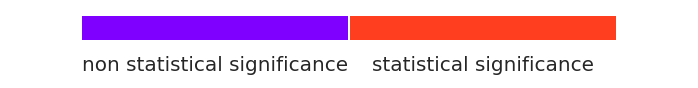

<Figure size 1800x144 with 0 Axes>

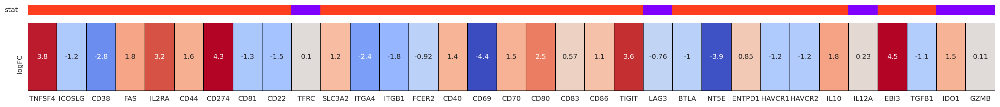

In [173]:
for i in list_edgeR_Bregs:
    draw_logFC_stat(i, list_gene_marker_Bregs, (25,2))

In [506]:
stimulation_expr_edgeR_Bregs = pd.concat([x[['logFC']] for x in list_edgeR_Bregs], axis=1)
stimulation_expr_edgeR_Bregs.columns = ['Hour_16_of_CpG-B']
stimulation_expr_edgeR_Bregs.head()

,Hour_16_of_CpG-B
SLC43A3,4.916624
TRAF1,5.420821
ITGA1,10.822828
IL4I1,8.672103
CCL22,10.678676


### Сравнение по донорам в TPM

Сортировка по донорам (стимуляция одна)

In [507]:
#для попарного сравнение некоторых доноров на 2 группы разделила

cells_GSE151415_Bregs['Comment']['SRX8421710'] = 'donor1A'
cells_GSE151415_Bregs['Comment']['SRX8421716'] = 'donor1A'
cells_GSE151415_Bregs['Comment']['SRX8421712'] = 'donor1B'
cells_GSE151415_Bregs['Comment']['SRX8421718'] = 'donor1B'

cells_GSE151415_Bregs['Comment']['SRX8421722'] = 'donor2A'
cells_GSE151415_Bregs['Comment']['SRX8421728'] = 'donor2A'
cells_GSE151415_Bregs['Comment']['SRX8421724'] = 'donor2B'
cells_GSE151415_Bregs['Comment']['SRX8421730'] = 'donor2B'

cells_GSE151415_Bregs['Comment']['SRX8421734'] = 'donor3A'
cells_GSE151415_Bregs['Comment']['SRX8421740'] = 'donor3A'
cells_GSE151415_Bregs['Comment']['SRX8421736'] = 'donor3B'
cells_GSE151415_Bregs['Comment']['SRX8421742'] = 'donor3B'

cells_GSE151415_Bregs['Comment']['SRX8421746'] = 'donor4A'
cells_GSE151415_Bregs['Comment']['SRX8421752'] = 'donor4A'
cells_GSE151415_Bregs['Comment']['SRX8421748'] = 'donor4B'
cells_GSE151415_Bregs['Comment']['SRX8421754'] = 'donor4B'

cells_GSE151415_Bregs['Comment']['SRX8421758'] = 'donor5A'
cells_GSE151415_Bregs['Comment']['SRX8421764'] = 'donor5A'
cells_GSE151415_Bregs['Comment']['SRX8421760'] = 'donor5B'
cells_GSE151415_Bregs['Comment']['SRX8421766'] = 'donor5B'

cells_GSE151415_Bregs['Comment']['SRX8421770'] = 'donor6'
cells_GSE151415_Bregs['Comment']['SRX8421774'] = 'donor6'

In [508]:
df = pd.DataFrame(np.zeros((9,5 + len(list_gene_marker_Bregs))))
df.columns = ['donor_id', 'control_sample_id', 'control_stimulation', 'interest_sample_id', 
              'interest_stimulation'] + list_gene_marker_Bregs

i = 0 
for donor_id in cells_GSE151415_Bregs.Comment.unique():
    control_group = 'Without_stimulation'
    interest_group = 'Hour_16_of_CpG-B'
    
    #все сэмплы контрольной группы
    samples_control_group = dict_stimulations_Bregs[control_group]
    #сэмпл из сэмплов контрольной группы, подходящий иммено для нашего донора
    control_sample = list(cells_GSE151415_Bregs.loc[(samples_control_group)].loc[cells_GSE151415_Bregs.Comment == donor_id].index)[0]
        
    #все сэмплы интересной группы
    samples_interest_group = dict_stimulations_Bregs[interest_group]
    #сэмпл из сэмплов интересной группы, подходящий иммено для нашего донора
    interest_sample = list(cells_GSE151415_Bregs.loc[(samples_interest_group)].loc[cells_GSE151415_Bregs.Comment == donor_id].index)[0]
    
    df.loc[i, 'donor_id'] = int(list(cells_GSE151415_Bregs.loc[(samples_control_group)].loc[cells_GSE151415_Bregs.Comment == donor_id].Donor_id)[0])
    df.loc[i, 'control_sample_id'] = control_sample
    df.loc[i, 'control_stimulation'] = control_group
    df.loc[i, 'interest_sample_id'] = interest_sample
    df.loc[i, 'interest_stimulation'] = interest_group
        
    for gene in list_gene_marker_Bregs:
        df.loc[i, gene] = np.log2((expr_TPM_Bregs.loc[gene,interest_sample] + 1) / (expr_TPM_Bregs.loc[gene,control_sample] + 1))
    i += 1 #для того, чтобы в следующую строку результат записывался

In [ ]:
plt.figure(figsize=(20,15))

af = axis_matras([.3, .3, 15], x_len=20)
line_palette_annotation_plot(df['donor_id'], ax=next(af), 
                             palette=lin_colors(df['donor_id']))

line_palette_annotation_plot(df['interest_stimulation'], ax=next(af), 
                             palette=lin_colors(df['interest_stimulation']))



sns.heatmap(df.iloc[:, np.arange(5,31)].T, annot = True, vmin=-5, vmax=5, center = 0,
            cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=False, cbar=False,
            cbar_kws= {'orientation': 'horizontal'})
plt.show()
patch_plot(lin_colors(df['donor_id']), legend_right=True, vertical=True, h=8, show_ticks=True)
patch_plot(lin_colors(df['interest_stimulation']), legend_right=True, vertical=True, h=20, show_ticks=True)

### Динамика экспрессии в TPM

In [ ]:
index = cells_GSE151415_Bregs.Comment.unique()
columns = cells_GSE151415_Bregs.Stimulation.unique()

for gene in list_gene_marker_Bregs:
    df = pd.DataFrame(index=index, columns=columns)

    for ind in cells_GSE151415_Bregs.index:
        df.loc[cells_GSE151415_Bregs.loc[ind, 'Comment'], cells_GSE151415_Bregs.loc[ind, 'Stimulation']] = expr_TPM_Bregs.loc[gene, ind]

    ax = df.plot.bar(rot=0)
    ax.set_xlabel('Donors')
    ax.set_ylabel('TPM')
    ax.set_title(gene)
    ax.legend(loc="center right", bbox_to_anchor=(1.3, 0.5))
    fig=ax.figure
    fig.set_figwidth(10)

## B cells (SM: CD19+ CD27- CD39high IgD+)

In [90]:
cells_GSE151415_B_high = cells_GSE151415[(cells_GSE151415.Cell_type == 'B_cells') & (cells_GSE151415.Sorting_markers == 'CD19+ CD27- CD39high IgD+')]
expr_counts_B_high = expr_counts[cells_GSE151415_B_high.index]
expr_TPM_B_high = expr_TPM[cells_GSE151415_B_high.index]

### Проверка сортировочных маркеров

In [39]:
all_deconv_B_high = model.predict(expr_TPM[cells_GSE151415_B_high.index])

Expressions OK


In [41]:
#вывод примера для одного сампла

sample = 'SRX8421709'

fig, ax = plt.subplots(figsize=(90, 30))
plt.ylabel('ylabel', fontsize=80)
sns.barplot(x=all_deconv_B_high[sample].index, y=all_deconv_B_high[sample], ax=ax)

for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(50)
    
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(50)
    
plt.xticks(rotation=-90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40]),
 [Text(0, 0, 'Other'),
  Text(1, 0, 'Basophils'),
  Text(2, 0, 'CD27neg_Memory_B_cells'),
  Text(3, 0, 'CD57neg_Cytotoxic_NK_cells'),
  Text(4, 0, 'CD57pos_Cytotoxic_NK_cells'),
  Text(5, 0, 'CDC'),
  Text(6, 0, 'Central_memory_CD8_T_cells'),
  Text(7, 0, 'Central_memory_T_helpers'),
  Text(8, 0, 'Class_switched_memory_B_cells'),
  Text(9, 0, 'Classical_monocytes'),
  Text(10, 0, 'Effector_memory_CD8_T_cells'),
  Text(11, 0, 'Effector_memory_T_helpers'),
  Text(12, 0, 'Eosinophils'),
  Text(13, 0, 'Naive_B_cells'),
  Text(14, 0, 'Naive_CD8_T_cells'),
  Text(15, 0, 'Naive_T_helpers'),
  Text(16, 0, 'Neutrophils'),
  Text(17, 0, 'Non_classical_monocytes'),
  Text(18, 0, 'Non_switched_memory_B_cells'),
  Text(19, 0, 'PDC'),
  Text(20, 0, 'Plasma_B_cells'),
  Text(21, 0, 'Plasmablasts'),
  Text(22, 0, '

In [ ]:
#вывод для всех самплов (хорошая проверка)

for sample in all_deconv_B_high.columns:
    fig, ax = plt.subplots(figsize=(90, 30))
    plt.ylabel('ylabel', fontsize=80)
    sns.barplot(x=all_deconv_B_high[sample].index, y=all_deconv_B_high[sample], ax=ax)
    
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    plt.xticks(rotation=-90)

In [92]:
# в словарь записывает, какие сэмплы к каким стимуляциям относятся

dict_stimulations_B_high = {}
for stimul in cells_GSE151415_B_high.Stimulation.unique():
    dict_stimulations_B_high[stimul] = cells_GSE151415_B_high[cells_GSE151415_B_high.Stimulation == stimul].index

dict_stimulations_B_high

{'Without_stimulation': Index(['SRX8421709', 'SRX8421721', 'SRX8421745', 'SRX8421757', 'SRX8421769'], dtype='object', name='Sample'),
 'Hour_16_of_CpG-B': Index(['SRX8421715', 'SRX8421727', 'SRX8421739', 'SRX8421751', 'SRX8421763',
        'SRX8421773'],
       dtype='object', name='Sample')}

### Сравнение среднего (edgeR) в каунтах

"-" означает, что было больше изначально

In [93]:
#для всех генов

list_edgeR_B_high = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group(
                            expr_counts, 
                            dict_stimulations_B_high[control], 
                            dict_stimulations_B_high[interest], '')
list_edgeR_B_high.append(DE)

list_edgeR_B_high

[             logFC     logCPM         PValue            FDR
 DUSP1   -7.667500   10.813000  3.240186e-174  6.500461e-170
 TRAF1    5.983830   9.582687   4.464460e-143  4.478300e-139
 LGALS3   7.399129   6.492070   3.202075e-125  2.141335e-121
 FOS     -10.631670  10.890756  1.676847e-123  8.410225e-120
 EMILIN2  5.250897   7.432536   3.543549e-123  1.421813e-119
 ...           ...        ...             ...            ...
 ZNF705B  0.000000  -3.704347   1.000000e+00   1.000000e+00 
 ZNF804B  0.000000  -3.704347   1.000000e+00   1.000000e+00 
 ZNRF4    0.000000  -3.704347   1.000000e+00   1.000000e+00 
 ZP4      0.000000  -3.704347   1.000000e+00   1.000000e+00 
 ZSWIM2   0.000000  -3.704347   1.000000e+00   1.000000e+00 
 
 [20062 rows x 4 columns]]

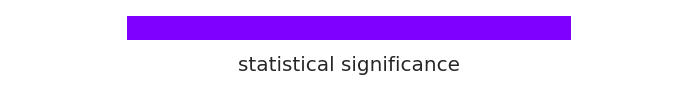

<Figure size 1800x144 with 0 Axes>

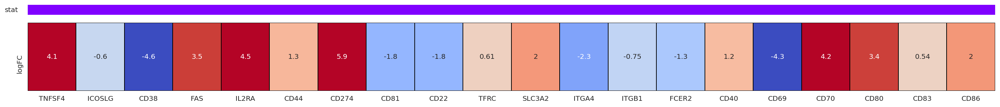

In [94]:
for i in list_edgeR_B_high:
    draw_logFC_stat(i, list_gene_marker_B_cells, (25,2))

In [95]:
stimulation_expr_edgeR_B_high = pd.concat([x[['logFC']] for x in list_edgeR_B_high], axis=1)
stimulation_expr_edgeR_B_high.columns = ['Hour_16_of_CpG-B']
stimulation_expr_edgeR_B_high.head()

,Hour_16_of_CpG-B
DUSP1,-7.667500
TRAF1,5.983830
LGALS3,7.399129
FOS,-10.631670
EMILIN2,5.250897


In [96]:
al = pd.concat([x[['logFC']] for x in list_edgeR_B_high], axis=1)
al.columns = ['B cells (SM: CD19+ CD27- CD39high IgD+)']
al = al.loc[al.index.isin(list_gene_marker_B_cells)]
new = new.join(al)
new

,Transitional,B cells (SM: CD19+ CD27- CD39high IgD+)
CD274,7.913625,5.883313
IL2RA,5.191661,4.534604
CD38,-3.603135,-4.644305
TNFSF4,4.354778,4.108479
ITGA4,-2.141391,-2.298318
FAS,4.554230,3.484616
CD44,1.852083,1.348087
CD70,4.352577,4.176719
CD80,4.099278,3.447650
CD69,-3.991322,-4.269851


### Сравнение по донорам в TPM

Сортировка по донорам (стимуляция одна)

In [187]:
df = pd.DataFrame(np.zeros((3,5 + len(list_gene_marker_B_cells))))
df.columns = ['donor_id', 'control_sample_id', 'control_stimulation', 'interest_sample_id', 
              'interest_stimulation'] + list_gene_marker_B_cells

i = 0 
for donor_id in [1, 2, 4, 5, 6]:
    control_group = 'Without_stimulation'
    interest_group = 'Hour_16_of_CpG-B'
    
    #все сэмплы контрольной группы
    samples_control_group = dict_stimulations_B_high[control_group]
    #сэмпл из сэмплов контрольной группы, подходящий иммено для нашего донора
    control_sample = list(cells_GSE151415_B_high.loc[(samples_control_group)].loc[cells_GSE151415_B_high.Donor_id == donor_id].index)[0]
        
    #все сэмплы интересной группы
    samples_interest_group = dict_stimulations_B_high[interest_group]
    #сэмпл из сэмплов интересной группы, подходящий иммено для нашего донора
    interest_sample = list(cells_GSE151415_B_high.loc[(samples_interest_group)].loc[cells_GSE151415_B_high.Donor_id == donor_id].index)[0]
        
    df.loc[i, 'donor_id'] = donor_id
    df.loc[i, 'control_sample_id'] = control_sample
    df.loc[i, 'control_stimulation'] = control_group
    df.loc[i, 'interest_sample_id'] = interest_sample
    df.loc[i, 'interest_stimulation'] = interest_group
        
    for gene in list_gene_marker_B_cells:
        df.loc[i, gene] = np.log2((expr_TPM_B_high.loc[gene,interest_sample] + 1) / (expr_TPM_B_high.loc[gene,control_sample] + 1))
    i += 1 #для того, чтобы в следующую строку результат записывался

In [188]:
df

,donor_id,control_sample_id,control_stimulation,interest_sample_id,interest_stimulation,TNFSF4,ICOSLG,CD38,FAS,IL2RA,CD44,CD274,CD81,CD22,TFRC,SLC3A2,ITGA4,ITGB1,FCER2,CD40,CD69,CD70,CD80,CD83,CD86
0,1.0,SRX8421709,Without_stimulation,SRX8421715,Hour_16_of_CpG-B,3.504236,-1.241227,-2.612443,2.365908,4.169599,0.875682,4.487576,-2.264857,-1.773513,-0.199403,1.999240,-2.098314,-0.363585,-1.136781,1.316853,-5.239526,3.371972,2.728625,-0.172851,1.384908
1,2.0,SRX8421721,Without_stimulation,SRX8421727,Hour_16_of_CpG-B,3.602442,-0.719689,-2.043307,2.691587,3.579087,1.153722,4.349547,-1.548579,-1.997966,0.790547,1.635071,-2.320108,-1.721445,-1.814182,1.715263,-3.680626,3.045038,2.390752,0.839881,2.879418
2,4.0,SRX8421745,Without_stimulation,SRX8421751,Hour_16_of_CpG-B,2.720954,-0.921366,-3.364500,3.081417,4.385526,1.141864,5.283606,-2.698413,-2.416662,0.587707,2.986838,-2.925394,-0.171826,-1.574064,0.811716,-3.795945,5.804179,3.540430,1.774668,1.519994
3,5.0,SRX8421757,Without_stimulation,SRX8421763,Hour_16_of_CpG-B,3.016498,-0.815465,-3.327932,2.987114,3.810435,1.335920,4.869338,-1.761113,-1.777846,0.528329,0.502328,-2.691012,-0.595313,-0.744746,0.983973,-5.006485,3.374367,3.753596,0.115068,1.629631
4,6.0,SRX8421769,Without_stimulation,SRX8421773,Hour_16_of_CpG-B,3.668974,-0.543600,-2.984370,4.393786,3.883515,1.194081,5.098114,-2.430748,-2.265606,1.117728,2.339889,-2.259182,-0.165161,-1.675196,1.283258,-3.468431,4.165740,3.711440,1.209718,1.640390


<Figure size 1440x1080 with 0 Axes>

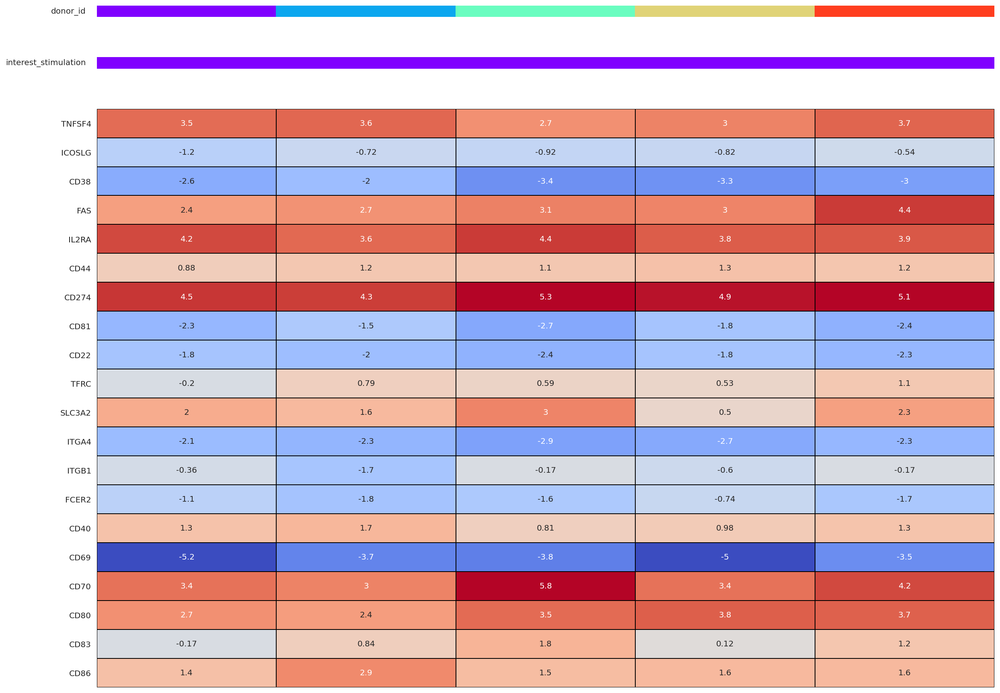

<AxesSubplot:>

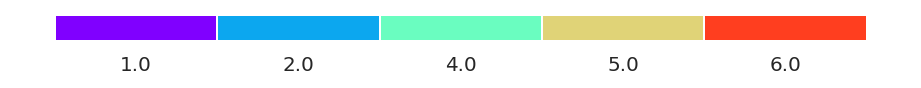

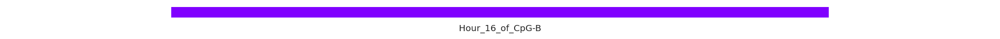

In [189]:
plt.figure(figsize=(20,15))

af = axis_matras([.3, .3, 15], x_len=20)
line_palette_annotation_plot(df['donor_id'], ax=next(af), 
                             palette=lin_colors(df['donor_id']))

line_palette_annotation_plot(df['interest_stimulation'], ax=next(af), 
                             palette=lin_colors(df['interest_stimulation']))



sns.heatmap(df.iloc[:, np.arange(5,25)].T, annot = True, vmin=-5, vmax=5, center =0,
            cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=False, cbar=False,
            cbar_kws= {'orientation': 'horizontal'})
plt.show()
patch_plot(lin_colors(df['donor_id']), legend_right=True, vertical=True, h=8, show_ticks=True)
patch_plot(lin_colors(df['interest_stimulation']), legend_right=True, vertical=True, h=20, show_ticks=True)

### Динамика экспрессии в TPM

In [ ]:
index = cells_GSE151415_B_high.Donor_id.unique()
columns = cells_GSE151415_B_high.Stimulation.unique()

for gene in list_gene_marker_B_cells:
    df = pd.DataFrame(index=index, columns=columns)

    for ind in cells_GSE151415_B_high.index:
        df.loc[cells_GSE151415_B_high.loc[ind, 'Donor_id'], cells_GSE151415_B_high.loc[ind, 'Stimulation']] = expr_TPM_B_high.loc[gene, ind]

    ax = df.plot.bar(rot=0)
    ax.set_xlabel('Donors')
    ax.set_ylabel('TPM')
    ax.set_title(gene)
    ax.legend(loc="center right", bbox_to_anchor=(1.6, 0.5))

## B cells (SM: CD19+ CD27- CD39low IgD+)

In [97]:
cells_GSE151415_B_low = cells_GSE151415[(cells_GSE151415.Cell_type == 'B_cells') & (cells_GSE151415.Sorting_markers == 'CD19+ CD27- CD39low IgD+')]
expr_counts_B_low = expr_counts[cells_GSE151415_B_low.index]
expr_TPM_B_low = expr_TPM[cells_GSE151415_B_low.index]

### Проверка сортировочных маркеров

In [115]:
all_deconv_B_low = model.predict(expr_TPM[cells_GSE151415_B_low.index])

Expressions OK


In [117]:
#вывод примера для одного сампла

sample = 'SRX8421711'

fig, ax = plt.subplots(figsize=(90, 30))
plt.ylabel('ylabel', fontsize=80)
sns.barplot(x=all_deconv_B_low[sample].index, y=all_deconv_B_low[sample], ax=ax)

for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(50)
    
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(50)
    
plt.xticks(rotation=-90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40]),
 [Text(0, 0, 'Other'),
  Text(1, 0, 'Basophils'),
  Text(2, 0, 'CD27neg_Memory_B_cells'),
  Text(3, 0, 'CD57neg_Cytotoxic_NK_cells'),
  Text(4, 0, 'CD57pos_Cytotoxic_NK_cells'),
  Text(5, 0, 'CDC'),
  Text(6, 0, 'Central_memory_CD8_T_cells'),
  Text(7, 0, 'Central_memory_T_helpers'),
  Text(8, 0, 'Class_switched_memory_B_cells'),
  Text(9, 0, 'Classical_monocytes'),
  Text(10, 0, 'Effector_memory_CD8_T_cells'),
  Text(11, 0, 'Effector_memory_T_helpers'),
  Text(12, 0, 'Eosinophils'),
  Text(13, 0, 'Naive_B_cells'),
  Text(14, 0, 'Naive_CD8_T_cells'),
  Text(15, 0, 'Naive_T_helpers'),
  Text(16, 0, 'Neutrophils'),
  Text(17, 0, 'Non_classical_monocytes'),
  Text(18, 0, 'Non_switched_memory_B_cells'),
  Text(19, 0, 'PDC'),
  Text(20, 0, 'Plasma_B_cells'),
  Text(21, 0, 'Plasmablasts'),
  Text(22, 0, '

In [ ]:
#вывод для всех самплов (хорошая проверка)

for sample in all_deconv_B_low.columns:
    fig, ax = plt.subplots(figsize=(90, 30))
    plt.ylabel('ylabel', fontsize=80)
    sns.barplot(x=all_deconv_B_low[sample].index, y=all_deconv_B_low[sample], ax=ax)
    
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(60)
    
    plt.xticks(rotation=-90)

In [98]:
# в словарь записывает, какие сэмплы к каким стимуляциям относятся

dict_stimulations_B_low = {}
for stimul in cells_GSE151415_B_low.Stimulation.unique():
    dict_stimulations_B_low[stimul] = cells_GSE151415_B_low[cells_GSE151415_B_low.Stimulation == stimul].index

dict_stimulations_B_low

{'Without_stimulation': Index(['SRX8421711', 'SRX8421723', 'SRX8421735', 'SRX8421747', 'SRX8421759'], dtype='object', name='Sample'),
 'Hour_16_of_CpG-B': Index(['SRX8421717', 'SRX8421729', 'SRX8421741', 'SRX8421753', 'SRX8421765'], dtype='object', name='Sample')}

### Сравнение среднего (edgeR) в каунтах

"-" означает, что было больше изначально

In [99]:
#для всех генов

list_edgeR_B_low = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group(
                            expr_counts, 
                            dict_stimulations_B_low[control], 
                            dict_stimulations_B_low[interest], '')
list_edgeR_B_low.append(DE)

list_edgeR_B_low

[                logFC     logCPM         PValue            FDR
 TRAF1        6.199233  9.534370   2.087271e-175  4.187484e-171
 TRIP10       5.663173  7.754318   1.118779e-154  1.122247e-150
 CTB-133G6.1 -6.922499  6.837848   1.184738e-152  7.922736e-149
 SLC43A3      5.195344  8.555686   3.152565e-141  1.581169e-137
 DUSP1       -7.683596  10.913729  1.411236e-128  5.662441e-125
 ...               ...        ...            ...            ...
 ZNF697       0.000000 -3.602649   1.000000e+00   1.000000e+00 
 ZNF804B      0.000000 -3.602649   1.000000e+00   1.000000e+00 
 ZNRF4        0.000000 -3.602649   1.000000e+00   1.000000e+00 
 ZP4          0.000000 -3.602649   1.000000e+00   1.000000e+00 
 ZSWIM2       0.000000 -3.602649   1.000000e+00   1.000000e+00 
 
 [20062 rows x 4 columns]]

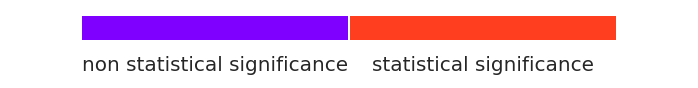

<Figure size 1800x144 with 0 Axes>

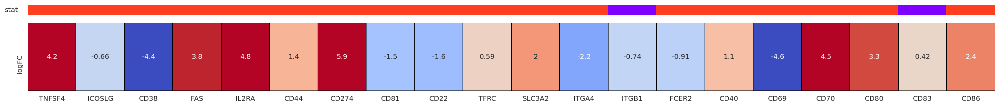

In [100]:
for i in list_edgeR_B_low:
    draw_logFC_stat(i, list_gene_marker_B_cells, (25,2))

In [101]:
stimulation_expr_edgeR_B_low = pd.concat([x[['logFC']] for x in list_edgeR_B_low], axis=1)
stimulation_expr_edgeR_B_low.columns = ['Hour_16_of_CpG-B']
stimulation_expr_edgeR_B_low.head()

,Hour_16_of_CpG-B
TRAF1,6.199233
TRIP10,5.663173
CTB-133G6.1,-6.922499
SLC43A3,5.195344
DUSP1,-7.683596


In [102]:
al = pd.concat([x[['logFC']] for x in list_edgeR_B_low], axis=1)
al.columns = ['B cells (SM: CD19+ CD27- CD39low IgD+)']
al = al.loc[al.index.isin(list_gene_marker_B_cells)]
new = new.join(al)
new

,Transitional,B cells (SM: CD19+ CD27- CD39high IgD+),B cells (SM: CD19+ CD27- CD39low IgD+)
CD274,7.913625,5.883313,5.948418
IL2RA,5.191661,4.534604,4.827784
CD38,-3.603135,-4.644305,-4.416784
TNFSF4,4.354778,4.108479,4.239558
ITGA4,-2.141391,-2.298318,-2.220524
FAS,4.554230,3.484616,3.779309
CD44,1.852083,1.348087,1.413899
CD70,4.352577,4.176719,4.471737
CD80,4.099278,3.447650,3.314033
CD69,-3.991322,-4.269851,-4.606887


<AxesSubplot:>

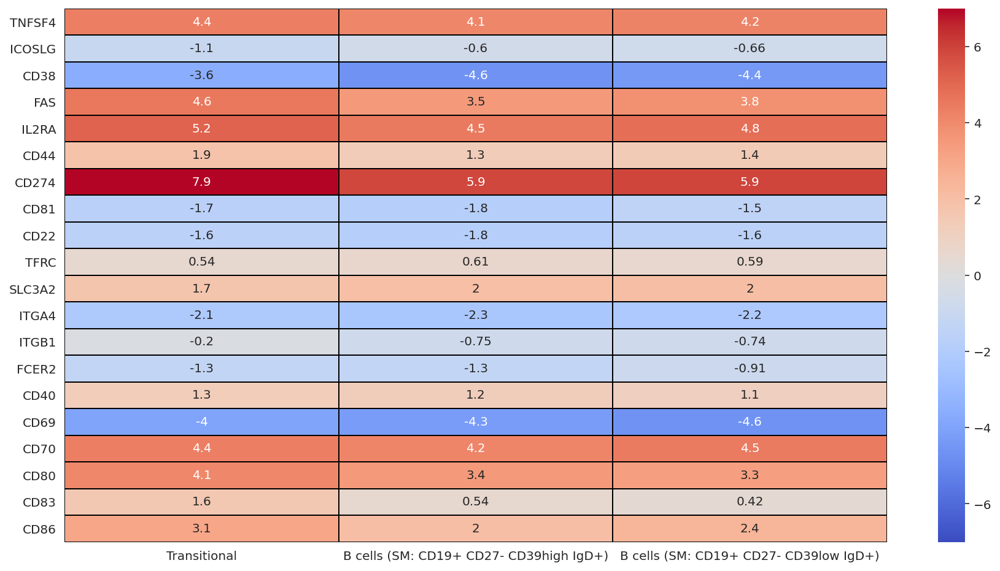

In [104]:
plt.figure(figsize=(15,8))
sns.heatmap(new.loc[list_gene_marker_B_cells, :], annot = True, vmin=-7, vmax=7, center =0,
                cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=True, cbar=True)

### Сравнение по донорам в TPM

Сортировка по донорам (стимуляция одна)

In [194]:
df = pd.DataFrame(np.zeros((3,5 + len(list_gene_marker_B_cells))))
df.columns = ['donor_id', 'control_sample_id', 'control_stimulation', 'interest_sample_id', 
              'interest_stimulation'] + list_gene_marker_B_cells

i = 0 
for donor_id in [1, 2, 3, 4, 5]:
    control_group = 'Without_stimulation'
    interest_group = 'Hour_16_of_CpG-B'
    
    #все сэмплы контрольной группы
    samples_control_group = dict_stimulations_B_low[control_group]
    #сэмпл из сэмплов контрольной группы, подходящий иммено для нашего донора
    control_sample = list(cells_GSE151415_B_low.loc[(samples_control_group)].loc[cells_GSE151415_B_low.Donor_id == donor_id].index)[0]
        
    #все сэмплы интересной группы
    samples_interest_group = dict_stimulations_B_low[interest_group]
    #сэмпл из сэмплов интересной группы, подходящий иммено для нашего донора
    interest_sample = list(cells_GSE151415_B_low.loc[(samples_interest_group)].loc[cells_GSE151415_B_low.Donor_id == donor_id].index)[0]
        
    df.loc[i, 'donor_id'] = donor_id
    df.loc[i, 'control_sample_id'] = control_sample
    df.loc[i, 'control_stimulation'] = control_group
    df.loc[i, 'interest_sample_id'] = interest_sample
    df.loc[i, 'interest_stimulation'] = interest_group
        
    for gene in list_gene_marker_B_cells:
        df.loc[i, gene] = np.log2((expr_TPM_B_low.loc[gene,interest_sample] + 1) / (expr_TPM_B_low.loc[gene,control_sample] + 1))
    i += 1 #для того, чтобы в следующую строку результат записывался

In [195]:
df

,donor_id,control_sample_id,control_stimulation,interest_sample_id,interest_stimulation,TNFSF4,ICOSLG,CD38,FAS,IL2RA,CD44,CD274,CD81,CD22,TFRC,SLC3A2,ITGA4,ITGB1,FCER2,CD40,CD69,CD70,CD80,CD83,CD86
0,1.0,SRX8421711,Without_stimulation,SRX8421717,Hour_16_of_CpG-B,3.804577,-0.929239,-3.386155,3.789573,5.465225,1.624923,4.601062,-1.731921,-1.452229,0.239539,2.252305,-2.503186,-0.390262,-0.756306,1.351867,-5.492875,3.061526,2.961894,-0.531237,1.260070
1,2.0,SRX8421723,Without_stimulation,SRX8421729,Hour_16_of_CpG-B,2.837944,-1.106853,-1.814519,2.287712,2.947181,1.023777,3.622667,-1.540865,-1.307546,0.270654,0.828862,-2.079401,-1.300499,0.177325,1.347079,-4.660403,2.656098,2.565111,-0.129409,1.789621
2,3.0,SRX8421735,Without_stimulation,SRX8421741,Hour_16_of_CpG-B,3.136535,-0.829825,-3.306972,3.480989,4.811282,0.883001,5.400479,-1.873756,-1.898147,0.567245,2.305637,-2.324584,-0.837748,-1.348337,0.930638,-3.840615,5.027535,3.356032,0.822920,2.700379
3,4.0,SRX8421747,Without_stimulation,SRX8421753,Hour_16_of_CpG-B,3.127433,-0.560441,-2.892230,3.342547,5.226430,1.498145,5.981858,-1.851876,-2.091956,1.061601,3.318461,-2.109437,0.255730,-1.891753,0.955793,-3.985199,6.245530,2.591918,2.280435,2.214665
4,5.0,SRX8421759,Without_stimulation,SRX8421765,Hour_16_of_CpG-B,3.132529,-0.903659,-3.668047,2.878336,4.436504,1.217366,5.666082,-1.276356,-1.896930,0.395853,0.911088,-2.799189,-0.877330,-0.969693,1.092201,-4.869868,3.783443,3.005490,0.402770,2.336275


<Figure size 1440x1080 with 0 Axes>

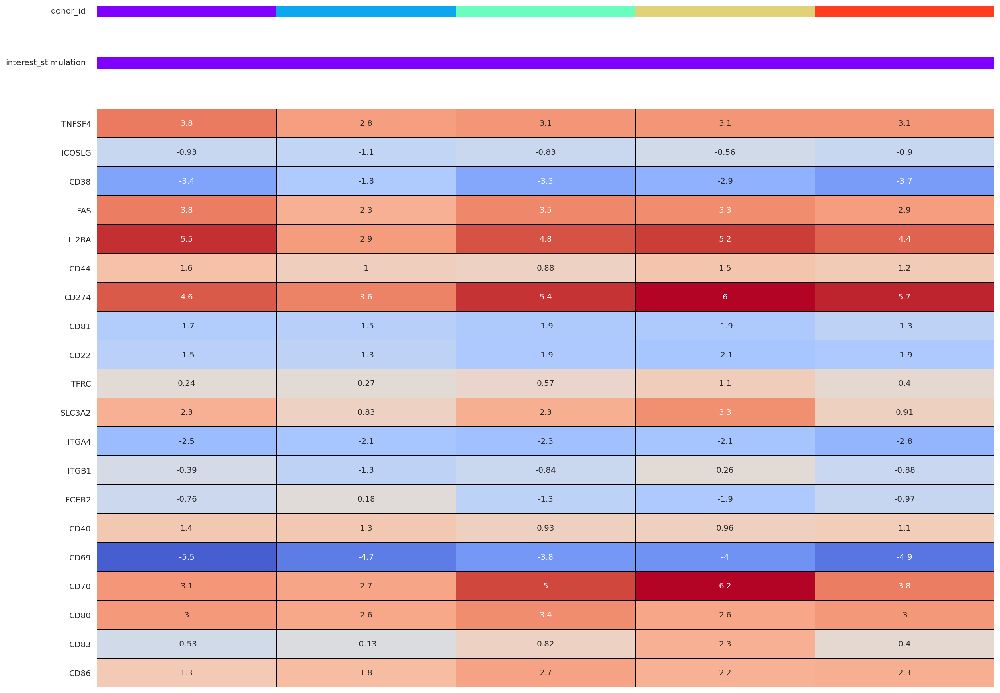

<AxesSubplot:>

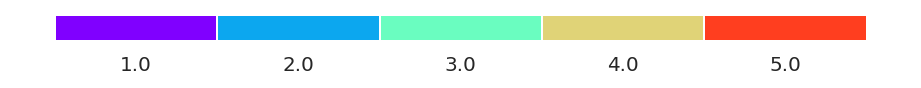

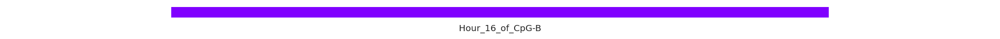

In [196]:
plt.figure(figsize=(20,15))

af = axis_matras([.3, .3, 15], x_len=20)
line_palette_annotation_plot(df['donor_id'], ax=next(af), 
                             palette=lin_colors(df['donor_id']))

line_palette_annotation_plot(df['interest_stimulation'], ax=next(af), 
                             palette=lin_colors(df['interest_stimulation']))



sns.heatmap(df.iloc[:, np.arange(5,25)].T, annot = True, vmin=-6, vmax=6, center =0,
            cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=False, cbar=False,
            cbar_kws= {'orientation': 'horizontal'})
plt.show()
patch_plot(lin_colors(df['donor_id']), legend_right=True, vertical=True, h=8, show_ticks=True)
patch_plot(lin_colors(df['interest_stimulation']), legend_right=True, vertical=True, h=20, show_ticks=True)

### Динамика экспрессии в TPM

In [ ]:
index = cells_GSE151415_B_low.Donor_id.unique()
columns = cells_GSE151415_B_low.Stimulation.unique()

for gene in list_gene_marker_B_cells:
    df = pd.DataFrame(index=index, columns=columns)

    for ind in cells_GSE151415_B_low.index:
        df.loc[cells_GSE151415_B_low.loc[ind, 'Donor_id'], cells_GSE151415_B_low.loc[ind, 'Stimulation']] = expr_TPM_B_low.loc[gene, ind]

    ax = df.plot.bar(rot=0)
    ax.set_xlabel('Donors')
    ax.set_ylabel('TPM')
    ax.set_title(gene)
    ax.legend(loc="center right", bbox_to_anchor=(1.6, 0.5))

# Search in datasets by expression

## GSE156195

### Download

In [21]:
cells = get_gspread('Annotation calculated', 'Cells_to_check')

In [22]:
cells_GSE156195 = cells[cells.Dataset == 'GSE156195']
cells_GSE156195

,Run,Dataset,Cell_type,Cell_type_details,Extended_details,Stimulation,Therapy,Modification,Diagnosis,GSM,Sorting_markers,Comment,Cell_origin,Rna_extraction_kit,Library_preparation_kit,Cells_isolation_kit,Donor_id,Gender,Age,Age_range,PMID,Material_type,Layout,Readcounts,To_check,QC_bad,QC_good,QC_score,Who_checks,Decision,Expression_comment,Run_id,Sample_id,Run_tiledb_id,Sample_tiledb_id,Spike_in,Response,Material_sampling_time,Only for target (CR type),Prior_surgery,Diagnosis_comment,Stage,Combo_class,Measurement_method,Race/Ethnicity,UMI (Only for target),Deconvolution_cell_type,Filter_tag,Severity,
Sample,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
SRX8943716,SRR12449220,GSE156195,B_cells,,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4726507,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorA,No_data,Adult,,33027651,polyA RNA,SINGLE,17322012,,,,7,,,,116554,93101,108957,85148,,,,,,,,,,,,B_cells,,,
SRX8943717,SRR12449221,GSE156195,B_cells,,,Hour_72_of_IFN-lambda,Without_therapy,Without_modification,Healthy,GSM4726508,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorA,No_data,Adult,,33027651,polyA RNA,SINGLE,13238652,,,,7,,,,116566,93113,108968,85161,,,,,,,,,,,,B_cells,,,
SRX8943718,SRR12449222,GSE156195,B_cells,,,Hour_72_of_anti-IgM,Without_therapy,Without_modification,Healthy,GSM4726509,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorA,No_data,Adult,,33027651,polyA RNA,SINGLE,12152161,,,,7,,,,116584,93131,108987,85179,,,,,,,,,,,,B_cells,,,
SRX8943719,SRR12449223,GSE156195,B_cells,,,Hour_72_of_anti-IgM_and_IFN-lambda,Without_therapy,Without_modification,Healthy,GSM4726510,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorA,No_data,Adult,,33027651,polyA RNA,SINGLE,18086665,,,,7,,,,116571,93118,108974,85167,,,,,,,,,,,,B_cells,,,
SRX8943720,SRR12449224,GSE156195,B_cells,,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4726511,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorB,No_data,Adult,,33027651,polyA RNA,SINGLE,18891873,,,,7,,,,116568,93115,108970,85163,,,,,,,,,,,,B_cells,,,
SRX8943721,SRR12449225,GSE156195,B_cells,,,Hour_72_of_IFN-lambda,Without_therapy,Without_modification,Healthy,GSM4726512,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorB,No_data,Adult,,33027651,polyA RNA,SINGLE,19460582,,,,7,,,,116570,93117,108973,85165,,,,,,,,,,,,B_cells,,,
SRX8943722,SRR12449226,GSE156195,B_cells,,,Hour_72_of_anti-IgM,Without_therapy,Without_modification,Healthy,GSM4726513,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorB,No_data,Adult,,33027651,polyA RNA,SINGLE,15948875,,,,7,,,,116560,93107,108963,85155,,,,,,,,,,,,B_cells,,,
SRX8943723,SRR12449227,GSE156195,B_cells,,,Hour_72_of_anti-IgM_and_IFN-lambda,Without_therapy,Without_modification,Healthy,GSM4726514,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorB,No_data,Adult,,33027651,polyA RNA,SINGLE,17920749,,,,7,,,,116564,93110,108967,85159,,,,,,,,,,,,B_cells,,,
SRX8943724,SRR12449228,GSE156195,B_cells,,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4726515,CD19+,,PBMC,RNeasy micro kit (Qiagen),TruSeq Stranded mRNA (Illumina),EasySep™ Human B Cell Isolation Kit (StemCell),donorC,No_data,Adult,,33027651,polyA RNA,SINGLE,27509550,,,,7,,,,116590,93137,108992,85185,,,,,,,,,,,,B_cells,,,


In [23]:
cells_GSE156195 = cells_GSE156195[(cells_GSE156195.Readcounts > 5000000)
                                & (cells_GSE156195.QC_score > 4)]

In [24]:
# в словарь записывает, какие сэмплы к каким стимуляциям относятся

dict_stimulations_GSE156195 = {}
for stimul in cells_GSE156195.Stimulation.unique():
    dict_stimulations_GSE156195[stimul] = cells_GSE156195[cells_GSE156195.Stimulation == stimul].index

dict_stimulations_GSE156195

{'Without_stimulation': Index(['SRX8943716', 'SRX8943720', 'SRX8943724', 'SRX8943728', 'SRX8943732'], dtype='object', name='Sample'),
 'Hour_72_of_IFN-lambda': Index(['SRX8943717', 'SRX8943721', 'SRX8943725', 'SRX8943729'], dtype='object', name='Sample'),
 'Hour_72_of_anti-IgM': Index(['SRX8943718', 'SRX8943722', 'SRX8943726', 'SRX8943730', 'SRX8943733',
        'SRX8943735'],
       dtype='object', name='Sample'),
 'Hour_72_of_anti-IgM_and_IFN-lambda': Index(['SRX8943719', 'SRX8943723', 'SRX8943727', 'SRX8943731', 'SRX8943734',
        'SRX8943736'],
       dtype='object', name='Sample')}

In [25]:
expr_counts_GSE156195 = read_expressions(cells_GSE156195, suf='-kallisto-Xena-gene-est_counts_without_noncoding.tsv')

In [26]:
expr_TPM_GSE156195 = read_expressions(cells_GSE156195, suf='-kallisto-Xena-gene-TPM_without_noncoding.tsv')
expr_TPM_GSE156195 = read_renorm_expressions(expr_TPM_GSE156195)

In [27]:
#cells_GSE156195, expr_counts = compare_df_annotation_with_df_expression(cells_GSE156195, expr_counts)
#cells_GSE156195, expr_TPM = compare_df_annotation_with_df_expression(cells_GSE156195, expr_TPM)

#cells_GSE156195 = cells_GSE156195.sort_values(by=['Donor_id'])

In [28]:
list_Stimulation_no_control_GSE156195 = ['Hour_72_of_anti-IgM_and_IFN-lambda', 
                    'Hour_72_of_anti-IgM', 
                    'Hour_72_of_IFN-lambda']

In [29]:
# интересующих список маркеров
list_gene_marker = ['TNFSF4', 
                    #'ICOSLG', 
                   # 'CD38', 
                    'FAS', 
                    'IL2RA', 
                    'CD44', 
                    'CD274', 
                   # 'CD81', 
                    'CD22', 
                    'TFRC', 
                    'SLC3A2',  
                    'ITGA4', 
                    'ITGB1', 
                    'FCER2', 
                    'CD40', 
                    'CD69', 
                    'CD70', 
                    'CD80', 
                    'CD83', 
                    'CD86']

### Референс

In [30]:
#для всех генов

list_edgeR_GSE156195 = []
control = 'Without_stimulation'
for interest in list_Stimulation_no_control_GSE156195:
    DE = calculate_diff_expr_between_two_group(
                                expr_counts_GSE156195, 
                                dict_stimulations_GSE156195[control], 
                                dict_stimulations_GSE156195[interest], '')
    list_edgeR_GSE156195.append(DE)

list_edgeR_GSE156195

[                 logFC    logCPM         PValue            FDR
 LAG3         12.453958  4.431686  1.999472e-72   2.507088e-69 
 IFI27        10.112325  5.650830  2.671486e-135  1.786512e-131
 CENPA        9.254523   1.265052  2.951462e-22   1.562328e-20 
 DLGAP5       9.130723   3.069134  5.235337e-52   1.641115e-49 
 FAM72D       8.933689   0.957159  6.191090e-23   3.444677e-21 
 ...               ...        ...           ...            ... 
 HEY1        -7.953302   2.521788  3.172736e-39   5.011923e-37 
 HES1        -8.099708   6.791471  1.939260e-92   6.484238e-89 
 CH507-9B2.4 -8.246632   0.049288  3.423092e-05   2.321638e-04 
 MAATS1      -8.253673   1.215101  1.850390e-21   9.166058e-20 
 TTLL10      -9.373553   1.191107  3.852260e-36   5.152270e-34 
 
 [20062 rows x 4 columns],
                logFC    logCPM        PValue           FDR
 CENPA       8.583238  0.581941  7.841218e-18  3.974740e-16
 FAM72D      8.186611  0.200321  1.411162e-09  2.341665e-08
 MYO7B       8.098164  

In [31]:
# не будем смотреть на гены с маленьким TPM
expr_TPM_list_gene_marker_GSE156195 = expr_TPM_GSE156195.loc[expr_TPM_GSE156195.index.isin(list_gene_marker)]
expr_TPM_list_gene_marker_GSE156195.shape[0]

17

In [32]:
with_GSE156195 = cells_GSE156195.loc[cells_GSE156195.Stimulation != 'Without_stimulation']

In [33]:
expr_TPM_list_gene_marker_GSE156195 = expr_TPM_list_gene_marker_GSE156195[with_GSE156195.index]
expr_TPM_list_gene_marker_GSE156195 = expr_TPM_list_gene_marker_GSE156195[(expr_TPM_list_gene_marker_GSE156195 >= 10).all(axis=1)]
expr_TPM_list_gene_marker_GSE156195.shape[0]

12

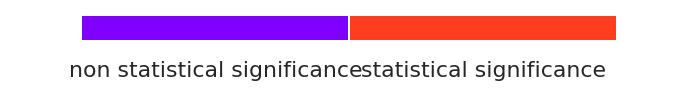

<Figure size 1800x144 with 0 Axes>

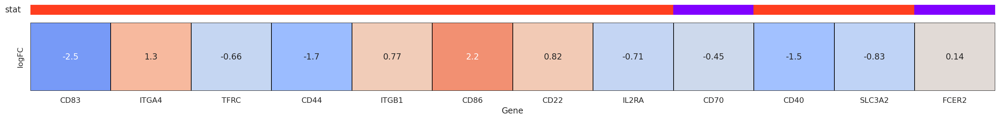

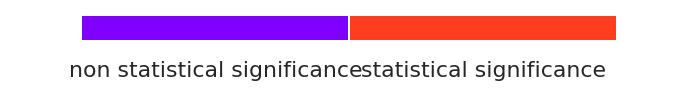

<Figure size 1800x144 with 0 Axes>

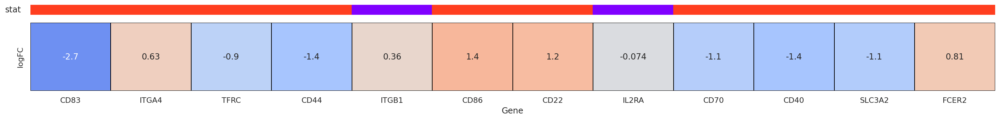

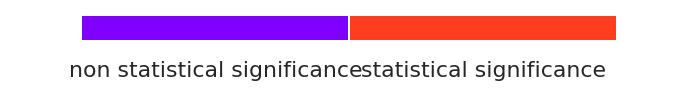

<Figure size 1800x144 with 0 Axes>

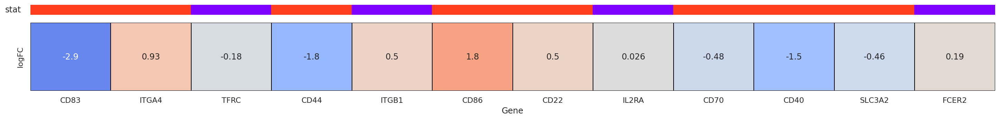

In [34]:
for i in list_edgeR_GSE156195:
    draw_logFC_stat(i, expr_TPM_list_gene_marker_GSE156195.index, (25,2))

In [35]:
stimulation_expr_edgeR_GSE156195 = pd.concat([x[['logFC']] for x in list_edgeR_GSE156195], axis=1)
stimulation_expr_edgeR_GSE156195.columns = list_Stimulation_no_control_GSE156195
stimulation_expr_edgeR_GSE156195.head()

,Hour_72_of_anti-IgM_and_IFN-lambda,Hour_72_of_anti-IgM,Hour_72_of_IFN-lambda
LAG3,12.453958,6.045703,11.865966
IFI27,10.112325,1.086019,10.974417
CENPA,9.254523,8.583238,9.936706
DLGAP5,9.130723,8.057590,9.425072
FAM72D,8.933689,8.186611,9.194341


<AxesSubplot:ylabel='Gene'>

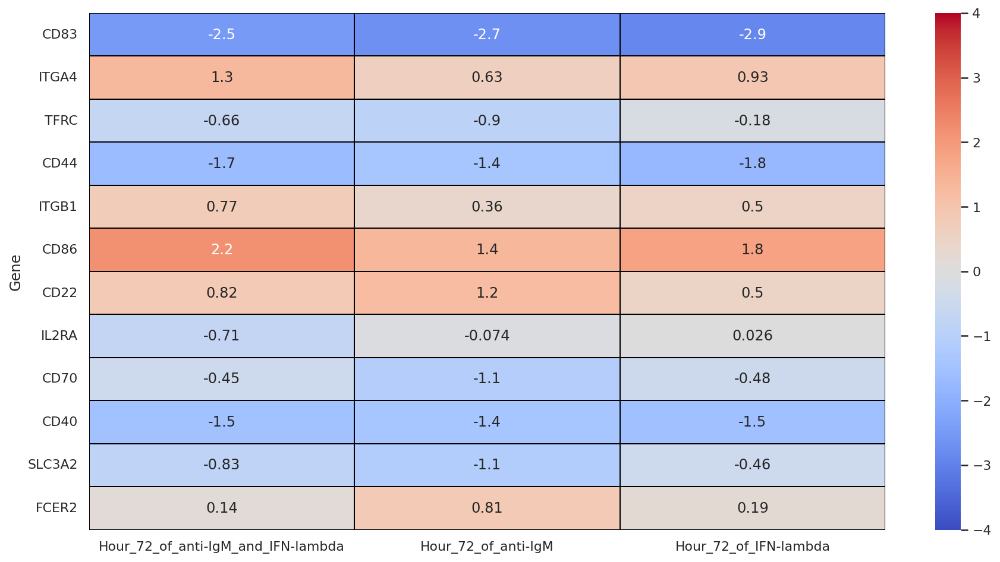

In [36]:
#просто верхние три графика собрали в один

plt.figure(figsize=(15,8))
sns.heatmap(stimulation_expr_edgeR_GSE156195.loc[expr_TPM_list_gene_marker_GSE156195.index, :], annot = True, vmin=-4, vmax=4, center =0,
                cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=True, cbar=True)

### Поиск

edgeR вывожу список хороших генов

In [37]:
list_edgeR_good_GSE156195 = []
control = 'Without_stimulation'
for interest in list_Stimulation_no_control_GSE156195:
    DE = calculate_diff_expr_between_two_group_list(
                                expr_counts_GSE156195, 
                                dict_stimulations_GSE156195[control], 
                                dict_stimulations_GSE156195[interest], '')
    list_edgeR_good_GSE156195.append(DE)

list_edgeR_good_GSE156195

[Index(['LAG3', 'IFI27', 'CENPA', 'DLGAP5', 'FAM72D', 'PBK', 'MYO7B',
        'CTD-3074O7.11', 'TICRR', 'PSRC1',
        ...
        'NUDT1', 'ARHGDIB', 'FERMT2', 'IGHV1-18', 'POLD4', 'MZT2A', 'H2AFB2',
        'BEND5', 'ARIH2OS', 'TMEM121'],
       dtype='object', length=3720),
 Index(['CENPA', 'FAM72D', 'MYO7B', 'AC009022.1', 'DLGAP5', 'RP11-599B13.6',
        'PBK', 'PRKCDBP', 'CHI3L1', 'PDK4',
        ...
        'PKHD1', 'FKSG59', 'TMEM206', 'GABPB2', 'C8orf44', 'TMTC4', 'MSL1',
        'NDFIP2', 'DDIAS', 'PM20D2'],
       dtype='object', length=3506),
 Index(['LAG3', 'IFI27', 'CENPA', 'DLGAP5', 'FAM72D', 'CHI3L1', 'PBK',
        'CTD-3074O7.11', 'LGALS9C', 'TICRR',
        ...
        'MEF2C', 'PPM1M', 'TRBV5-4', 'HCAR2', 'TTC21A', 'TBC1D2', 'C19orf66',
        'IL26', 'QARS', 'PTCD2'],
       dtype='object', length=3799)]

In [38]:
list_peresech_GSE156195 = []
for i in range(len(list_edgeR_good_GSE156195)):
               list_peresech_GSE156195 = list_peresech_GSE156195 + list(list_edgeR_good_GSE156195[i])

list_peresech_GSE156195 = list(set(list_peresech_GSE156195))

вывожу экспрессию в TPM и удаляю те гены, у которых меньше 10

In [39]:
expr_TPM_good_GSE156195 = expr_TPM_GSE156195.loc[expr_TPM_GSE156195.index.isin(list_peresech_GSE156195)]
expr_TPM_good_GSE156195.shape[0]

5089

In [40]:
with_GSE156195 = cells_GSE156195.loc[cells_GSE156195.Stimulation != 'Without_stimulation']

In [41]:
expr_TPM_good_GSE156195 = expr_TPM_good_GSE156195[with_GSE156195.index]
expr_TPM_good_GSE156195 = expr_TPM_good_GSE156195[(expr_TPM_good_GSE156195 >= 10).all(axis=1)]
expr_TPM_good_GSE156195.shape[0]

804

In [42]:
final_list_GSE156195 = []
for gene in expr_TPM_good_GSE156195.index:
    final_list_GSE156195.append(gene)

отрисовываю

In [43]:
list_edgeR_final_GSE156195 = []
control = 'Without_stimulation'
for interest in list_Stimulation_no_control_GSE156195:
    DE = calculate_diff_expr_between_two_group_final(final_list_GSE156195,
                                expr_counts_GSE156195, 
                                dict_stimulations_GSE156195[control], 
                                dict_stimulations_GSE156195[interest], '')
    list_edgeR_final_GSE156195.append(DE)

list_edgeR_final_GSE156195

[             logFC    logCPM         PValue            FDR
 UBE2C     6.713158  3.975681  3.709702e-67   3.101002e-64 
 IFI6      4.277973  8.789204  9.776722e-72   1.153768e-68 
 OAS1      4.276683  8.853778  7.535131e-142  7.558489e-138
 ISG15     4.172919  9.112253  1.833671e-71   2.043729e-68 
 TNFRSF17  4.113046  4.185724  2.367612e-33   2.668485e-31 
 ...            ...       ...           ...            ... 
 CRYZ      0.248508  4.713684  2.348249e-01   4.595421e-01 
 SDF2L1    0.149878  4.091224  5.324736e-01   8.174537e-01 
 C12orf75  0.146384  2.758760  6.680487e-01   9.475936e-01 
 FCGRT     0.137167  4.872964  5.362744e-01   8.208390e-01 
 C16orf74  0.047343  5.131401  7.868955e-01   1.000000e+00 
 
 [804 rows x 4 columns],
               logFC    logCPM        PValue           FDR
 UBE2C      5.685897  2.966318  3.496830e-28  4.772341e-26
 KCNG1      3.987171  5.881775  9.545804e-59  8.704906e-56
 TNFRSF17   3.898375  3.983936  3.494505e-27  4.248895e-25
 CD200      3.693

In [44]:
#for i in list_edgeR_final_GSE156195:
#    draw_logFC_stat_final(i[:80], (25,2))
#    draw_logFC_stat_final(i[80:], (25,2))

In [45]:
#stimulation_expr_edgeR_GSE156195_final = pd.concat([x[['logFC']] for x in list_edgeR_final_GSE156195], axis=1)
#stimulation_expr_edgeR_GSE156195_final.columns = list_Stimulation_no_control_GSE156195
#stimulation_expr_edgeR_GSE156195_final.head()

In [46]:
#просто верхние три графика собрали в один

#plt.figure(figsize=(10,40))
#sns.heatmap(stimulation_expr_edgeR_GSE156195_final, annot = True, vmin=1, vmax=4, center =0,
#                cmap= 'coolwarm',  linewidths=1, linecolor='black', xticklabels=True, cbar=True)

### Проверка

In [47]:
#for gene in final_list_GSE156195:
#    genes_expression_chart(gene)

## GSE151415

### Download

In [48]:
cells_GSE151415 = cells[cells.Dataset == 'GSE151415']
cells_GSE151415

,Run,Dataset,Cell_type,Cell_type_details,Extended_details,Stimulation,Therapy,Modification,Diagnosis,GSM,Sorting_markers,Comment,Cell_origin,Rna_extraction_kit,Library_preparation_kit,Cells_isolation_kit,Donor_id,Gender,Age,Age_range,PMID,Material_type,Layout,Readcounts,To_check,QC_bad,QC_good,QC_score,Who_checks,Decision,Expression_comment,Run_id,Sample_id,Run_tiledb_id,Sample_tiledb_id,Spike_in,Response,Material_sampling_time,Only for target (CR type),Prior_surgery,Diagnosis_comment,Stage,Combo_class,Measurement_method,Race/Ethnicity,UMI (Only for target),Deconvolution_cell_type,Filter_tag,Severity,
Sample,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
SRX8421707,SRR11872000,GSE151415,Transitional_B_cells,,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4577676,CD19+ CD24high CD38high CD39low IgD+,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,1,No_data,No_data,,33750787,,PAIRED,25709185,,,,4.08333,,,,141377,117525,129534,105353,,,,,,,,,,,,,,,
SRX8421708,SRR11872001,GSE151415,Breg_cells,B10-like Bregs,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4577677,CD19+ CD27+ CD39high IgD+,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,1,No_data,No_data,,33750787,,PAIRED,21495908,,,,4.08333,,,,141345,117493,129502,105321,,,,,,,,,,,,,,,
SRX8421709,SRR11872002,GSE151415,B_cells,,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4577678,CD19+ CD27- CD39high IgD+,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,1,No_data,No_data,,33750787,,PAIRED,21591885,,,,4.08333,,,,141371,117519,129528,105347,,,,,,,,,,,,,,,
SRX8421710,SRR11872003,GSE151415,Breg_cells,B10-like Bregs,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4577679,CD19+ CD27+ CD39high IgD-,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,1,No_data,No_data,,33750787,,PAIRED,26158401,,,,4.08333,,,,141323,117471,129480,105299,,,,,,,,,,,,,,,
SRX8421711,SRR11872004,GSE151415,B_cells,,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4577680,CD19+ CD27- CD39low IgD+,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,1,No_data,No_data,,33750787,,PAIRED,24993235,,,,4.08333,,,,141333,117481,129490,105309,,,,,,,,,,,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRX8421770,SRR11872063,GSE151415,Breg_cells,B10-like Bregs,,Without_stimulation,Without_therapy,Without_modification,Healthy,GSM4577739,CD19+ CD27+ CD39high IgD-,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,6,No_data,No_data,,33750787,,PAIRED,31747748,,,,4.08333,,,,141379,117527,129536,105355,,,,,,,,,,,,,,,
SRX8421771,SRR11872064,GSE151415,Transitional_B_cells,,,Hour_16_of_CpG-B,Without_therapy,Without_modification,Healthy,GSM4577740,CD19+ CD24high CD38high CD39low IgD+,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,6,No_data,No_data,,33750787,,PAIRED,52915953,,,,4.66667,,,,141314,117462,129471,105290,,,,,,,,,,,,,,,
SRX8421772,SRR11872065,GSE151415,Breg_cells,B10-like Bregs,,Hour_16_of_CpG-B,Without_therapy,Without_modification,Healthy,GSM4577741,CD19+ CD27+ CD39high IgD+,,PBMC,RNAqueous™- Micro Total RNA Isolation Kit (Invitrogen),SMART-Seq® v4 Ultra® Low Input RNA Kit for Sequencing (Clontech-Takara),FACS,6,No_data,No_data,,33750787,,PAIRED,4279821

In [49]:
cells_GSE151415 = cells_GSE151415[(cells_GSE151415.Readcounts > 5000000)
                                & (cells_GSE151415.QC_score > 4)]

In [50]:
# в словарь записывает, какие сэмплы к каким стимуляциям относятся

dict_stimulations_GSE151415 = {}
for stimul in cells_GSE151415.Stimulation.unique():
    dict_stimulations_GSE151415[stimul] = cells_GSE151415[cells_GSE151415.Stimulation == stimul].index

dict_stimulations_GSE151415

{'Without_stimulation': Index(['SRX8421707', 'SRX8421708', 'SRX8421709', 'SRX8421710', 'SRX8421711',
        'SRX8421712', 'SRX8421719', 'SRX8421720', 'SRX8421721', 'SRX8421722',
        'SRX8421723', 'SRX8421724', 'SRX8421731', 'SRX8421732', 'SRX8421734',
        'SRX8421735', 'SRX8421736', 'SRX8421743', 'SRX8421744', 'SRX8421745',
        'SRX8421746', 'SRX8421747', 'SRX8421748', 'SRX8421755', 'SRX8421756',
        'SRX8421757', 'SRX8421758', 'SRX8421759', 'SRX8421760', 'SRX8421767',
        'SRX8421768', 'SRX8421769', 'SRX8421770'],
       dtype='object', name='Sample'),
 'Hour_16_of_CpG-B': Index(['SRX8421713', 'SRX8421714', 'SRX8421715', 'SRX8421716', 'SRX8421717',
        'SRX8421718', 'SRX8421725', 'SRX8421726', 'SRX8421727', 'SRX8421728',
        'SRX8421729', 'SRX8421730', 'SRX8421737', 'SRX8421738', 'SRX8421739',
        'SRX8421740', 'SRX8421741', 'SRX8421742', 'SRX8421749', 'SRX8421750',
        'SRX8421751', 'SRX8421752', 'SRX8421753', 'SRX8421754', 'SRX8421761',
        '

In [51]:
expr_counts_GSE151415 = read_expressions(cells_GSE151415, suf='-kallisto-Xena-gene-est_counts_without_noncoding.tsv')

In [52]:
expr_TPM_GSE151415 = read_expressions(cells_GSE151415, suf='-kallisto-Xena-gene-TPM_without_noncoding.tsv')
expr_TPM_GSE151415 = read_renorm_expressions(expr_TPM_GSE151415)

In [53]:
#cells_GSE151415, expr_counts = compare_df_annotation_with_df_expression(GSE151415, expr_counts)
#cells_GSE151415, expr_TPM = compare_df_annotation_with_df_expression(GSE151415, expr_TPM)

#cells_GSE156195 = cells_GSE156195.sort_values(by=['Donor_id'])

### Transitional_B_cells

In [54]:
cells_GSE151415_Transitional = cells_GSE151415[(cells_GSE151415.Cell_type == 'Transitional_B_cells')]
expr_counts_Transitional = expr_counts_GSE151415[cells_GSE151415_Transitional.index]
expr_TPM_Transitional = expr_TPM_GSE151415[cells_GSE151415_Transitional.index]

In [55]:
# в словарь записывает, какие сэмплы к каким стимуляциям относятся

dict_stimulations_Transitional = {}
for stimul in cells_GSE151415_Transitional.Stimulation.unique():
    dict_stimulations_Transitional[stimul] = cells_GSE151415_Transitional[cells_GSE151415_Transitional.Stimulation == stimul].index

dict_stimulations_Transitional

{'Without_stimulation': Index(['SRX8421707', 'SRX8421719', 'SRX8421731', 'SRX8421743', 'SRX8421755',
        'SRX8421767'],
       dtype='object', name='Sample'),
 'Hour_16_of_CpG-B': Index(['SRX8421713', 'SRX8421725', 'SRX8421737', 'SRX8421749', 'SRX8421761',
        'SRX8421771'],
       dtype='object', name='Sample')}

#### Референс

In [56]:
#для всех генов

list_edgeR_Transitional = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group(
                            expr_counts_GSE151415, 
                            dict_stimulations_Transitional[control], 
                            dict_stimulations_Transitional[interest], '')
list_edgeR_Transitional.append(DE)

list_edgeR_Transitional

[                    logFC     logCPM         PValue            FDR
 ITGA1           13.056736  4.289171   2.395489e-71   4.758248e-69 
 MYO7A           11.563256  2.805176   4.996544e-44   3.309563e-42 
 ARHGAP10        11.377121  2.623218   1.929984e-61   2.726714e-59 
 CSF2            11.356509  2.603416   1.486490e-57   1.785746e-55 
 BLOC1S5-TXNDC5  11.222334  2.457407   2.840498e-11   1.905889e-10 
 ...                   ...       ...            ...            ... 
 KLHDC8A        -8.771484   1.161643   1.172640e-42   7.085998e-41 
 MYO7B          -9.784568   7.015754   2.033213e-28   5.124412e-27 
 ZBTB16         -10.068598  4.226006   4.547674e-40   2.309758e-38 
 RAP1GAP2       -10.361508  4.200928   3.374467e-76   8.357846e-74 
 FOS            -10.719610  11.097111  2.016759e-107  1.618409e-104
 
 [20062 rows x 4 columns]]

In [57]:
# не будем смотреть на гены с маленьким TPM
expr_TPM_list_gene_marker_GSE151415 = expr_TPM_Transitional.loc[expr_TPM_Transitional.index.isin(list_gene_marker)]
expr_TPM_list_gene_marker_GSE151415.shape[0]

17

In [58]:
with_Transitional = cells_GSE151415_Transitional.loc[cells_GSE151415_Transitional.Stimulation != 'Without_stimulation']

In [59]:
expr_TPM_list_gene_marker_GSE151415 = expr_TPM_list_gene_marker_GSE151415[with_Transitional.index]
expr_TPM_list_gene_marker_GSE151415 = expr_TPM_list_gene_marker_GSE151415[(expr_TPM_list_gene_marker_GSE151415 >= 10).all(axis=1)]
expr_TPM_list_gene_marker_GSE151415.shape[0]

16

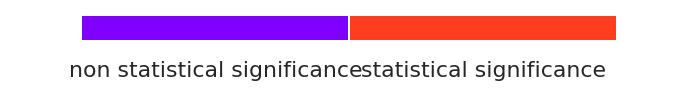

<Figure size 1800x144 with 0 Axes>

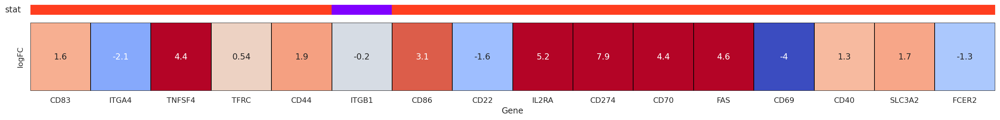

In [60]:
for i in list_edgeR_Transitional:
    draw_logFC_stat(i, expr_TPM_list_gene_marker_GSE151415.index, (25,2))

#### Поиск

edgeR вывожу список хороших генов

In [61]:
list_edgeR_good_Transitional = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group_list(
                            expr_counts_GSE151415, 
                            dict_stimulations_Transitional[control], 
                            dict_stimulations_Transitional[interest], '')
list_edgeR_good_Transitional.append(DE)

list_edgeR_good_Transitional

[Index(['ITGA1', 'MYO7A', 'ARHGAP10', 'CSF2', 'BLOC1S5-TXNDC5', 'CHRNA6',
        'CDH1', 'SEMA5B', 'TPBG', 'ATP5J2-PTCD1',
        ...
        'SNX33', 'NUBP2', 'IFT27', 'SEL1L', 'AKIP1', 'G6PD', 'APOL2', 'CCDC73',
        'TMEM258', 'FOSL2'],
       dtype='object', length=4143)]

In [62]:
list_peresech_Transitional = list_edgeR_good_Transitional[0]

вывожу экспрессию в TPM и удаляю те гены, у которых меньше 10

In [63]:
expr_TPM_good_Transitional = expr_TPM_Transitional.loc[expr_TPM_Transitional.index.isin(list_peresech_Transitional)]
expr_TPM_good_Transitional.shape[0]

3987

In [64]:
with_Transitional = cells_GSE151415_Transitional.loc[cells_GSE151415_Transitional.Stimulation != 'Without_stimulation']

In [65]:
expr_TPM_good_Transitional = expr_TPM_good_Transitional[with_Transitional.index]
expr_TPM_good_Transitional = expr_TPM_good_Transitional[(expr_TPM_good_Transitional >= 10).all(axis=1)]
expr_TPM_good_Transitional.shape[0]

1935

In [66]:
final_list_Transitional = []
for gene in expr_TPM_good_Transitional.index:
    final_list_Transitional.append(gene)

отрисовываю

In [67]:
list_edgeR_final_Transitional = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group_final(final_list_Transitional,
                            expr_counts_GSE151415, 
                            dict_stimulations_Transitional[control], 
                            dict_stimulations_Transitional[interest], '')
list_edgeR_final_Transitional.append(DE)

list_edgeR_final_Transitional

[             logFC    logCPM         PValue            FDR
 CSF2     11.356509  2.603416  1.486490e-57   1.785746e-55 
 LOR      9.304949   2.982053  2.066926e-55   2.229391e-53 
 FXYD2    8.738345   4.626435  6.234137e-44   4.073917e-42 
 WNT4     8.343647   4.564505  5.094280e-86   2.085744e-83 
 CD274    7.913625   6.146313  4.169695e-136  6.971035e-133
 ...           ...        ...            ...            ...
 SEL1L    1.001413   6.631167  6.416503e-14   5.498841e-13 
 AKIP1    1.001231   3.103377  8.299162e-05   2.670374e-04 
 G6PD     1.001155   3.750145  1.795060e-04   5.499770e-04 
 APOL2    1.000830   3.819175  2.869870e-05   9.831853e-05 
 TMEM258  1.000697   5.244207  1.551068e-08   7.917948e-08 
 
 [1935 rows x 4 columns]]

In [68]:
final_Transitional = []

for ind in list_edgeR_final_Transitional[0].index:
    final_Transitional.append(ind)

очень очень много генов, отрисовывать не буду

#### Проверка

In [69]:
#for gene in final_Transitional:
#    genes_expression_chart(gene)

### B cells (SM: CD19+ CD27- CD39high IgD+)

In [70]:
cells_GSE151415_B_high = cells_GSE151415[(cells_GSE151415.Cell_type == 'B_cells') & (cells_GSE151415.Sorting_markers == 'CD19+ CD27- CD39high IgD+')]
expr_counts_B_high = expr_counts_GSE151415[cells_GSE151415_B_high.index]
expr_TPM_B_high = expr_TPM_GSE151415[cells_GSE151415_B_high.index]

In [71]:
dict_stimulations_B_high = {}
for stimul in cells_GSE151415_B_high.Stimulation.unique():
    dict_stimulations_B_high[stimul] = cells_GSE151415_B_high[cells_GSE151415_B_high.Stimulation == stimul].index

dict_stimulations_B_high

{'Without_stimulation': Index(['SRX8421709', 'SRX8421721', 'SRX8421745', 'SRX8421757', 'SRX8421769'], dtype='object', name='Sample'),
 'Hour_16_of_CpG-B': Index(['SRX8421715', 'SRX8421727', 'SRX8421739', 'SRX8421751', 'SRX8421763',
        'SRX8421773'],
       dtype='object', name='Sample')}

#### Референс

In [72]:
#для всех генов

list_edgeR_B_high = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group(
                            expr_counts_GSE151415, 
                            dict_stimulations_B_high[control], 
                            dict_stimulations_B_high[interest], '')
list_edgeR_B_high.append(DE)

list_edgeR_B_high

[                  logFC     logCPM         PValue            FDR
 ITGA1         13.970143  5.395425   1.397966e-89   1.649764e-86 
 ATP5J2-PTCD1  11.954862  3.393339   1.251938e-57   4.330409e-55 
 IGSF3         11.499275  4.500793   8.587140e-67   4.785422e-64 
 HNF1B         11.347704  4.344839   4.299655e-55   1.347808e-52 
 CSF2          10.648011  2.111718   6.340956e-34   5.192337e-32 
 ...                 ...       ...            ...            ... 
 RAP1GAP2     -8.840863   3.463197   4.656352e-73   3.459842e-70 
 GPA33        -9.342913   1.767843   6.330447e-45   1.104360e-42 
 MYO7B        -10.022738  5.508238   8.813818e-29   4.994995e-27 
 ZBTB16       -10.491175  6.100975   1.320877e-62   5.888762e-60 
 FOS          -10.631670  10.890756  1.676847e-123  8.410225e-120
 
 [20062 rows x 4 columns]]

In [73]:
# не будем смотреть на гены с маленьким TPM
expr_TPM_list_gene_marker_GSE151415 = expr_TPM_B_high.loc[expr_TPM_B_high.index.isin(list_gene_marker)]
expr_TPM_list_gene_marker_GSE151415.shape[0]

17

In [74]:
with_B_high = cells_GSE151415_B_high.loc[cells_GSE151415_B_high.Stimulation != 'Without_stimulation']

In [75]:
expr_TPM_list_gene_marker_GSE151415 = expr_TPM_list_gene_marker_GSE151415[with_B_high.index]
expr_TPM_list_gene_marker_GSE151415 = expr_TPM_list_gene_marker_GSE151415[(expr_TPM_list_gene_marker_GSE151415 >= 10).all(axis=1)]
expr_TPM_list_gene_marker_GSE151415.shape[0]

17

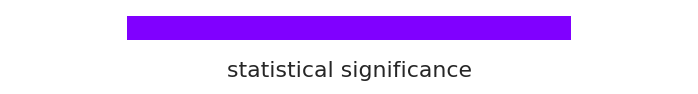

<Figure size 1800x144 with 0 Axes>

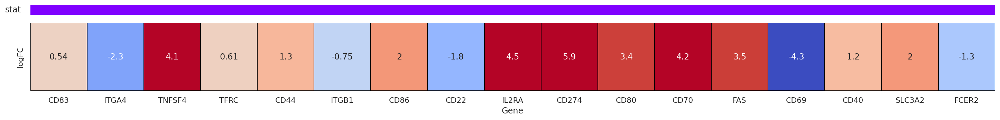

In [76]:
for i in list_edgeR_B_high:
    draw_logFC_stat(i, expr_TPM_list_gene_marker_GSE151415.index, (25,2))

#### Поиск

edgeR вывожу список хороших генов

In [77]:
list_edgeR_good_B_high = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group_list(
                            expr_counts_GSE151415, 
                            dict_stimulations_B_high[control], 
                            dict_stimulations_B_high[interest], '')
list_edgeR_good_B_high.append(DE)

list_edgeR_good_B_high

[Index(['ITGA1', 'ATP5J2-PTCD1', 'IGSF3', 'HNF1B', 'CSF2', 'GPRC5C', 'NCS1',
        'CDH1', 'CHAC1', 'CBS',
        ...
        'PGM1', 'FKBP2', 'TRMT112', 'LRRC40', 'ANKRD46', 'ASCL3', 'ZNF446',
        'RPS6KA2', 'TMEM216', 'ZMYND19'],
       dtype='object', length=3814)]

In [78]:
list_peresech_B_high = list_edgeR_good_B_high[0]

вывожу экспрессию в TPM и удаляю те гены, у которых меньше 10

In [79]:
expr_TPM_good_B_high = expr_TPM_B_high.loc[expr_TPM_B_high.index.isin(list_peresech_B_high)]
expr_TPM_good_B_high.shape[0]

3644

In [80]:
with_B_high = cells_GSE151415_B_high.loc[cells_GSE151415_B_high.Stimulation != 'Without_stimulation']

In [81]:
expr_TPM_good_B_high = expr_TPM_good_B_high[with_B_high.index]
expr_TPM_good_B_high = expr_TPM_good_B_high[(expr_TPM_good_B_high >= 10).all(axis=1)]
expr_TPM_good_B_high.shape[0]

1818

In [82]:
final_list_B_high = []
for gene in expr_TPM_good_B_high.index:
    final_list_B_high.append(gene)

отрисовываю

In [83]:
list_edgeR_final_B_high = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group_final(final_list_B_high,
                            expr_counts_GSE151415, 
                            dict_stimulations_B_high[control], 
                            dict_stimulations_B_high[interest], '')
list_edgeR_final_B_high.append(DE)

list_edgeR_final_B_high

[             logFC    logCPM         PValue           FDR
 CSF2     10.648011  2.111718  6.340956e-34   5.192337e-32
 GPRC5C   10.042552  4.939748  7.356573e-87   8.199310e-84
 FCRL4    9.154527   4.503936  4.948628e-79   4.727590e-76
 CCL22    8.687288   8.968705  6.444252e-25   2.627735e-23
 WNT4     8.263749   5.768028  1.438917e-100  2.624324e-97
 ...           ...        ...            ...           ...
 LRRC40   1.002508   5.467674  1.502424e-08   1.103685e-07
 ANKRD46  1.002107   4.549368  1.043324e-05   5.096463e-05
 ZNF446   1.001205   3.696578  4.479127e-04   1.619395e-03
 TMEM216  1.000557   4.831285  3.933998e-06   2.060675e-05
 ZMYND19  1.000176   5.004599  6.444116e-07   3.747300e-06
 
 [1818 rows x 4 columns]]

очень очень много генов, отрисовывать не буду

In [84]:
final_B_high = []

for ind in list_edgeR_final_B_high[0].index:
    final_B_high.append(ind)

очень очень много генов, отрисовывать не буду

#### Проверка

In [85]:
#for gene in final_B_high:
#    genes_expression_chart(gene)

### B cells (SM: CD19+ CD27- CD39low IgD+)

In [86]:
cells_GSE151415_B_low = cells_GSE151415[(cells_GSE151415.Cell_type == 'B_cells') & (cells_GSE151415.Sorting_markers == 'CD19+ CD27- CD39low IgD+')]
expr_counts_B_low = expr_counts_GSE151415[cells_GSE151415_B_low.index]
expr_TPM_B_low = expr_TPM_GSE151415[cells_GSE151415_B_low.index]

In [87]:
dict_stimulations_B_low = {}
for stimul in cells_GSE151415_B_low.Stimulation.unique():
    dict_stimulations_B_low[stimul] = cells_GSE151415_B_low[cells_GSE151415_B_low.Stimulation == stimul].index

dict_stimulations_B_low

{'Without_stimulation': Index(['SRX8421711', 'SRX8421723', 'SRX8421735', 'SRX8421747', 'SRX8421759'], dtype='object', name='Sample'),
 'Hour_16_of_CpG-B': Index(['SRX8421717', 'SRX8421729', 'SRX8421741', 'SRX8421753', 'SRX8421765'], dtype='object', name='Sample')}

#### Референс

In [88]:
#для всех генов

list_edgeR_B_low = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group(
                            expr_counts_GSE151415, 
                            dict_stimulations_B_low[control], 
                            dict_stimulations_B_low[interest], '')
list_edgeR_B_low.append(DE)

list_edgeR_B_low

[                  logFC     logCPM         PValue            FDR
 ATP5J2-PTCD1  11.944976  3.354244   5.224633e-59   1.977672e-56 
 COL9A3        11.617871  3.032463   1.148022e-23   4.280970e-22 
 IGSF3         11.232097  4.012566   5.041308e-56   1.714216e-53 
 ITGA1         10.889867  4.700351   1.507088e-76   1.314574e-73 
 CHRNA6        10.540509  1.969030   5.545534e-39   6.661946e-37 
 ...                 ...       ...            ...            ... 
 NKX6-3       -9.235943   0.687839   5.432450e-07   3.295609e-06 
 F12          -9.246923   0.715708   2.682358e-24   1.074121e-22 
 FOS          -10.413980  11.053687  5.737768e-114  1.438889e-110
 GPA33        -10.757820  2.177981   2.630384e-38   2.964649e-36 
 ZBTB16       -14.187803  5.587486   1.899336e-120  5.443497e-117
 
 [20062 rows x 4 columns]]

In [89]:
# не будем смотреть на гены с маленьким TPM
expr_TPM_list_gene_marker_GSE151415 = expr_TPM_B_low.loc[expr_TPM_B_low.index.isin(list_gene_marker)]
expr_TPM_list_gene_marker_GSE151415.shape[0]

17

In [90]:
with_B_low = cells_GSE151415_B_low.loc[cells_GSE151415_B_low.Stimulation != 'Without_stimulation']

In [91]:
expr_TPM_list_gene_marker_GSE151415 = expr_TPM_list_gene_marker_GSE151415[with_B_low.index]
expr_TPM_list_gene_marker_GSE151415 = expr_TPM_list_gene_marker_GSE151415[(expr_TPM_list_gene_marker_GSE151415 >= 10).all(axis=1)]
expr_TPM_list_gene_marker_GSE151415.shape[0]

16

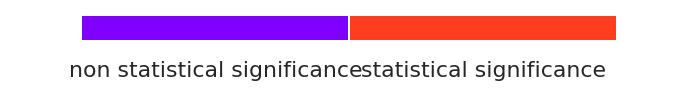

<Figure size 1800x144 with 0 Axes>

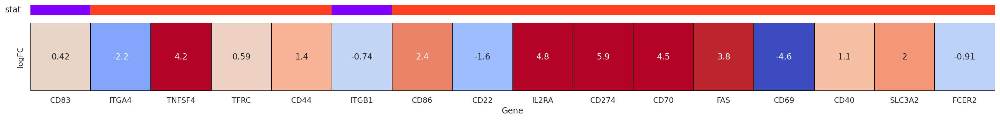

In [92]:
for i in list_edgeR_B_low:
    draw_logFC_stat(i, expr_TPM_list_gene_marker_GSE151415.index, (25,2))

#### Поиск

edgeR вывожу список хороших генов

In [93]:
list_edgeR_good_B_low = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group_list(
                            expr_counts_GSE151415, 
                            dict_stimulations_B_low[control], 
                            dict_stimulations_B_low[interest], '')
list_edgeR_good_B_low.append(DE)

list_edgeR_good_B_low

[Index(['ATP5J2-PTCD1', 'COL9A3', 'IGSF3', 'ITGA1', 'CHRNA6', 'GPRC5C',
        'COLGALT2', 'NPR1', 'EPB41L4B', 'NCS1',
        ...
        'THG1L', 'MSMP', 'COPE', 'PRKAG1', 'RAB27A', 'ZNF563', 'RASL11B',
        'DUSP22', 'KDELR2', 'OR2T35'],
       dtype='object', length=3747)]

In [94]:
list_peresech_B_low = list_edgeR_good_B_low[0]

вывожу экспрессию в TPM и удаляю те гены, у которых меньше 10

In [95]:
expr_TPM_good_B_low = expr_TPM_B_low.loc[expr_TPM_B_low.index.isin(list_peresech_B_low)]
expr_TPM_good_B_low.shape[0]

3595

In [96]:
with_B_low = cells_GSE151415_B_low.loc[cells_GSE151415_B_low.Stimulation != 'Without_stimulation']

In [97]:
expr_TPM_good_B_low = expr_TPM_good_B_low[with_B_low.index]
expr_TPM_good_B_low = expr_TPM_good_B_low[(expr_TPM_good_B_low >= 10).all(axis=1)]
expr_TPM_good_B_low.shape[0]

1856

In [98]:
final_list_B_low = []
for gene in expr_TPM_good_B_low.index:
    final_list_B_low.append(gene)

отрисовываю

In [99]:
list_edgeR_final_B_low = []
control = 'Without_stimulation'
interest = 'Hour_16_of_CpG-B'
DE = calculate_diff_expr_between_two_group_final(final_list_B_low,
                            expr_counts_GSE151415, 
                            dict_stimulations_B_low[control], 
                            dict_stimulations_B_low[interest], '')
list_edgeR_final_B_low.append(DE)

list_edgeR_final_B_low

[                  logFC    logCPM         PValue           FDR
 ATP5J2-PTCD1  11.944976  3.354244  5.224633e-59   1.977672e-56
 GPRC5C        10.171415  4.884367  7.619039e-103  1.389574e-99
 CCL22         8.454563   8.764010  3.878969e-27   1.975124e-25
 WNT4          8.148371   5.316524  8.413749e-75   6.251727e-72
 PSAT1         8.141651   7.350710  2.302829e-28   1.286890e-26
 ...                ...        ...           ...            ...
 COPE          1.003004   8.111242  5.749296e-10   5.169986e-09
 PRKAG1        1.002456   5.356949  6.624756e-08   4.560942e-07
 RAB27A        1.002201   5.229429  3.894263e-05   1.765176e-04
 DUSP22        1.000769   8.430303  8.949566e-08   6.055521e-07
 KDELR2        1.000526   6.172003  7.298899e-09   5.704344e-08
 
 [1856 rows x 4 columns]]

очень очень много генов, отрисовывать не буду

In [100]:
final_B_low = []

for ind in list_edgeR_final_B_low[0].index:
    final_B_low.append(ind)

#### Проверка

In [101]:
#for gene in final_B_low:
#   genes_expression_chart(gene)

## Итоговый список общий

In [112]:
FINAL = set(final_list_GSE156195 + final_Transitional + final_B_high + final_B_low)

In [114]:
FINAL = list(FINAL)
len(FINAL)

2818

## Отбираем нужные гены (специфичность)

### Download data

In [ ]:
from mldeconv.data_loading import read_expressions

cells = get_gspread('Cells', 'Cells')
cells_to_check = get_gspread('Annotation calculated', 'Cells_to_check')

cols = cells.columns.intersection(cells_to_check.columns)
cells = pd.concat([cells[cols], cells_to_check[cols]])
cells = cells[(cells.Material_type == 'polyA RNA')]
cells = cells[(cells.Stimulation.isin(['Without_stimulation', 'Without_treatment']))]
cells = cells.replace('',np.NaN)
cells = cells[(cells.Readcounts > 5000000)
                                & (cells.QC_score > 4)]

cells_expr = read_expressions(cells)
cells_expr = renorm_expressions(cells_expr)

cells = cells[~cells.index.duplicated()]
cells_expr = cells_expr.loc[:, ~cells_expr.columns.duplicated()]
idx = cells.index.intersection(cells_expr.columns)
cells = cells.loc[idx]
cells_expr = cells_expr[idx]

groups = cells_expr.T.groupby(cells.Cell_type).groups

medians = pd.concat([
    cells_expr[groups[cell_type]].median(axis=1).rename(cell_type)
    for cell_type in groups
],
                  axis=1)

In [ ]:
medians.head()

In [ ]:
blood_cell_types = [ 
        'B_cells', 
        'Basophils',
        'CD4_T_cells', 
        'CD4_T_helpers', 
        'CD4_Tregs',
        'CD8_Central_Memory', 
        'CD8_Naive_T_cells', 
        'CD8_TEMRA', 
        'CD8_T_cells',
        'CD8_Transitional_Memory', 
        'Central_memory_CD4_T_cells',
    
        'Class-switched_memory ', 
        'Class_switched_memory_B_cells',
    
        'Classical_monocytes', 
        'Cytotoxic_NK_cells',
        'Effector_memory_CD4_T_cells',
        'Eosinophils', 
        'Granulocytes', 
        'IgA_memory_B_cells',
        'IgG_memory_B_cells',
        'Inter_monocytes',
        'MAIT_cells',  
        'Memory_B_cells',
        'Memory_CD4_T_cells', 
        'Memory_CD8_T_cells', 
        'Monocytes', 
        'NK_cells',  
        'Naive_B_cells',
        'Naive_CD4_T_cells', 
        'Neutrophils', 
        'Non-classical_monocytes',
        'Non-switch_memory_IgM_B_cells', 
        'Non_plasma_B_cells',
        'Non_switched_memory_B_cells',
    
        'Plasma_B_cells', 
        'Plasmablasts', 
    
        'Plasmacytoid_dendritic_cells',
        'Platelets', 
        'Regulatory_NK_cells', 
        'T_cells',  
        'gd_T_cells', 
        'iNKT'
    ] 

In [ ]:
cells = medians[blood_cell_types]
cells = cells.loc[cells.index.isin(FINAL)]
cells.head()

In [ ]:
for ind in cells.index:
    cells['Plasma_B_cells'][ind] = (cells['Plasma_B_cells'][ind] + cells['Plasmablasts'][ind])/2
    cells['Class_switched_memory_B_cells'][ind] = (cells['Class-switched_memory '][ind] + cells['Class_switched_memory_B_cells'][ind])/2
    cells['Non-switch_memory_IgM_B_cells'][ind] = (cells['Non_switched_memory_B_cells'][ind] + cells['Non-switch_memory_IgM_B_cells'][ind])/2

cells = cells.drop('Plasmablasts', 1)
cells = cells.drop('Class-switched_memory ', 1)
cells = cells.drop('Non_switched_memory_B_cells', 1)

cells = cells.drop('T_cells', 1)
cells = cells.drop('B_cells', 1)

cells.head()

Умножаем на коэффициент от команды деконволюции:

In [ ]:
for ind in cells.index:

    cells['CD4_T_cells'][ind] = cells['CD4_T_cells'][ind] * 0.71030 
    cells['CD4_T_helpers'][ind] = cells['CD4_T_helpers'][ind] * 0.66952 
    cells['CD4_Tregs'][ind] = cells['CD4_Tregs'][ind] * 0.05823 
    cells['CD8_Central_Memory'][ind] = cells['CD8_Central_Memory'][ind] * 0.01386 
    cells['CD8_Naive_T_cells'][ind] = cells['CD8_Naive_T_cells'][ind] * 0.07062 
    cells['CD8_TEMRA'][ind] = cells['CD8_TEMRA'][ind] * 0.02746 
    cells['CD8_T_cells'][ind] = cells['CD8_T_cells'][ind] * 0.21093 
    cells['CD8_Transitional_Memory'][ind] = cells['CD8_Transitional_Memory'][ind] * 0.01478 
    cells['Central_memory_CD4_T_cells'][ind] = cells['Central_memory_CD4_T_cells'][ind] * 0.21968 
    cells['Effector_memory_CD4_T_cells'][ind] = cells['Effector_memory_CD4_T_cells'][ind] * 0.04955 
    cells['MAIT_cells'][ind] = cells['MAIT_cells'][ind] * 0.01079 
    cells['Memory_CD4_T_cells'][ind] = cells['Memory_CD4_T_cells'][ind] * 0.46347 
    cells['Memory_CD8_T_cells'][ind] = cells['Memory_CD8_T_cells'][ind] * 0.11076 
    cells['Naive_CD4_T_cells'][ind] = cells['Naive_CD4_T_cells'][ind] * 0.14410 
    cells['gd_T_cells'][ind] = cells['gd_T_cells'][ind] * 0.0781 
    cells['iNKT'][ind] = cells['iNKT'][ind] * 0.00006 

    cells['Plasma_B_cells'][ind] = cells['Plasma_B_cells'][ind] * 5 * 0.00516
    cells['Naive_B_cells'][ind] = cells['Naive_B_cells'][ind] * 0.65857
    cells['Non-switch_memory_IgM_B_cells'][ind] = cells['Non-switch_memory_IgM_B_cells'][ind] * 0.09103
    cells['Non_plasma_B_cells'][ind] = cells['Non_plasma_B_cells'][ind] * 0.99484
    cells['Memory_B_cells'][ind] = cells['Memory_B_cells'][ind] * 0.33627
    cells['Class_switched_memory_B_cells'][ind] = cells['Class_switched_memory_B_cells'][ind] * 0.17270
    cells['IgA_memory_B_cells'][ind] = cells['IgA_memory_B_cells'][ind] * 0.33627
    cells['IgG_memory_B_cells'][ind] = cells['IgG_memory_B_cells'][ind] * 0.33627

### PBMC

Умножаем на коэффициент Динары относительно T клеток (то есть T клетки принимаю за 1)

In [ ]:
for ind in cells.index: 

    cells['Plasma_B_cells'][ind] = cells['Plasma_B_cells'][ind] * 0.1559633028
    cells['Naive_B_cells'][ind] = cells['Naive_B_cells'][ind] * 0.1559633028
    cells['Non-switch_memory_IgM_B_cells'][ind] = cells['Non-switch_memory_IgM_B_cells'][ind] * 0.1559633028
    cells['Non_plasma_B_cells'][ind] = cells['Non_plasma_B_cells'][ind] * 0.1559633028
    cells['Memory_B_cells'][ind] = cells['Memory_B_cells'][ind] * 0.1559633028
    cells['Class_switched_memory_B_cells'][ind] = cells['Class_switched_memory_B_cells'][ind] * 0.1559633028
    cells['IgA_memory_B_cells'][ind] = cells['IgA_memory_B_cells'][ind] * 0.1559633028
    cells['IgG_memory_B_cells'][ind] = cells['IgG_memory_B_cells'][ind] * 0.1559633028


    cells['Classical_monocytes'][ind] = cells['Classical_monocytes'][ind] * 0.8990825688
    cells['Cytotoxic_NK_cells'][ind] = cells['Cytotoxic_NK_cells'][ind] * 0.1467889908
    cells['Granulocytes'][ind] = cells['Granulocytes'][ind] * 0
    cells['Inter_monocytes'][ind] = cells['Inter_monocytes'][ind] * 0.8990825688
    cells['Monocytes'][ind] = cells['Monocytes'][ind] * 0.8990825688
    cells['NK_cells'][ind] = cells['NK_cells'][ind] * 0.1467889908
    cells['Neutrophils'][ind] = cells['Neutrophils'][ind] * 0
    cells['Non-classical_monocytes'][ind] = cells['Non-classical_monocytes'][ind] * 0.8990825688
    cells['Regulatory_NK_cells'][ind] = cells['Regulatory_NK_cells'][ind] * 0.1467889908

In [ ]:
df1 = cells.T
B_cells = [ 
           'Plasma_B_cells',        
           'Naive_B_cells', 
           'Non-switch_memory_IgM_B_cells',
           'Non_plasma_B_cells', 
           'Memory_B_cells', 
           'Class_switched_memory_B_cells',
           'IgA_memory_B_cells',
           'IgG_memory_B_cells']

df1_B_cells = df1.loc[df1.index.isin(B_cells)]
    
for gene in FINAL:
    count_only_B = 0
    for ind in df1_B_cells.index:
        count_only_B += df1_B_cells[gene][ind]
    
    count_all = 0
    for ind in df1.index:
        count_all += df1[gene][ind]
    
    final_procent = count_only_B/count_all * 100
    print(gene, final_procent)

In [ ]:
num_cells_to_show = 10
figsize=(7, 7)

for gene in FINAL:

    exp_1 = cells.loc[gene].sort_values(
            ascending=False)[:num_cells_to_show]
    fig, axes = plt.subplots( figsize=figsize, constrained_layout=True)
    plt.suptitle(gene + ' in PBMC', fontweight='bold', fontsize=16)
    palette_1 = lin_colors(exp_1.index)
    axes.set_xticklabels(exp_1.index, rotation="vertical", fontsize=12)
    axes.set_ylabel('mean expression, TPM')
    exp_1.plot(kind="bar",
                ax=axes,
                color=list(exp_1.index.map(palette_1)),
                grid=False)
    plt.tight_layout()

### WB

!!! СНАЧАЛА ПРОГНАТЬ СНОВА DOWNLOAD DATA из 3.4!!!

Умножаем на коэффициент Динары относительно T клеток (то есть T клетки принимаю за 1)

In [ ]:
for ind in cells.index: 

    cells['Plasma_B_cells'][ind] = cells['Plasma_B_cells'][ind] * 0.1857142857
    cells['Naive_B_cells'][ind] = cells['Naive_B_cells'][ind] * 0.1857142857
    cells['Non-switch_memory_IgM_B_cells'][ind] = cells['Non-switch_memory_IgM_B_cells'][ind] * 0.1857142857
    cells['Non_plasma_B_cells'][ind] = cells['Non_plasma_B_cells'][ind] * 0.1857142857
    cells['Memory_B_cells'][ind] = cells['Memory_B_cells'][ind] * 0.1857142857
    cells['Class_switched_memory_B_cells'][ind] = cells['Class_switched_memory_B_cells'][ind] * 0.1857142857
    cells['IgA_memory_B_cells'][ind] = cells['IgA_memory_B_cells'][ind] * 0.1857142857
    cells['IgG_memory_B_cells'][ind] = cells['IgG_memory_B_cells'][ind] * 0.1857142857


    cells['Classical_monocytes'][ind] = cells['Classical_monocytes'][ind] * 0.6377142857
    cells['Cytotoxic_NK_cells'][ind] = cells['Cytotoxic_NK_cells'][ind] * 0.1714285714
    cells['Granulocytes'][ind] = cells['Granulocytes'][ind] * 1.164021164
    cells['Inter_monocytes'][ind] = cells['Inter_monocytes'][ind] * 0.6377142857
    cells['Monocytes'][ind] = cells['Monocytes'][ind] * 0.6377142857
    cells['NK_cells'][ind] = cells['NK_cells'][ind] * 0.1714285714
    cells['Neutrophils'][ind] = cells['Neutrophils'][ind] * 1.138624339
    cells['Non-classical_monocytes'][ind] = cells['Non-classical_monocytes'][ind] * 0.6377142857
    cells['Regulatory_NK_cells'][ind] = cells['Regulatory_NK_cells'][ind] * 0.1714285714

In [ ]:
df1 = cells.T
B_cells = [ 
           'Plasma_B_cells',        
           'Naive_B_cells', 
           'Non-switch_memory_IgM_B_cells',
           'Non_plasma_B_cells', 
           'Memory_B_cells', 
           'Class_switched_memory_B_cells',
           'IgA_memory_B_cells',
           'IgG_memory_B_cells']

df1_B_cells = df1.loc[df1.index.isin(B_cells)]
    
for gene in FINAL:
    count_only_B = 0
    for ind in df1_B_cells.index:
        count_only_B += df1_B_cells[gene][ind]
    
    count_all = 0
    for ind in df1.index:
        count_all += df1[gene][ind]
    
    final_procent = count_only_B/count_all * 100
    print(gene, final_procent)

In [ ]:
num_cells_to_show = 10
figsize=(7, 7)

for gene in FINAL:

    exp_1 = cells.loc[gene].sort_values(
            ascending=False)[:num_cells_to_show]
    fig, axes = plt.subplots( figsize=figsize, constrained_layout=True)
    plt.suptitle(gene + ' in WB', fontweight='bold', fontsize=16)
    palette_1 = lin_colors(exp_1.index)
    axes.set_xticklabels(exp_1.index, rotation="vertical", fontsize=12)
    axes.set_ylabel('mean expression, TPM')
    exp_1.plot(kind="bar",
                ax=axes,
                color=list(exp_1.index.map(palette_1)),
                grid=False)
    plt.tight_layout()

# Отобранные гены прогонялись с помощью кода из пункта 1 и 2

# Аналогично было сделано из сигнатурой GO